In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

sns.set_theme(
    style="whitegrid",
    font_scale=1,
    rc={
        "figure.dpi": 150,
        "savefig.dpi": 300
    }
)
tol_colors = [ "#0072B2", "#E69F00", "#009E73", "#F0E442", "#D55E00", "#CC79A7", "#999999",  "#56B4E9"]
sns.set_palette(tol_colors)

plt.rcParams.update({
    "font.size": 12,          # default font size for all text
    "axes.titlesize": 12,     # subplot titles
    "axes.labelsize": 12,     # x and y labels
    "xtick.labelsize": 12,    # tick labels
    "ytick.labelsize": 12,
    "legend.fontsize": 11,
    "figure.titlesize": 14,    # fig.suptitle()
    "xtick.bottom": True,   # show ticks on x-axis bottom
    "xtick.top": False,     # hide ticks on x-axis top
    "ytick.left": True,     # show ticks on y-axis left
    "ytick.right": False,   # hide ticks on y-axis right
    "xtick.direction": "out",
    "ytick.direction": "out"
})

results_df = pd.read_csv("results/big_dataset/targeted/cam_comparison_metrics_combined.csv")
untargeted_df = pd.read_csv("results/big_dataset/untargeted/cam_comparison_metrics_combined.csv")
metric_columns = [
    'mean pixel difference', 'percentage of different pixels',
    'cosine similarity', 'activation ratio', 'JS divergence',
    'important activation ratio', 'intersection over union', 'SSIM',
    'Spearman\'s rank coefficient', 'number of regions difference']
results_df

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
0,0,GradCAM,L2 Proj. Gradient Descent (PGD),tench,solar dish,0.000664,0.539809,0.124351,0.222886,43.534758,2,1,0.042184,0.943590,0.565675,0.582218,0.000698,0.179789,-0.475307,-1
1,2,GradCAM,L2 Proj. Gradient Descent (PGD),tench,sombrero,0.000386,0.565740,0.635017,0.215067,38.677854,1,1,0.321157,0.882051,0.321693,0.222324,0.200574,0.332723,0.245309,0
2,3,GradCAM,L2 Proj. Gradient Descent (PGD),goldfish,American chameleon,0.000055,0.279217,0.200578,0.205285,33.179209,1,1,0.366822,0.949585,0.265442,0.138567,0.089163,0.302233,0.249727,0
3,4,GradCAM,L2 Proj. Gradient Descent (PGD),goldfish,grasshopper,0.000055,0.342394,0.173491,0.244639,47.048390,1,1,0.466521,0.984456,0.309065,0.441416,0.235689,0.259282,-0.102608,0
4,5,GradCAM,L2 Proj. Gradient Descent (PGD),goldfish,barn spider,0.000183,0.414257,0.659785,0.217485,43.688217,1,1,0.337483,0.984456,0.372201,3.709770,0.111234,0.307784,-0.389180,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188383,2992,ScoreCAM,L2 Basic Iterative Method (BIM),bolete,mask,0.000394,0.446443,0.037094,0.150912,25.647720,1,1,0.666364,0.995215,0.178320,0.372106,0.354525,0.421872,0.500520,0
188384,2994,ScoreCAM,L2 Basic Iterative Method (BIM),ear,pomegranate,0.000039,0.425354,0.136800,0.202876,38.046078,2,1,0.540892,1.000000,0.226577,0.567117,0.161436,0.391217,0.481645,-1
188385,2995,ScoreCAM,L2 Basic Iterative Method (BIM),ear,crayfish,0.000281,0.277503,0.130514,0.206423,37.458147,1,1,0.579031,0.995215,0.156125,0.137783,0.259808,0.447356,0.100625,0
188386,2997,ScoreCAM,L2 Basic Iterative Method (BIM),toilet tissue,cellular telephone,0.000038,0.311979,0.057700,0.183075,34.440768,1,1,0.594617,1.004808,0.151014,0.727422,0.101537,0.406119,0.492072,0


In [2]:
## investigate image perturbation per attack method
## only keep relevant rows, images_mean_difference stays the same for all methods

filtered_df = results_df[results_df["method"] == "GradCAM"]
filtered_df

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
0,0,GradCAM,L2 Proj. Gradient Descent (PGD),tench,solar dish,0.000664,0.539809,0.124351,0.222886,43.534758,2,1,0.042184,0.943590,0.565675,0.582218,0.000698,0.179789,-0.475307,-1
1,2,GradCAM,L2 Proj. Gradient Descent (PGD),tench,sombrero,0.000386,0.565740,0.635017,0.215067,38.677854,1,1,0.321157,0.882051,0.321693,0.222324,0.200574,0.332723,0.245309,0
2,3,GradCAM,L2 Proj. Gradient Descent (PGD),goldfish,American chameleon,0.000055,0.279217,0.200578,0.205285,33.179209,1,1,0.366822,0.949585,0.265442,0.138567,0.089163,0.302233,0.249727,0
3,4,GradCAM,L2 Proj. Gradient Descent (PGD),goldfish,grasshopper,0.000055,0.342394,0.173491,0.244639,47.048390,1,1,0.466521,0.984456,0.309065,0.441416,0.235689,0.259282,-0.102608,0
4,5,GradCAM,L2 Proj. Gradient Descent (PGD),goldfish,barn spider,0.000183,0.414257,0.659785,0.217485,43.688217,1,1,0.337483,0.984456,0.372201,3.709770,0.111234,0.307784,-0.389180,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188247,2992,GradCAM,L2 Basic Iterative Method (BIM),bolete,mask,0.000394,0.446443,0.037094,0.177568,31.859853,1,1,0.623325,0.990112,0.194898,0.417710,0.302454,0.436047,0.312977,0
188248,2994,GradCAM,L2 Basic Iterative Method (BIM),ear,pomegranate,0.000039,0.425354,0.136800,0.143255,25.809152,2,1,0.592383,1.010582,0.272433,0.344378,0.271380,0.437506,0.107640,-1
188249,2995,GradCAM,L2 Basic Iterative Method (BIM),ear,crayfish,0.000281,0.277503,0.130513,0.181035,32.081075,2,1,0.334404,1.005155,0.289280,0.375290,0.093852,0.419376,-0.125366,-1
188250,2997,GradCAM,L2 Basic Iterative Method (BIM),toilet tissue,cellular telephone,0.000038,0.311977,0.057700,0.221370,40.923948,1,1,0.334337,0.829787,0.377617,1.822473,0.094740,0.191633,0.161415,0


## Success Rates per Attack

In [3]:
# Total number of unique images (as reference)
total_images = 2438

# Count number of unique image IDs per attack
attack_success = (
    filtered_df.groupby("attack")["image ID"]
    .nunique()
    .reset_index(name="successful_images")
)
attack_success

,attack,successful_images
0,DDN Attack,2434
1,L1 FMN,2154
2,L2 Basic Iterative Method (BIM),2268
3,L2 Carlini Wagner Attack,2437
4,L2 FMN,2424
5,L2 Proj. Gradient Descent (PGD),2074
6,Linf Basic Iterative Method (BIM),2415
7,Linf FMN,2421
8,Linf Proj. Gradient Descent (PGD),2305


In [4]:
# Calculate success rate in percent
attack_success["success_rate_percent"] = (attack_success["successful_images"] / total_images * 100).round(1)
attack_success.drop(columns=["successful_images"], inplace=True)
# Rename columns for LaTeX output
attack_success.columns = ["Attack", "Success Rate (%)"]

# Sort by success rate (ascending)
attack_success = attack_success.sort_values(by="Success Rate (%)", ascending=True)

# Convert to LaTeX
latex_table = attack_success.to_latex(index=False, column_format="lrr", float_format="%.1f")

print(latex_table)

\begin{tabular}{lrr}
\toprule
Attack & Success Rate (%) \\
\midrule
L2 Proj. Gradient Descent (PGD) & 85.1 \\
L1 FMN & 88.4 \\
L2 Basic Iterative Method (BIM) & 93.0 \\
Linf Proj. Gradient Descent (PGD) & 94.5 \\
Linf Basic Iterative Method (BIM) & 99.1 \\
Linf FMN & 99.3 \\
L2 FMN & 99.4 \\
DDN Attack & 99.8 \\
L2 Carlini Wagner Attack & 100.0 \\
\bottomrule
\end{tabular}



## Image perturbation per attack

In [5]:
# Step 1: Compute IQR or range per attack
group_stats = (
    filtered_df
    .groupby("attack")["images mean difference"]
    .agg(iqr=lambda x: x.quantile(0.75) - x.quantile(0.25),
         min_val="min",
         max_val="max")
)

group_stats["range"] = group_stats["max_val"] - group_stats["min_val"]
group_stats = group_stats.sort_values("range")  # Sort attacks by distribution range
group_stats

,iqr,min_val,max_val,range
attack,,,,
L1 FMN,0.000049,3.296845e-06,0.000284,0.000281
L2 Carlini Wagner Attack,0.000039,3.622439e-07,0.000543,0.000542
L2 Proj. Gradient Descent (PGD),0.000203,5.491087e-05,0.000664,0.000609
DDN Attack,0.000022,1.907173e-07,0.000641,0.000640
L2 FMN,0.000115,1.656220e-05,0.000661,0.000644
Linf FMN,0.000126,1.499390e-06,0.000874,0.000872
L2 Basic Iterative Method (BIM),0.000153,4.849743e-06,0.000976,0.000971
Linf Proj. Gradient Descent (PGD),0.000311,5.613942e-05,0.001161,0.001104
Linf Basic Iterative Method (BIM),0.000284,1.748016e-05,0.003678,0.003661


In [6]:
# Step 2: Group attacks by range, max 20 per group
attack_groups = []
current_group = []
current_range_start = None
threshold_range_width = 4  # Adjust depending on your metric's scale

for attack, row in group_stats.iterrows():
    if not current_group:
        current_group = [attack]
        current_range_start = row["range"]
        continue

    if (abs(row["range"] - current_range_start) < threshold_range_width and
        len(current_group) < 11):
        current_group.append(attack)
    else:
        attack_groups.append(current_group)
        current_group = [attack]
        current_range_start = row["range"]

# Append the last group
if current_group:
    attack_groups.append(current_group)

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_75227/424583877.py:47: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")


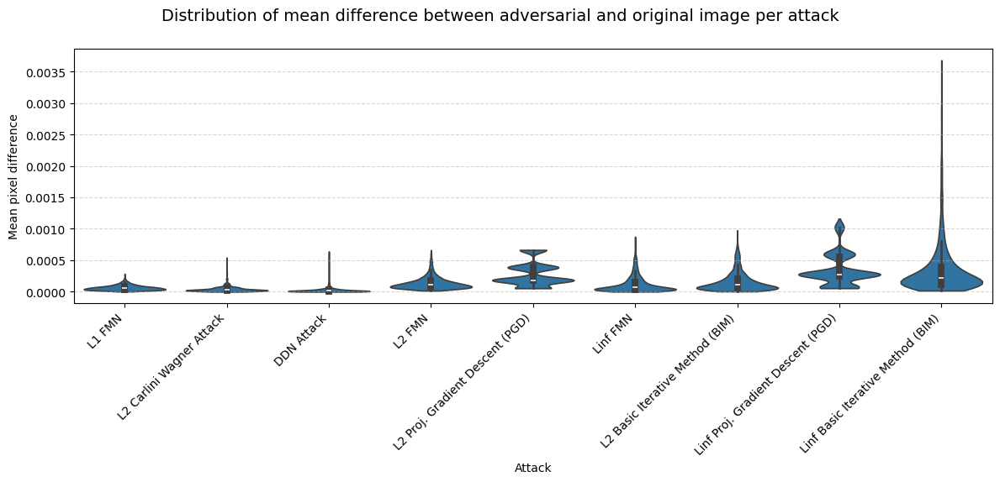

In [7]:
# Vertical stacking - all plots under each other
n_groups = len(attack_groups)
n_cols = 1  # Single column for vertical stacking
n_rows = n_groups  # One row per group




# Create the figure and subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 6 * n_rows))
fig.suptitle("Distribution of mean difference between adversarial and original image per attack", fontsize=14)
# Handle single subplot case
if n_groups == 1:
    axes = [axes]

# axes is already a 1D array when n_cols=1, so we can use it directly
axes_flat = axes

for i, group in enumerate(attack_groups):
    # Step 1: Subset the data for the current group
    df_group = filtered_df[filtered_df["attack"].isin(group)]

    # Step 2: Compute median per attack
    attack_medians = (
        df_group
        .groupby("attack")["images mean difference"]
        .max()
        .sort_values()
    )

    # Step 3: Set order based on sorted medians
    sorted_attacks = attack_medians.index.tolist()

    # Step 4: Plot on the specific subplot
    ax = axes_flat[i]
    
    sns.violinplot(
        data=df_group,
        x="attack",
        y="images mean difference",
        order=sorted_attacks,
        density_norm="width",
        cut=0,
        ax=ax  # Specify which subplot to use
    )

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
    #ax.set_title(f"Group {i+1}: Violin Plots of Mean Differences")
    ax.set_ylabel("Mean pixel difference")
    ax.grid(True, axis='y', linestyle='--', alpha=0.5)
    
    # Only show x-label and x-tick labels for the bottom subplot
    if i == len(attack_groups) - 1:  # Last (bottom) subplot
        ax.set_xlabel("Attack")
    else:
        ax.set_xlabel("")  # Remove x-label for other subplots
        #ax.set_xticklabels([])  # Hide x-tick labels for other subplots

# Hide any unused subplots (not needed for vertical stacking)
# All subplots will be used when stacking vertically

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.savefig(f"results/big_dataset/targeted/attack_perturbations_targeted.svg")
plt.show()

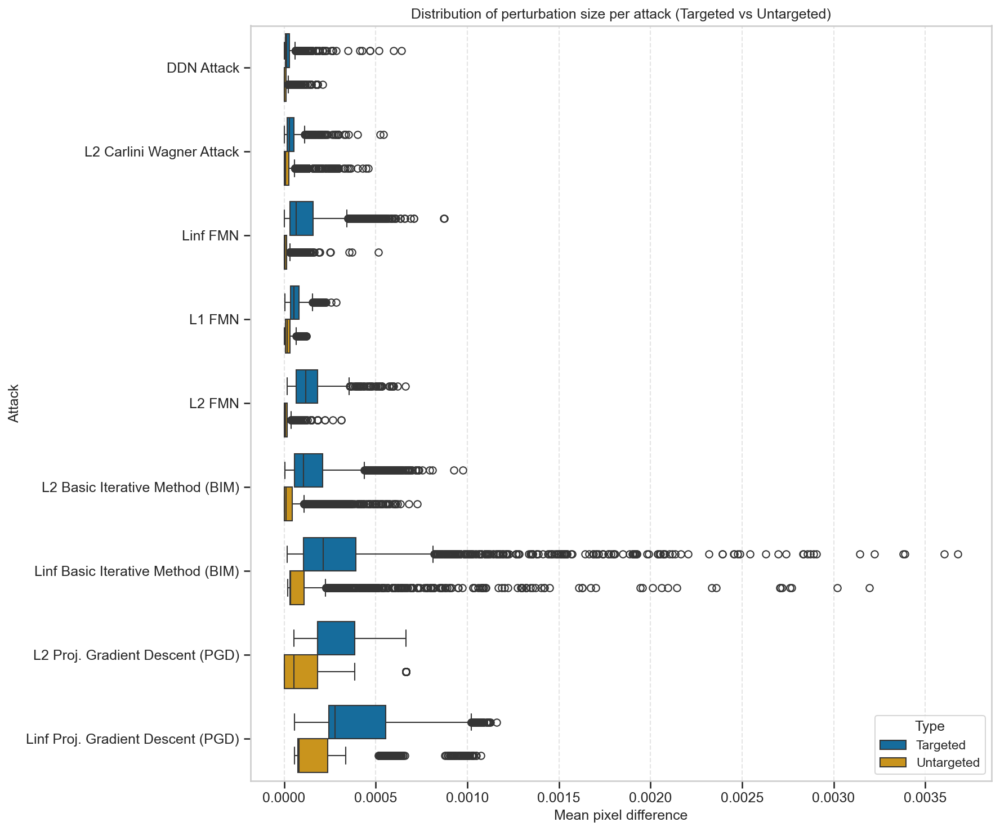

In [7]:
# Combine both datasets, add a column to indicate targeted vs. untargeted
df_targeted = filtered_df.copy()
df_targeted["type"] = "Targeted"

filtered_untargeted_df = untargeted_df[untargeted_df["method"] == "GradCAM"]
# only keep attacks that are also in targeted set
filtered_untargeted_df = filtered_untargeted_df[filtered_untargeted_df["attack"].isin(df_targeted["attack"].unique())]
filtered_untargeted_df["type"] = "Untargeted"

combined_df = pd.concat([df_targeted, filtered_untargeted_df], ignore_index=True)


# Sort attacks by median perturbation size (untargeted + targeted together)
attack_medians = (
    combined_df.groupby("attack")["images mean difference"]
    .median()
    .sort_values()
)
sorted_attacks = attack_medians.index.tolist()

# Plot horizontal boxplots
plt.figure(figsize=(12, 10))
sns.boxplot(
    data=combined_df,
    y="attack",                      # attacks on y-axis
    x="images mean difference",      # perturbation size on x-axis
    hue="type",                      # targeted vs untargeted
    order=sorted_attacks,

    orient="h"                       # <--- horizontal boxplots!
)

plt.xlabel("Mean pixel difference")
plt.ylabel("Attack")
plt.title("Distribution of perturbation size per attack (Targeted vs Untargeted)")
plt.grid(True, axis="x", linestyle="--", alpha=0.5)
plt.legend(title="Type", loc="lower right")

plt.tight_layout()
plt.savefig("results/attack_perturbations_horizontal.svg")
plt.show()

In [9]:
results_df.groupby("attack")["images mean difference"].mean().reset_index(name="mean_difference").columns

Index(['attack', 'mean_difference'], dtype='object')

In [10]:
#filtered_df.loc(filtered_df["images mean difference"].idxmax())

## get row with highest value in images mean difference
highest_diff_row = filtered_df.loc[filtered_df["images mean difference"].idxmax()]
highest_diff_row

image ID                                                       1599
method                                                      GradCAM
attack                            Linf Basic Iterative Method (BIM)
true class                                                  dishrag
predicted class                                         toy terrier
images mean difference                                     0.003678
original score                                             0.687318
adversarial score                                          0.085503
mean pixel difference                                      0.198661
percentage of different pixels                            39.032605
number of regions original                                        3
number of regions adversarial                                     1
cosine similarity                                          0.723521
activation ratio                                           0.979611
JS divergence                                   

In [11]:
filtered_df.sort_values(by="images mean difference", ascending=False)

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
114248,1599,GradCAM,Linf Basic Iterative Method (BIM),dishrag,toy terrier,3.678288e-03,0.687318,0.085503,0.198661,39.032605,3,1,0.723521,0.979611,0.098445,0.617147,0.135186,0.458492,0.506397,-2
120436,2472,GradCAM,Linf Basic Iterative Method (BIM),stole,lab coat,3.603054e-03,0.224785,0.305628,0.100055,13.422752,1,1,0.859070,1.145833,0.127327,0.610697,0.462677,0.412605,0.471370,0
104364,277,GradCAM,Linf Basic Iterative Method (BIM),bee eater,chickadee,3.388024e-03,0.482376,0.474562,0.138091,27.196269,1,1,0.492846,0.989362,0.274279,0.581699,0.219690,0.388542,0.345996,0
104623,306,GradCAM,Linf Basic Iterative Method (BIM),echidna,koala,3.380254e-03,0.701016,0.041165,0.237393,41.868622,1,1,0.127036,0.959203,0.458496,4.161198,0.046366,0.177776,-0.494472,0
110860,1096,GradCAM,Linf Basic Iterative Method (BIM),orangutan,ibex,3.223645e-03,0.433786,0.200586,0.151865,30.263473,1,1,0.841915,0.974359,0.107273,0.384211,0.601972,0.504867,0.425874,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155799,1248,GradCAM,DDN Attack,balance beam,patio,2.329816e-07,0.667796,0.377272,0.308353,59.675941,1,2,0.045414,0.727273,0.598937,0.522302,0.000000,0.104363,-0.717059,1
160344,1932,GradCAM,DDN Attack,matchstick,soap dispenser,2.113214e-07,0.240879,0.150952,0.190566,37.424267,1,1,0.017247,0.576923,0.637906,2.375783,0.000000,0.146948,-0.345012,0
158008,1590,GradCAM,DDN Attack,digital clock,hair spray,2.113212e-07,0.459376,0.364787,0.151237,27.389589,1,1,0.060538,0.551031,0.546111,2.103161,0.018678,0.339217,-0.144984,0
153295,956,GradCAM,DDN Attack,lacewing,hognose snake,2.113212e-07,0.358736,0.241121,0.201378,36.872210,1,2,0.016521,0.605405,0.639595,0.745935,0.000000,0.149683,-0.561318,1


## Metric Distributions

In [12]:
def make_scatter_plot(dataframe, col1, col2):
    title=f"Scatterplot of {col1} against {col2}"

    if col1 not in dataframe.columns or col2 not in dataframe.columns:
        raise ValueError(f"Spalten {col1} und/oder {col2} nicht im DataFrame vorhanden.")

    x = dataframe[col1]
    y = dataframe[col2]

    plt.figure(figsize=(6, 5))
    plt.scatter(x, y, alpha=0.7, edgecolors='k')
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(title if title else f"{col1} vs {col2}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

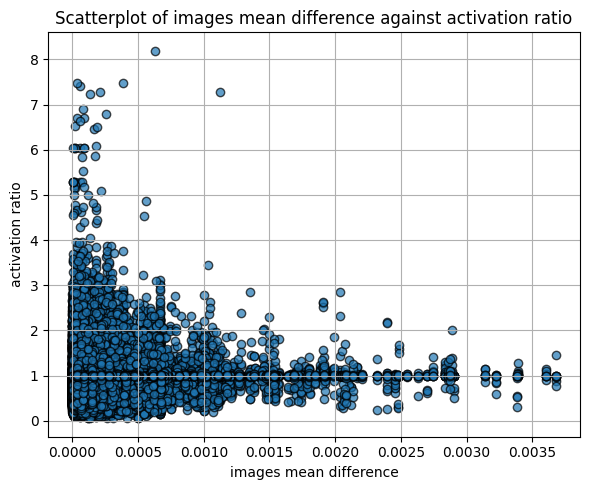

In [13]:
make_scatter_plot(results_df, "images mean difference", "activation ratio")

In [14]:
def make_scatter_plot(dataframe, col1, col2, color_by='method'):
    title = f"Scatterplot of {col1} against {col2}"

    # Check required columns
    for col in [col1, col2, color_by]:
        if col not in dataframe.columns:
            raise ValueError(f"Spalte '{col}' nicht im DataFrame vorhanden.")

    x = dataframe[col1]
    y = dataframe[col2]
    categories = dataframe[color_by]

    # Map each category to a unique colour
    unique_categories = categories.unique()
    palette = sns.color_palette('tab10', len(unique_categories))
    color_map = dict(zip(unique_categories, palette))
    colors = categories.map(color_map)

    plt.figure(figsize=(6, 5))
    scatter = plt.scatter(x, y, c=colors, alpha=0.7, edgecolors='k')

    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(title)
    plt.grid(True)
    plt.tight_layout()

    # Legend
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=cat,
                          markerfacecolor=color_map[cat], markersize=8, markeredgecolor='k')
               for cat in unique_categories]
    plt.legend(handles=handles, title=color_by, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()

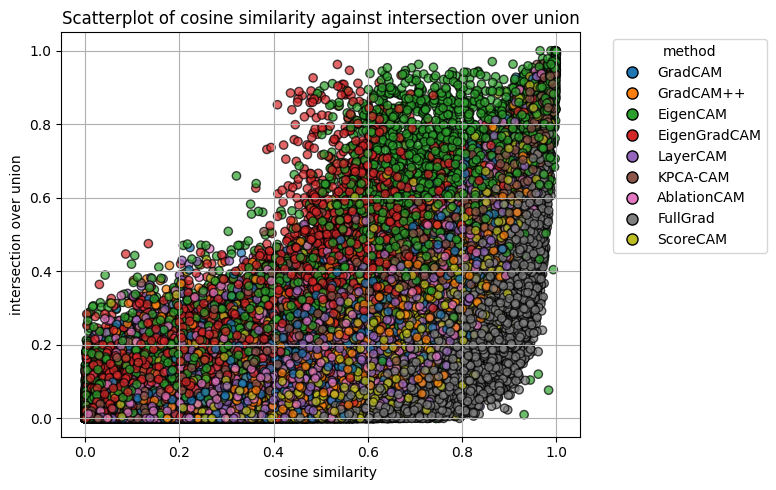

In [15]:
make_scatter_plot(results_df, "cosine similarity", "intersection over union")

In [16]:
results_df.groupby("method")["activation ratio"].mean()

method
AblationCAM     0.875034
EigenCAM        0.970003
EigenGradCAM    0.941827
FullGrad        1.000000
GradCAM         0.892039
GradCAM++       1.000820
KPCA-CAM        0.918204
LayerCAM        1.000746
ScoreCAM        1.000971
Name: activation ratio, dtype: float64

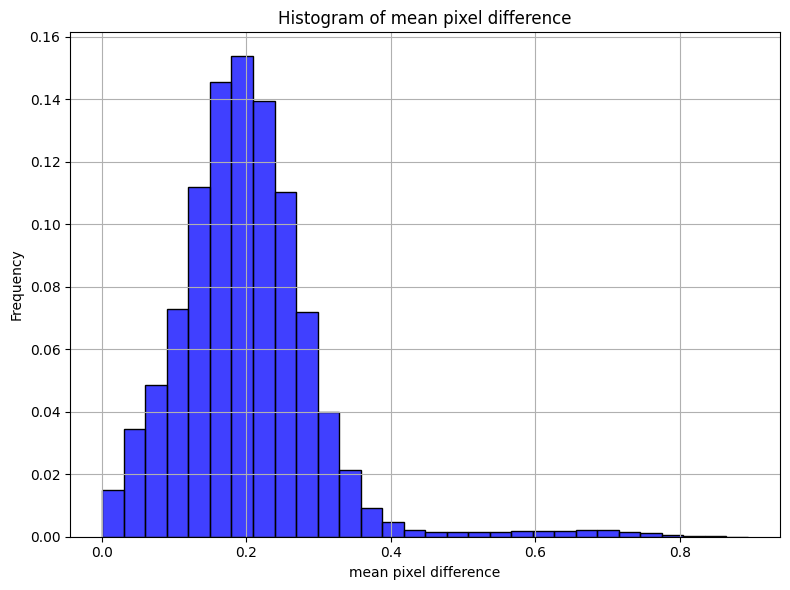

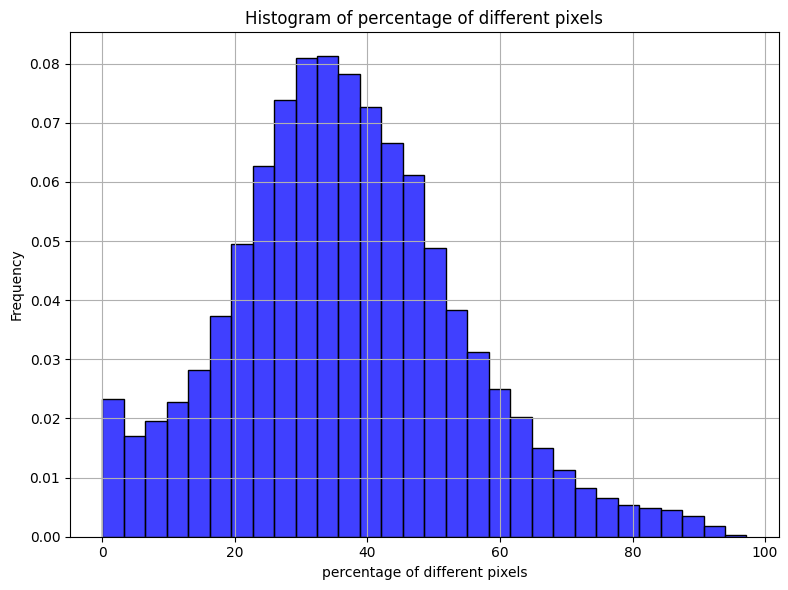

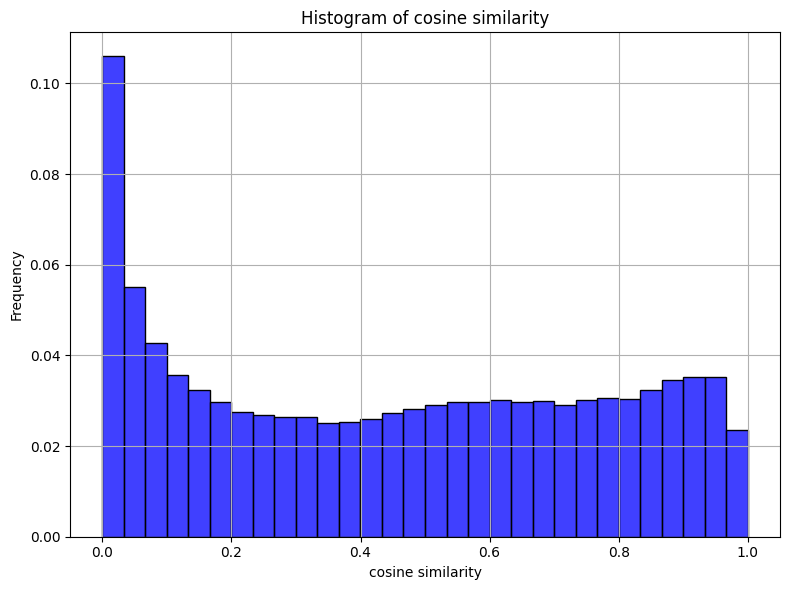

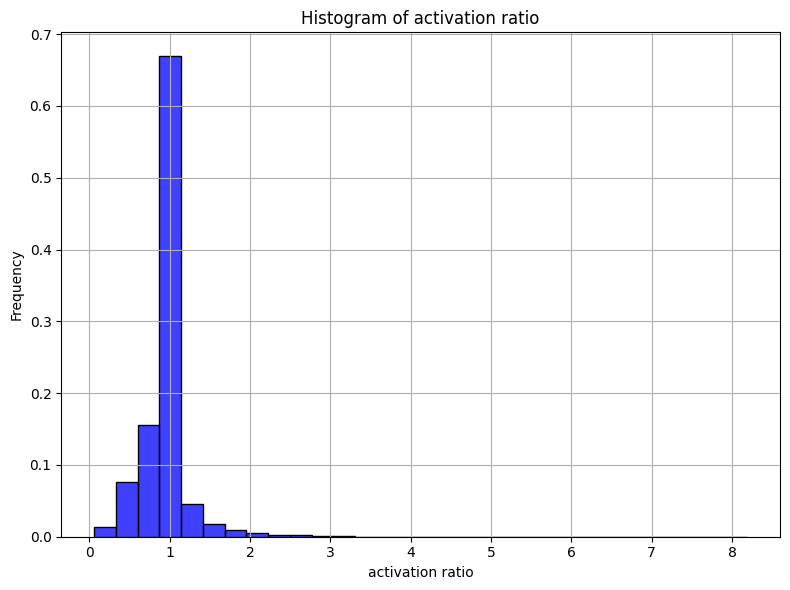

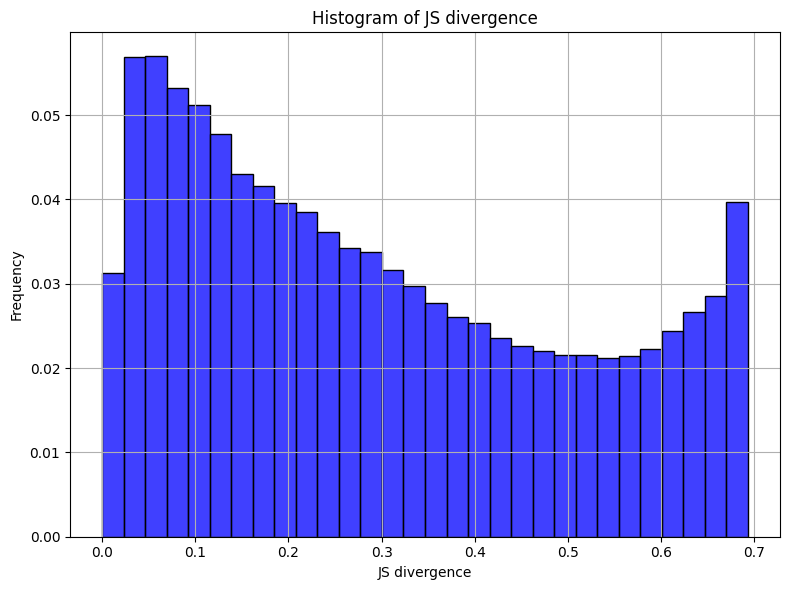

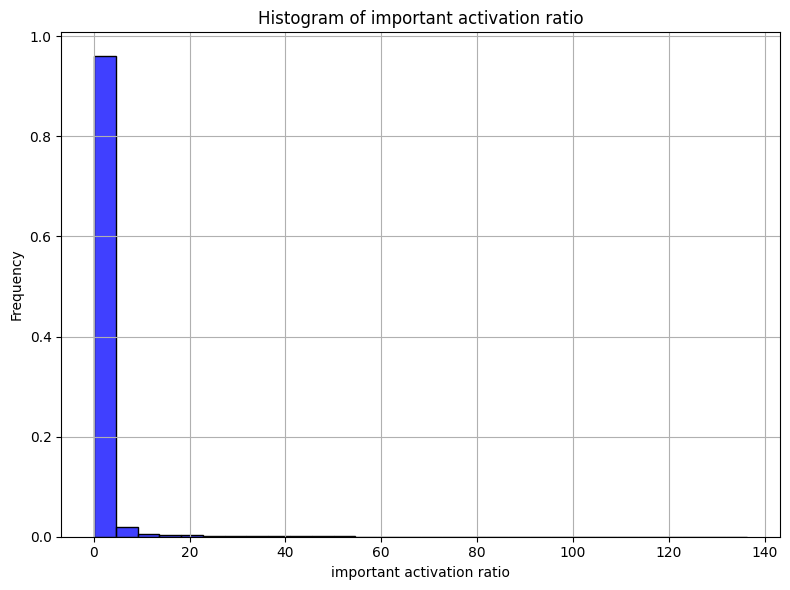

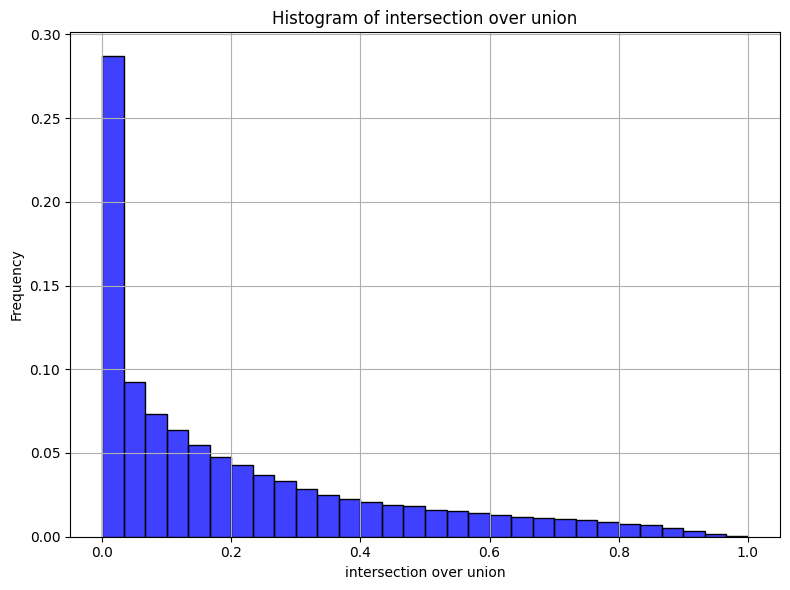

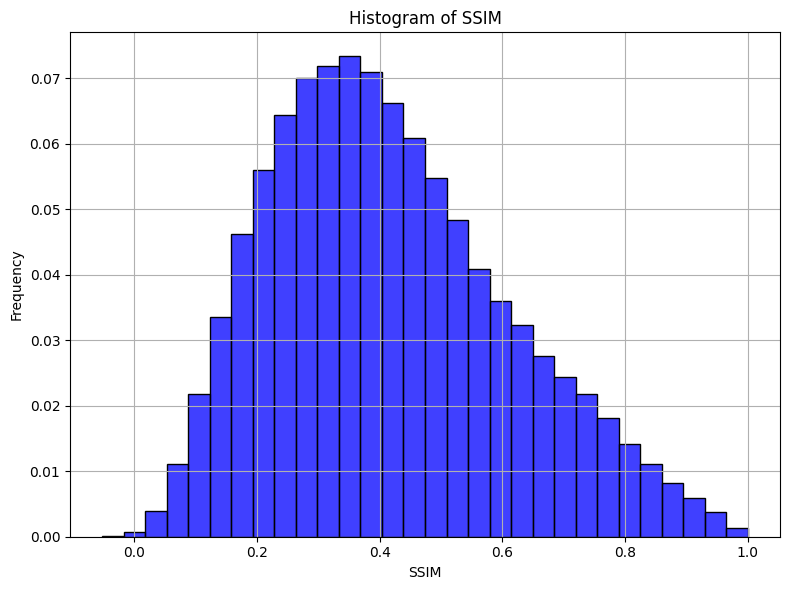

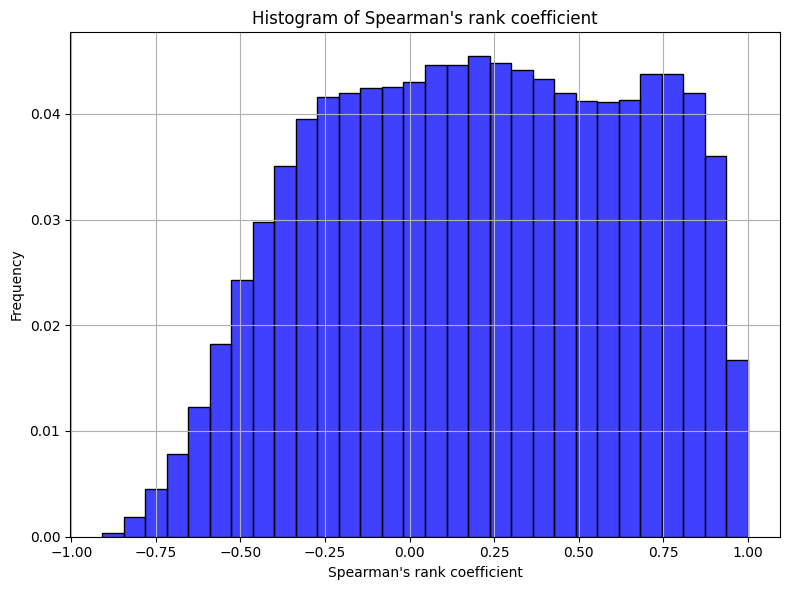

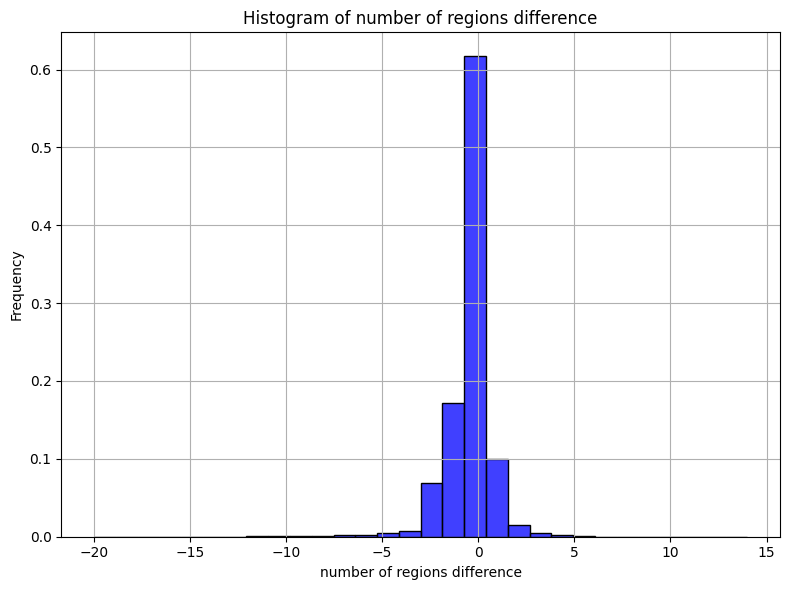

In [17]:
def make_histogram(dataframe, column, title=None, xlabel=None, ylabel=None):
    if column not in dataframe.columns:
        raise ValueError(f"Spalte '{column}' nicht im DataFrame vorhanden.")

    data = dataframe[column]

    plt.figure(figsize=(8, 6))
    sns.histplot(data, color='blue', edgecolor='black', stat="proportion", bins=30)
    plt.title(title if title else f"Histogram of {column}")
    plt.xlabel(xlabel if xlabel else column)
    plt.ylabel(ylabel if ylabel else 'Frequency')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for metric in metric_columns:
    make_histogram(results_df, metric, title=f"Histogram of {metric}", xlabel=metric, ylabel='Frequency')

In [18]:
results_df.describe()

,image ID,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
count,188388.000000,1.883880e+05,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000,188388.000000
mean,1463.455284,1.674984e-04,0.437245,0.224094,0.199799,36.733210,1.540284,1.266317,0.451694,0.955516,0.296032,1.733843,0.208297,0.416220,0.201930,-0.273966
std,869.136494,2.279953e-04,0.165746,0.260443,0.096882,17.310523,1.153451,0.690763,0.316062,0.287916,0.204715,5.383742,0.228599,0.193664,0.441132,1.201628
min,0.000000,1.907173e-07,0.028309,0.001201,0.000988,0.000000,1.000000,1.000000,0.000000,0.056250,0.000070,0.018780,0.000000,-0.051831,-0.908679,-20.000000
25%,705.000000,3.538137e-05,0.323350,0.038849,0.142262,25.414541,1.000000,1.000000,0.143442,0.876289,0.115824,0.446247,0.022624,0.270012,-0.156387,-1.000000
50%,1425.000000,8.708940e-05,0.435570,0.120571,0.193485,35.782047,1.000000,1.000000,0.450891,1.000000,0.256756,0.815473,0.124380,0.391759,0.208688,0.000000
75%,2217.250000,2.140258e-04,0.534405,0.293356,0.246206,47.201849,2.000000,1.000000,0.735511,1.004808,0.461582,1.454453,0.321281,0.540653,0.577770,0.000000
max,2999.000000,3.678288e-03,0.986934,0.999999,0.893695,97.187899,21.000000,16.000000,0.999868,8.190476,0.693147,136.410920,1.000000,0.999742,0.999994,14.000000


In [19]:
# detect outliers in activation ratio
results_df["activation ratio"].describe()

count    188388.000000
mean          0.955516
std           0.287916
min           0.056250
25%           0.876289
50%           1.000000
75%           1.004808
max           8.190476
Name: activation ratio, dtype: float64

In [20]:
threshold = results_df["activation ratio"].quantile(0.95)
print(threshold)
outliers = results_df[results_df["activation ratio"] > threshold]
outliers["method"].value_counts() 

1.3157894736842106


method
EigenGradCAM    3956
EigenCAM        3534
KPCA-CAM        1731
AblationCAM      147
GradCAM           38
Name: count, dtype: int64

In [21]:
outliers["attack"].value_counts() / results_df["attack"].value_counts()

attack
DDN Attack                           0.047019
L1 FMN                               0.049314
L2 Basic Iterative Method (BIM)      0.042034
L2 Carlini Wagner Attack             0.043770
L2 FMN                               0.047809
L2 Proj. Gradient Descent (PGD)      0.047037
Linf Basic Iterative Method (BIM)    0.053784
Linf FMN                             0.055762
Linf Proj. Gradient Descent (PGD)    0.062521
Name: count, dtype: float64

In [22]:
# check outliers in important activation ratio
threshold = results_df["important activation ratio"].quantile(0.95)
print(threshold)
outliers = results_df[results_df["important activation ratio"] > threshold]
outliers["method"].value_counts()

3.9408753066820608


method
EigenGradCAM    3272
EigenCAM        2139
FullGrad         909
AblationCAM      595
GradCAM++        560
LayerCAM         539
GradCAM          501
ScoreCAM         472
KPCA-CAM         433
Name: count, dtype: int64

In [10]:
## plot distribution as violinplot
def plot_metric_distribution_per_method(dataframe, metric, violinplot=False):
    plt.figure(figsize=(8, 6))
    # sort methods by their mean value for the metric without modifying the original dataframe

    sorted_methods = dataframe.groupby('method')[metric].median().sort_values().index.tolist()
    dataframe['method_ordered'] = pd.Categorical(dataframe['method'], categories=sorted_methods, ordered=True)
    if violinplot:
        sns.violinplot(data=dataframe, x='method_ordered', y=metric, inner="quart")
    else:
        sns.boxplot(data=dataframe, x='method_ordered', y=metric)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Method')
    plt.ylabel(metric.capitalize())
    plt.title(f'Distribution of {metric} per method')
    plt.grid(True)
    plt.tight_layout()
    if violinplot:
        plt.savefig(f'results/big_dataset/targeted/{metric.replace(" ", "_")}_distribution_violinplot_per_method_targeted.svg', format="svg", bbox_inches='tight')
    else:
        plt.savefig(f'results/big_dataset/targeted/{metric.replace(" ", "_")}_distribution_per_method_targeted.svg', format="svg", bbox_inches='tight')
    dataframe.drop(columns=['method_ordered'], inplace=True)  # Clean up the temporary column
    plt.show()

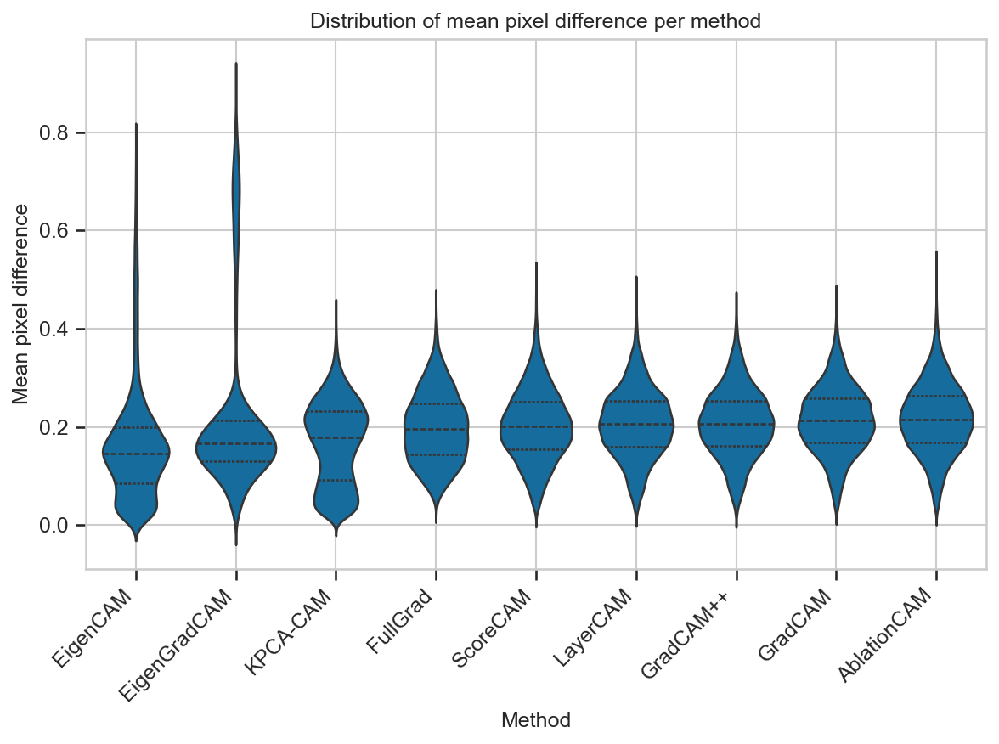

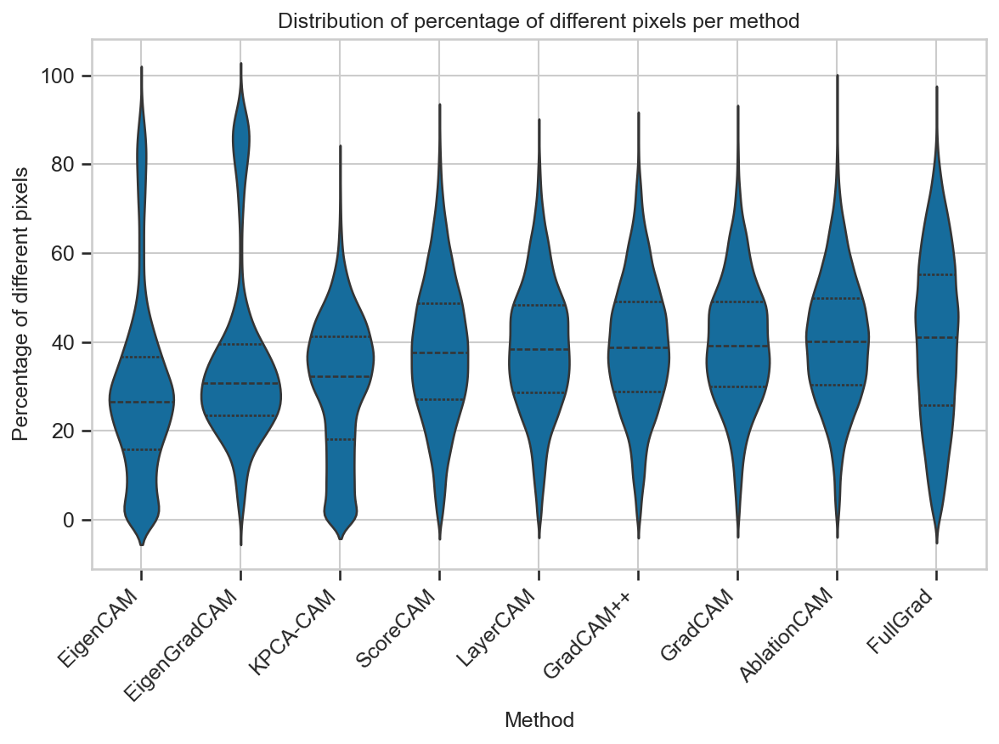

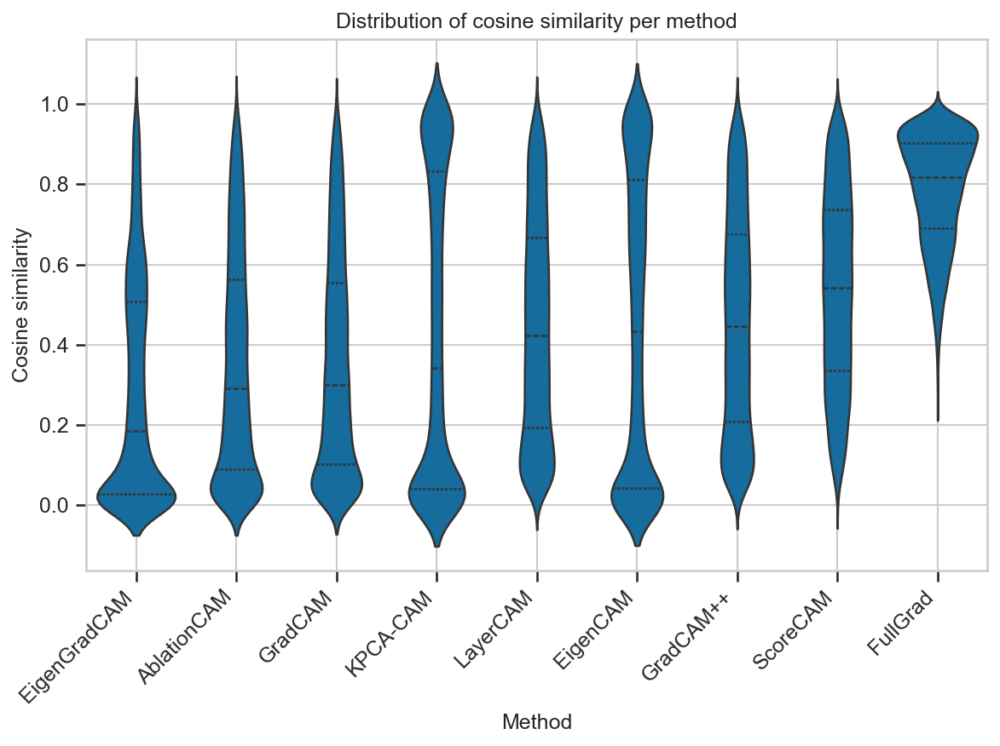

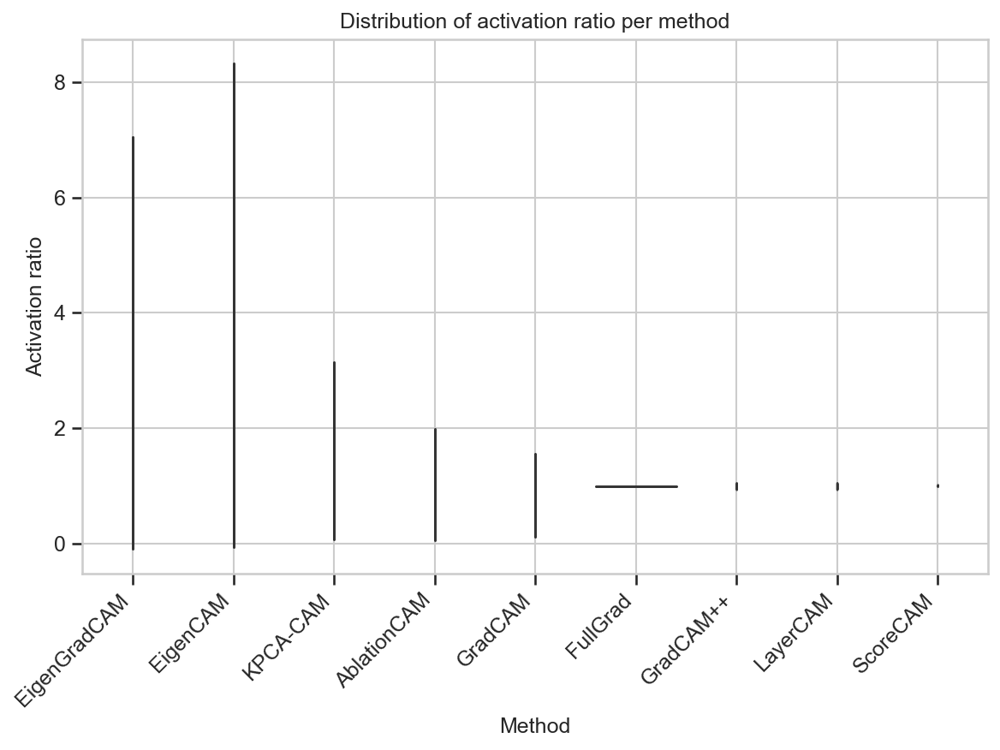

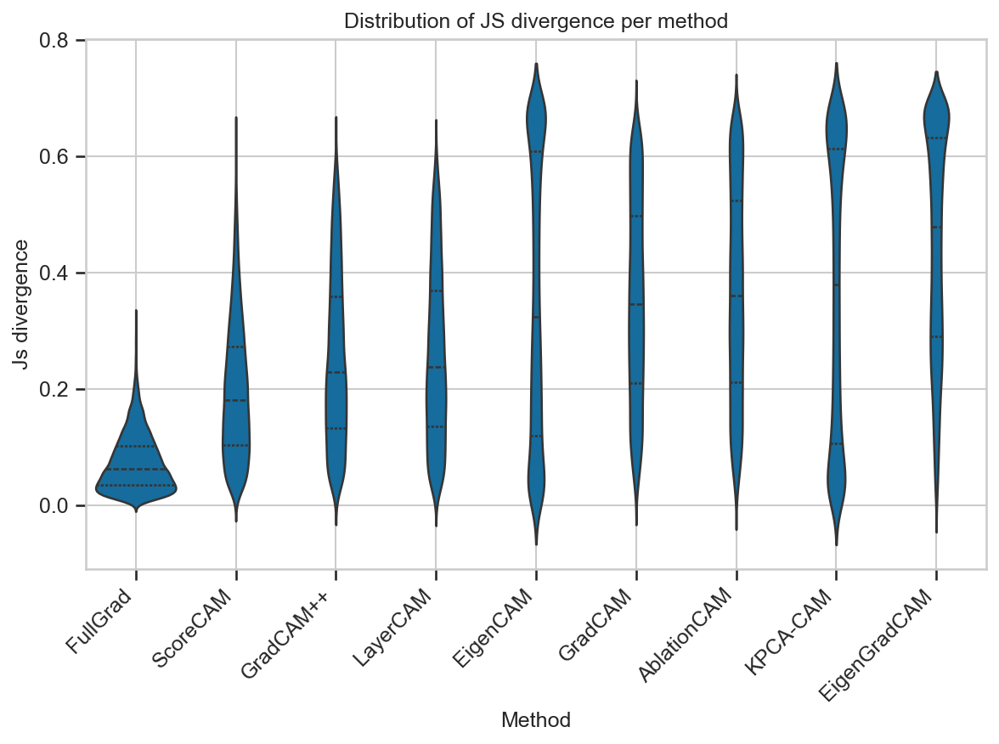

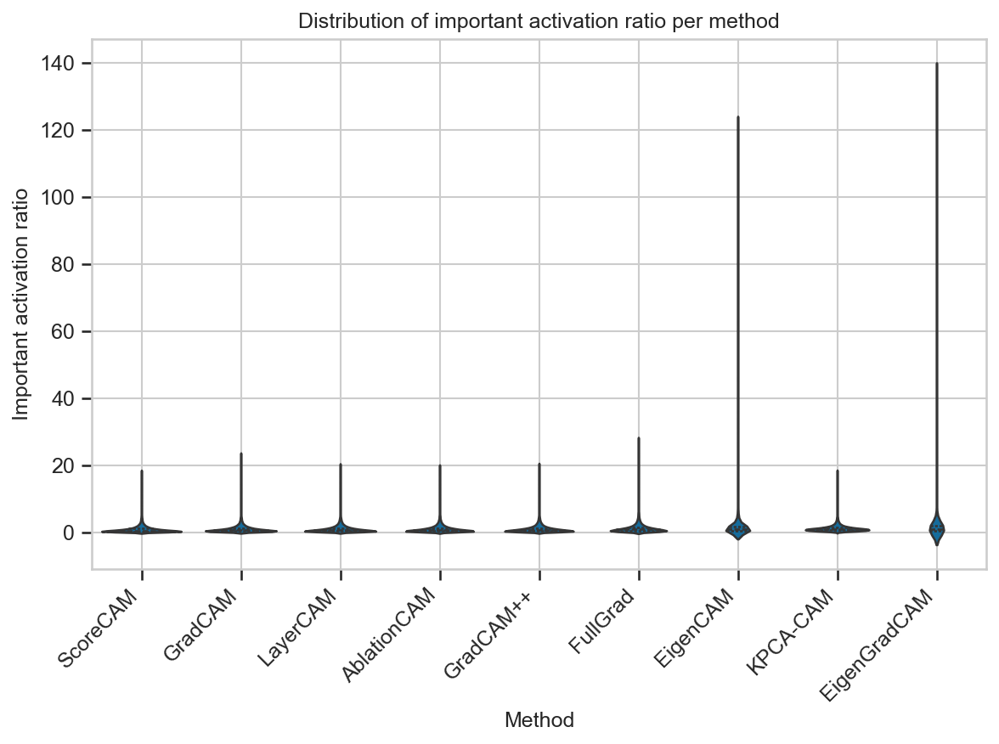

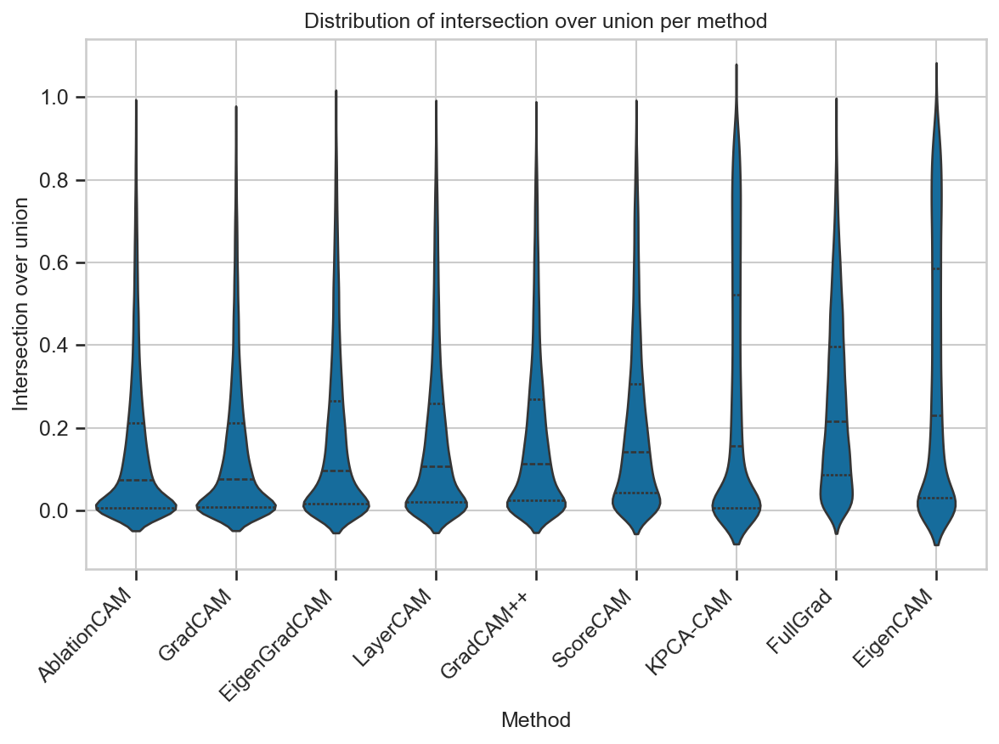

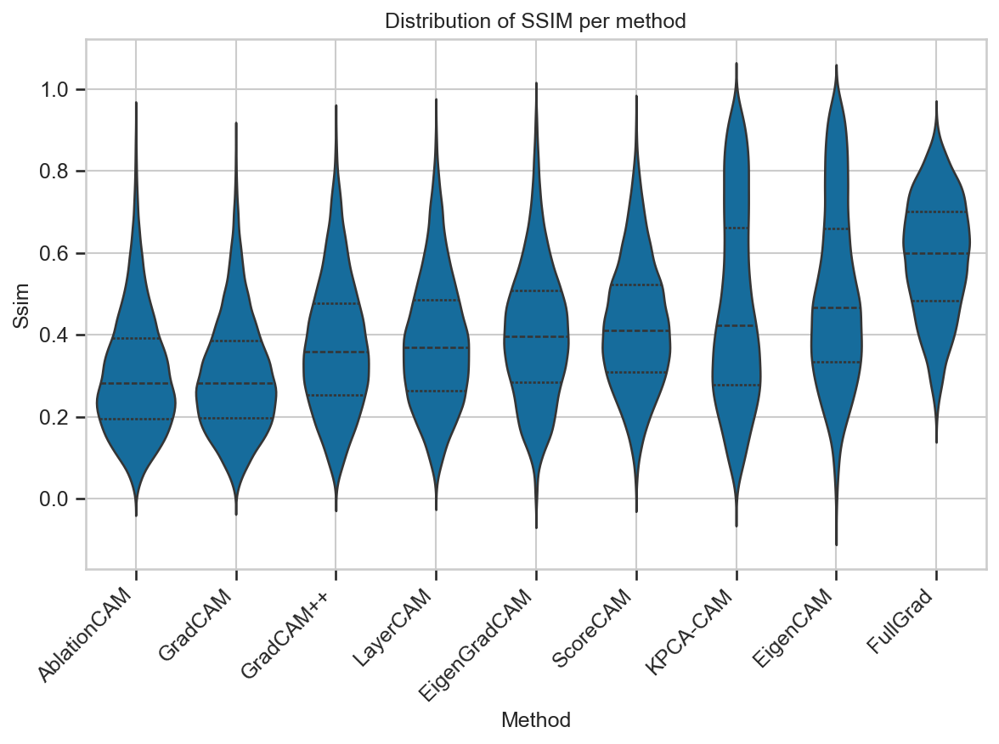

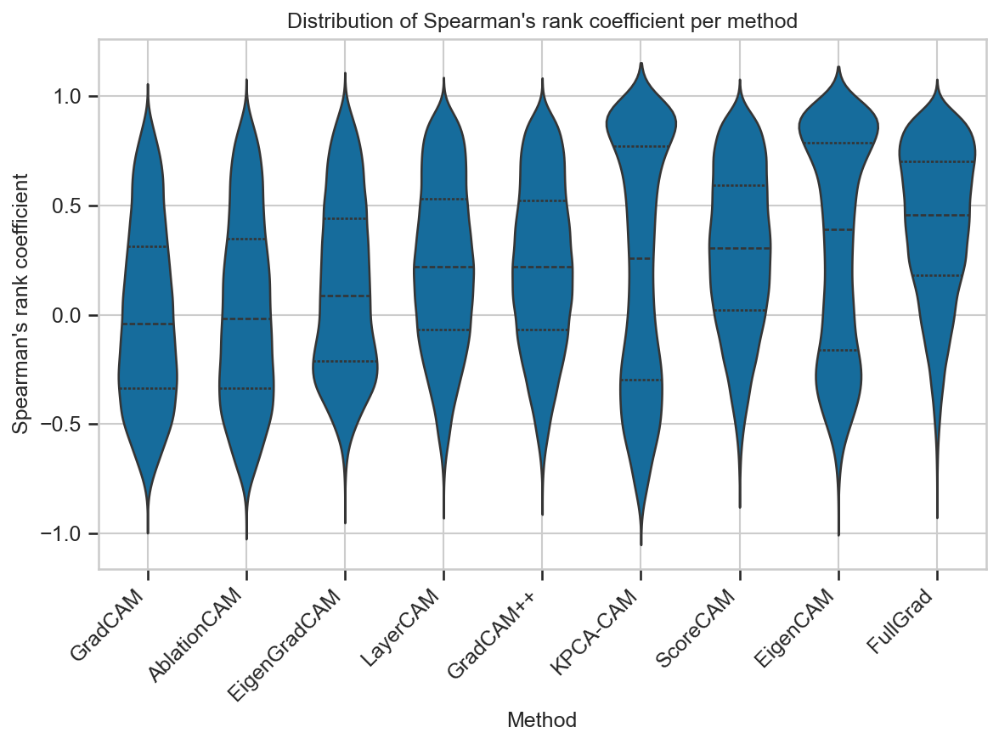

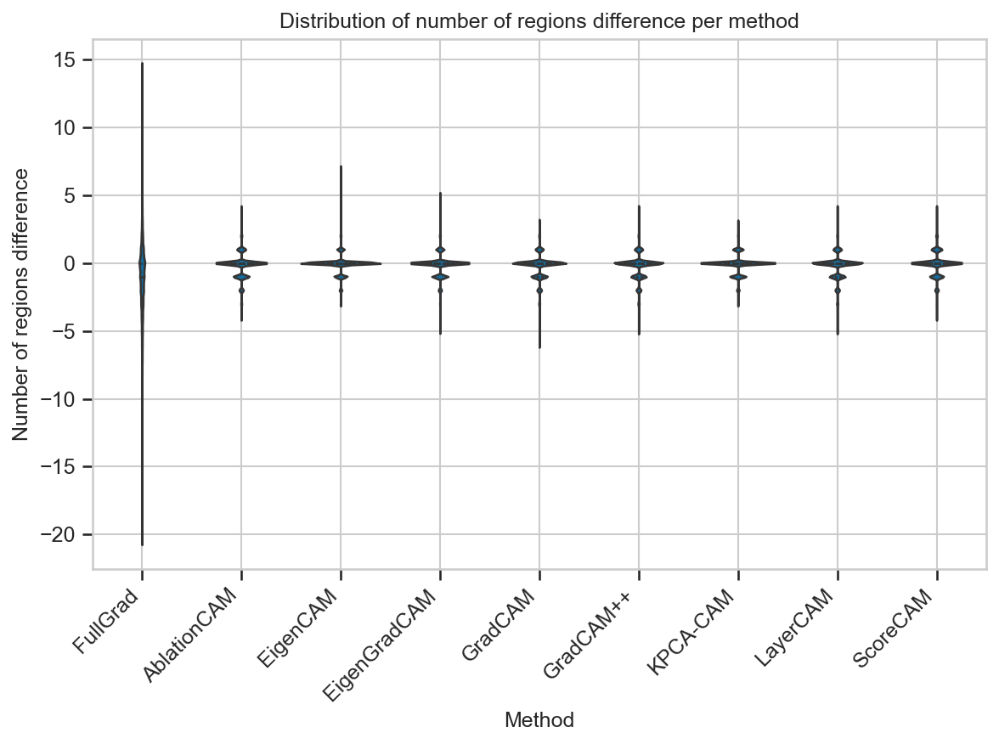

In [11]:
for col in metric_columns:
    plot_metric_distribution_per_method(results_df, col, violinplot=True)

In [25]:
results_df.groupby("method")["number of regions difference"].describe()

,count,mean,std,min,25%,50%,75%,max
method,,,,,,,,
AblationCAM,20932.0,-0.179629,0.788413,-4.0,0.0,0.0,0.0,4.0
EigenCAM,20932.0,-0.091534,0.602283,-3.0,0.0,0.0,0.0,7.0
EigenGradCAM,20932.0,-0.144898,0.699773,-5.0,0.0,0.0,0.0,5.0
FullGrad,20932.0,-1.176954,2.755154,-20.0,-3.0,-1.0,0.0,14.0
GradCAM,20932.0,-0.220333,0.784014,-6.0,-1.0,0.0,0.0,3.0
GradCAM++,20932.0,-0.235668,0.832043,-5.0,-1.0,0.0,0.0,4.0
KPCA-CAM,20932.0,-0.095882,0.617014,-3.0,0.0,0.0,0.0,3.0
LayerCAM,20932.0,-0.221813,0.815768,-5.0,-1.0,0.0,0.0,4.0
ScoreCAM,20932.0,-0.098987,0.796261,-4.0,0.0,0.0,0.0,4.0


In [26]:
results_df.groupby("attack")["number of regions difference"].describe()

,count,mean,std,min,25%,50%,75%,max
attack,,,,,,,,
DDN Attack,21906.0,-0.276682,1.178442,-20.0,-1.0,0.0,0.0,9.0
L1 FMN,19386.0,-0.345971,1.149325,-20.0,-1.0,0.0,0.0,11.0
L2 Basic Iterative Method (BIM),20412.0,-0.276308,1.181853,-15.0,-1.0,0.0,0.0,8.0
L2 Carlini Wagner Attack,21933.0,-0.394064,1.173199,-20.0,-1.0,0.0,0.0,8.0
L2 FMN,21816.0,-0.315961,1.198538,-20.0,-1.0,0.0,0.0,14.0
L2 Proj. Gradient Descent (PGD),18666.0,-0.277349,1.196189,-20.0,-1.0,0.0,0.0,10.0
Linf Basic Iterative Method (BIM),21735.0,-0.176398,1.248606,-20.0,0.0,0.0,0.0,12.0
Linf FMN,21789.0,-0.258295,1.218627,-20.0,-1.0,0.0,0.0,12.0
Linf Proj. Gradient Descent (PGD),20745.0,-0.146011,1.241996,-20.0,0.0,0.0,0.0,13.0


In [27]:
results_df.groupby("method")["important activation ratio"].describe()

,count,mean,std,min,25%,50%,75%,max
method,,,,,,,,
AblationCAM,20932.0,1.083877,1.161722,0.036990,0.400800,0.729920,1.325562,19.838384
EigenCAM,20932.0,2.630546,7.291873,0.034519,0.532658,0.968219,1.827572,122.141210
EigenGradCAM,20932.0,5.291480,13.511033,0.018780,0.534242,0.994980,2.104009,136.410920
FullGrad,20932.0,1.285910,1.410410,0.041214,0.484303,0.881019,1.553297,27.969595
GradCAM,20932.0,1.027569,1.045426,0.044061,0.394339,0.709872,1.280991,23.441011
GradCAM++,20932.0,1.069608,1.088354,0.032705,0.403262,0.738407,1.325721,20.329513
KPCA-CAM,20932.0,1.228927,0.929605,0.062073,0.666224,0.993993,1.479534,18.351351
LayerCAM,20932.0,1.056222,1.089632,0.042727,0.396057,0.721907,1.316119,20.200542
ScoreCAM,20932.0,0.930450,1.049617,0.024894,0.316607,0.602891,1.138211,18.280193


## Groups:

In [28]:
results_df.groupby("method")["cosine similarity"].describe()

,count,mean,std,min,25%,50%,75%,max
method,,,,,,,,
AblationCAM,20932.0,0.345746,0.276386,0.000123,0.089313,0.291109,0.561896,0.994259
EigenCAM,20932.0,0.443082,0.369526,0.000000,0.042901,0.434350,0.811498,0.999830
EigenGradCAM,20932.0,0.281394,0.276222,0.000000,0.027891,0.185182,0.507325,0.991933
FullGrad,20932.0,0.787085,0.139653,0.248931,0.690266,0.818002,0.903072,0.993288
GradCAM,20932.0,0.350476,0.269744,0.001015,0.102425,0.300449,0.554150,0.990254
GradCAM++,20932.0,0.454733,0.268339,0.013494,0.209003,0.445824,0.675429,0.992868
KPCA-CAM,20932.0,0.425598,0.376760,0.000000,0.040681,0.341739,0.833826,0.999868
LayerCAM,20932.0,0.441038,0.271374,0.012496,0.192747,0.421932,0.666009,0.993604
ScoreCAM,20932.0,0.536095,0.242953,0.007947,0.336054,0.542718,0.736206,0.996814


In [29]:
## describe the distribution of number of regions adversarial for each method
results_df.groupby("method")["number of regions adversarial"].describe()

,count,mean,std,min,25%,50%,75%,max
method,,,,,,,,
AblationCAM,20932.0,1.193006,0.453897,1.0,1.0,1.0,1.0,5.0
EigenCAM,20932.0,1.116329,0.376800,1.0,1.0,1.0,1.0,8.0
EigenGradCAM,20932.0,1.145328,0.409032,1.0,1.0,1.0,1.0,6.0
FullGrad,20932.0,2.033728,1.466362,1.0,1.0,2.0,3.0,16.0
GradCAM,20932.0,1.168355,0.419117,1.0,1.0,1.0,1.0,5.0
GradCAM++,20932.0,1.180824,0.436092,1.0,1.0,1.0,1.0,5.0
KPCA-CAM,20932.0,1.146665,0.379327,1.0,1.0,1.0,1.0,4.0
LayerCAM,20932.0,1.183642,0.441401,1.0,1.0,1.0,1.0,5.0
ScoreCAM,20932.0,1.228980,0.503559,1.0,1.0,1.0,1.0,5.0


In [30]:
results_df.columns

Index(['image ID', 'method', 'attack', 'true class', 'predicted class',
       'images mean difference', 'original score', 'adversarial score',
       'mean pixel difference', 'percentage of different pixels',
       'number of regions original', 'number of regions adversarial',
       'cosine similarity', 'activation ratio', 'JS divergence',
       'important activation ratio', 'intersection over union', 'SSIM',
       'Spearman's rank coefficient', 'number of regions difference'],
      dtype='object')

## find maximum disturbed image

In [31]:
# find 10 most disturbed image
max_disturbed_rows = results_df.nlargest(50, "images mean difference")
max_disturbed_rows

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
114248,1599,GradCAM,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085503,0.198661,39.032605,3,1,0.723521,0.979611,0.098445,0.617147,0.135186,0.458492,0.506397,-2
114269,1599,GradCAM++,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085503,0.209168,41.565689,1,3,0.747878,1.000000,0.087506,2.142224,0.121542,0.467843,0.542319,2
114290,1599,EigenCAM,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085503,0.476525,74.972098,1,2,0.481753,1.456140,0.326416,18.069699,0.157974,0.147151,-0.172118,1
114311,1599,EigenGradCAM,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085503,0.207451,38.867188,3,2,0.434677,0.884615,0.323122,0.949608,0.161257,0.435829,0.259079,-1
114332,1599,LayerCAM,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085503,0.210156,42.147640,3,3,0.747180,1.000000,0.088728,1.389744,0.128305,0.469543,0.552822,0
114353,1599,KPCA-CAM,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085503,0.212321,38.986767,1,1,0.345351,0.778689,0.355479,2.019596,0.098418,0.425166,0.248191,0
114374,1599,AblationCAM,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085503,0.210732,39.209981,3,1,0.702423,0.979611,0.108905,0.494030,0.148897,0.446206,0.449203,-2
114395,1599,FullGrad,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085502,0.107485,14.642459,1,1,0.864345,1.000000,0.050415,1.900990,0.255631,0.667971,0.551488,0
114416,1599,ScoreCAM,Linf Basic Iterative Method (BIM),dishrag,toy terrier,0.003678,0.687318,0.085502,0.228586,50.394611,2,2,0.710204,1.000299,0.104220,1.587330,0.177044,0.434980,0.396556,0
120436,2472,GradCAM,Linf Basic Iterative Method (BIM),stole,lab coat,0.003603,0.224785,0.305628,0.100055,13.422752,1,1,0.859070,1.145833,0.127327,0.610697,0.462677,0.412605,0.471370,0


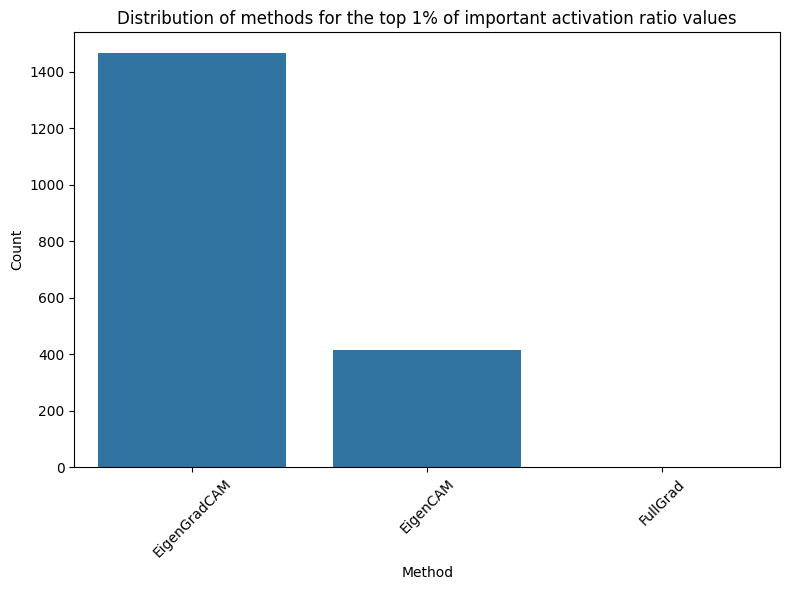

In [32]:
# check distribution of methods for the outlier percentile (5%) of important activation ratio
outlier_threshold = results_df["important activation ratio"].quantile(0.99)
outlier_data = results_df[results_df["important activation ratio"] > outlier_threshold]

plt.figure(figsize=(8, 6))
sns.countplot(data=outlier_data, x="method", order=outlier_data["method"].value_counts().index)
plt.title("Distribution of methods for the top 1% of important activation ratio values")
plt.xticks(rotation=45)
plt.xlabel("Method")
plt.ylabel("Count")
plt.tight_layout()

plt.show()

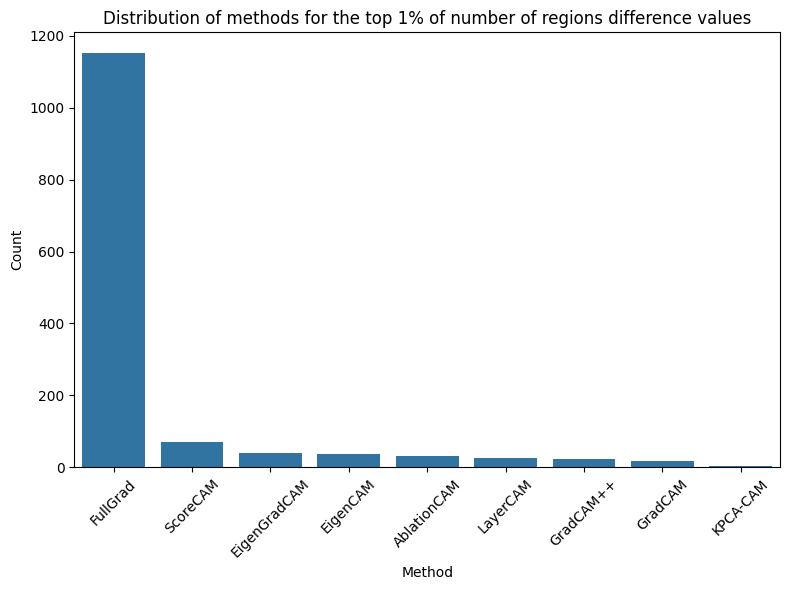

In [33]:
# check distribution of methods for the outlier percentile (1%) of number of regions difference
outlier_threshold = results_df["number of regions difference"].quantile(0.99)
outlier_data = results_df[results_df["number of regions difference"] > outlier_threshold]

plt.figure(figsize=(8, 6))
sns.countplot(data=outlier_data, x="method", order=outlier_data["method"].value_counts().index)
plt.title("Distribution of methods for the top 1% of number of regions difference values")
plt.xticks(rotation=45)
plt.xlabel("Method")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [34]:
results_df.sort_values(by="cosine similarity", ascending=False).head(20)

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
43350,429,KPCA-CAM,L1 FMN,oystercatcher,sundial,5.255346e-05,0.310503,0.115869,0.001727,0.0,1,1,0.999868,1.088889,0.000070,1.056356,0.994532,0.999742,0.968896,0
43287,429,EigenCAM,L1 FMN,oystercatcher,sundial,5.255346e-05,0.310503,0.115869,0.001007,0.0,1,1,0.999830,1.000000,0.000144,0.998480,0.989098,0.999437,0.999985,0
151401,698,EigenCAM,DDN Attack,Border collie,cocker spaniel,7.360976e-06,0.344957,0.124889,0.000988,0.0,1,1,0.999825,1.000000,0.000102,0.951220,0.998805,0.999679,0.999994,0
115625,1780,EigenCAM,Linf Basic Iterative Method (BIM),harmonica,groom,9.967206e-05,0.510423,0.379939,0.001305,0.0,1,1,0.999667,0.857143,0.001160,0.990596,0.947501,0.995200,0.942901,0
159392,1780,EigenCAM,DDN Attack,harmonica,groom,8.552358e-06,0.510423,0.205761,0.001538,0.0,1,1,0.999565,0.857143,0.001284,0.971787,0.934921,0.994009,0.942934,0
163825,2413,EigenCAM,DDN Attack,soap dispenser,oil filter,4.691290e-06,0.367063,0.234163,0.001930,0.0,1,1,0.999541,0.875000,0.002483,1.011325,0.966298,0.984897,0.938708,0
129477,698,EigenCAM,L2 Carlini Wagner Attack,Border collie,cocker spaniel,9.323682e-06,0.344957,0.110271,0.001262,0.0,1,1,0.999510,1.000000,0.000452,0.985095,0.998407,0.998754,0.999970,0
45102,698,EigenCAM,L1 FMN,Border collie,cocker spaniel,4.056251e-05,0.344957,0.094935,0.001815,0.0,1,1,0.999468,1.075000,0.000510,0.960705,0.977180,0.998608,0.971544,0
85881,698,EigenCAM,Linf FMN,Border collie,cocker spaniel,3.041528e-05,0.344957,0.090585,0.001508,0.0,1,1,0.999443,1.075000,0.000558,0.974255,0.999303,0.998575,0.972145,0
141253,2307,EigenCAM,L2 Carlini Wagner Attack,rule,microwave,1.352021e-06,0.389009,0.130722,0.002525,0.0,1,1,0.999382,1.080000,0.001127,0.875949,0.966582,0.991867,0.969625,0


# metric distributions per attack

In [18]:
import textwrap

def plot_metric_distribution_per_attack(dataframe, metric, violinplot=False, wrap_width=40):
    # Sort attacks by their median value for the metric
    sorted_attacks = dataframe.groupby('attack')[metric].median().sort_values().index.tolist()
    dataframe['attack_ordered'] = pd.Categorical(dataframe['attack'], categories=sorted_attacks, ordered=True)

    plt.figure(figsize=(8, max(6, 0.3 * len(sorted_attacks))))  # auto height scaling
    if violinplot:
        sns.violinplot(
            data=dataframe, 
            y='attack_ordered', x=metric, inner="quart"
        )
    else:
        sns.boxplot(
            data=dataframe, 
            y='attack_ordered', x=metric
        )

    # Wrap long y-tick labels
    labels = [textwrap.fill(label, wrap_width) for label in sorted_attacks]
    plt.yticks(ticks=range(len(sorted_attacks)), labels=labels)

    plt.xlabel(metric.capitalize())
    plt.ylabel("Attack")
    plt.title(f'Distribution of {metric} per attack')
    plt.grid(True, axis="x")
    plt.tight_layout()

    # Save
    suffix = "violinplot" if violinplot else "boxplot"
    plt.savefig(
        f'results/big_dataset/targeted/{metric.replace(" ", "_")}_distribution_{suffix}_per_targeted_attack.svg',
        format="svg", bbox_inches='tight'
    )

    dataframe.drop(columns=['attack_ordered'], inplace=True)
    plt.show()

In [13]:
# filter dataframe such that every attack has the same number of samples (common image IDs)
# Get all unique attacks
all_attacks = results_df['attack'].unique()

# For each attack, find the set of image IDs that have results
image_sets_per_attack = [
    set(results_df[results_df['attack'] == attack]['image ID'].unique())
    for attack in all_attacks
]

# Intersection: images common to all attacks
common_image_ids = set.intersection(*image_sets_per_attack)
print(f"Number of images with successful adversarial examples for all attacks: {len(common_image_ids)}")

Number of images with successful adversarial examples for all attacks: 1904


In [14]:
attack_df = results_df[results_df['image ID'].isin(common_image_ids)].copy()

In [15]:
attack_df["image ID"].unique().size

1904

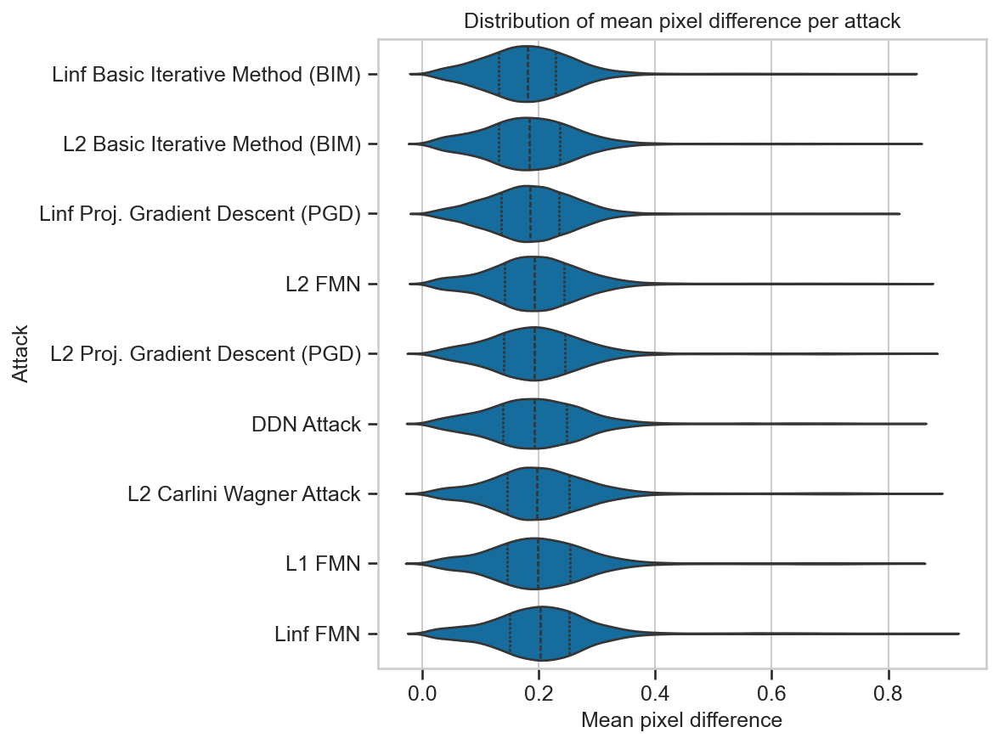

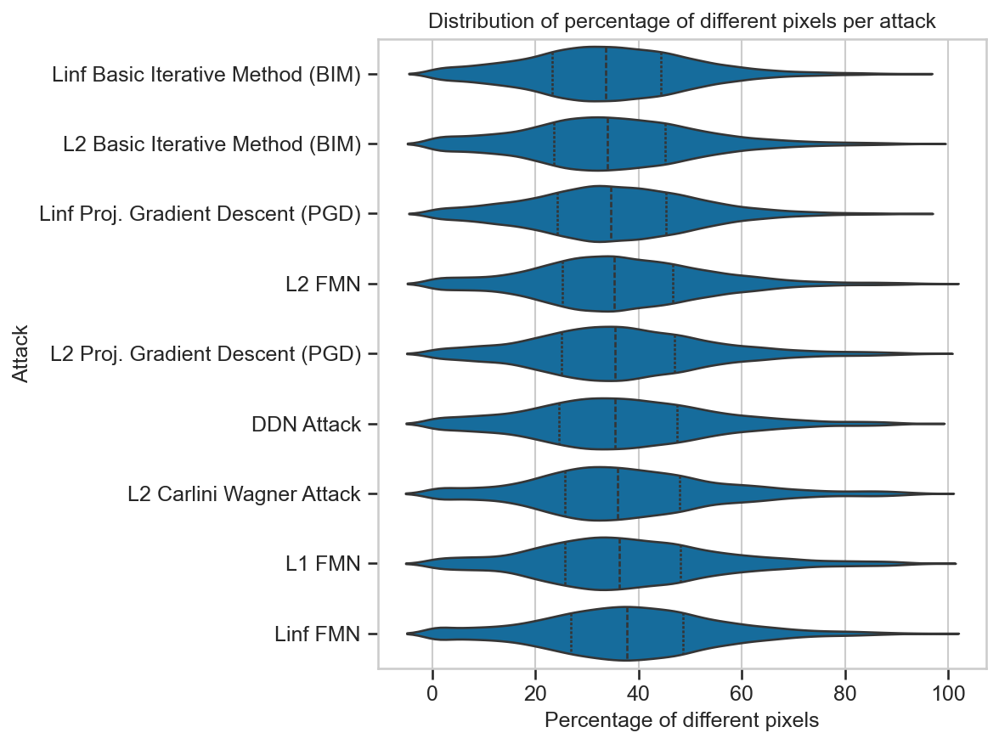

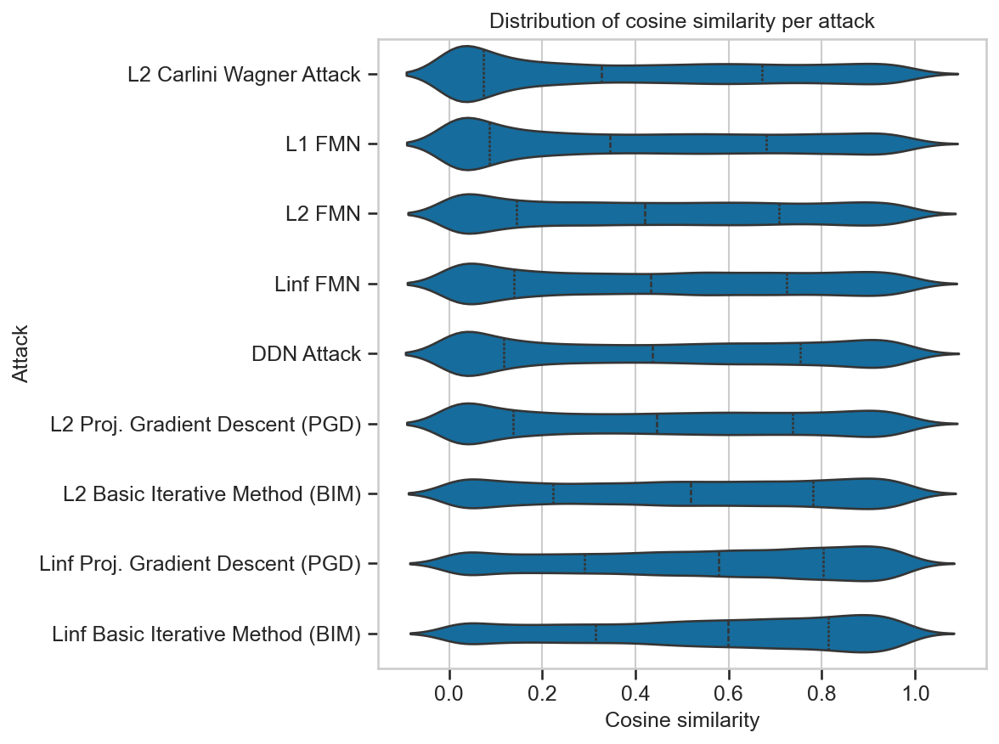

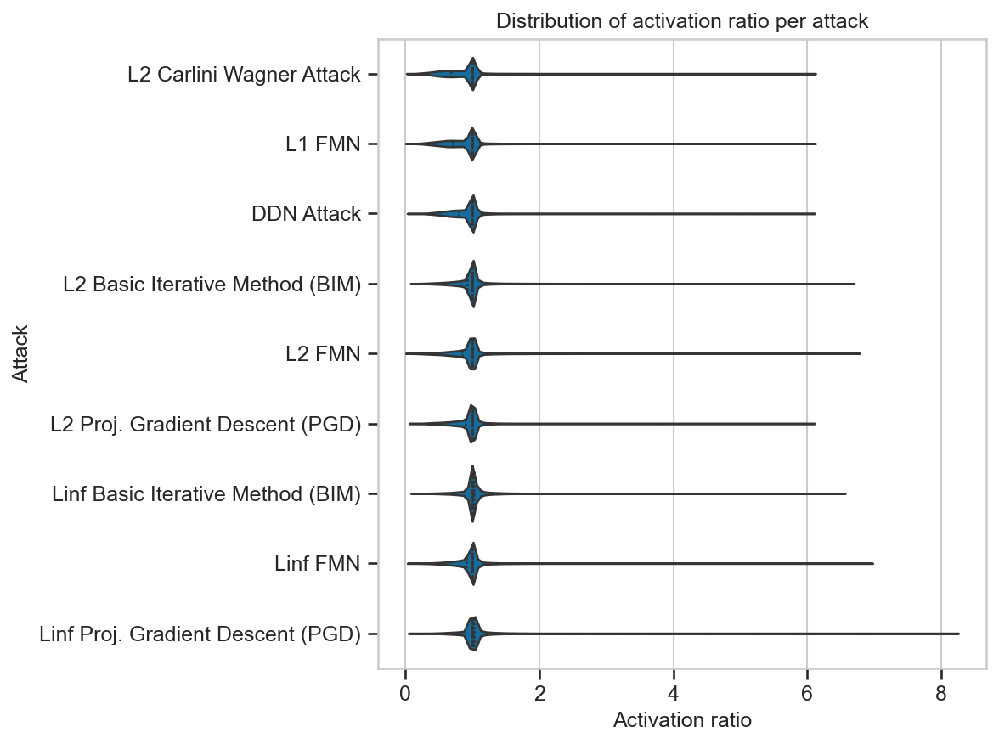

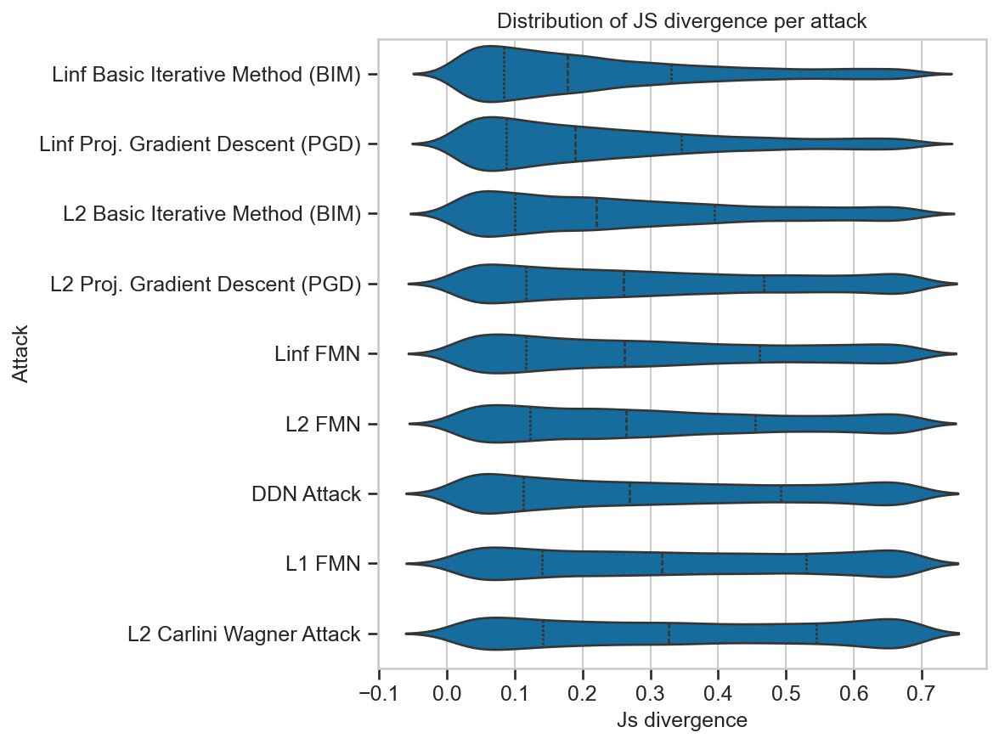

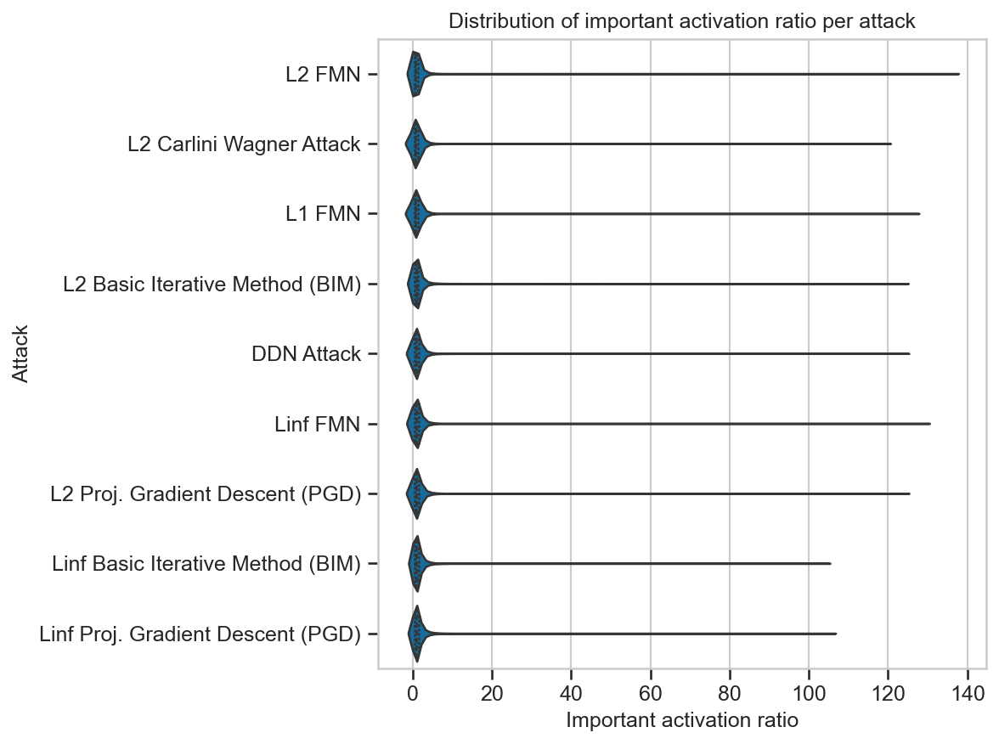

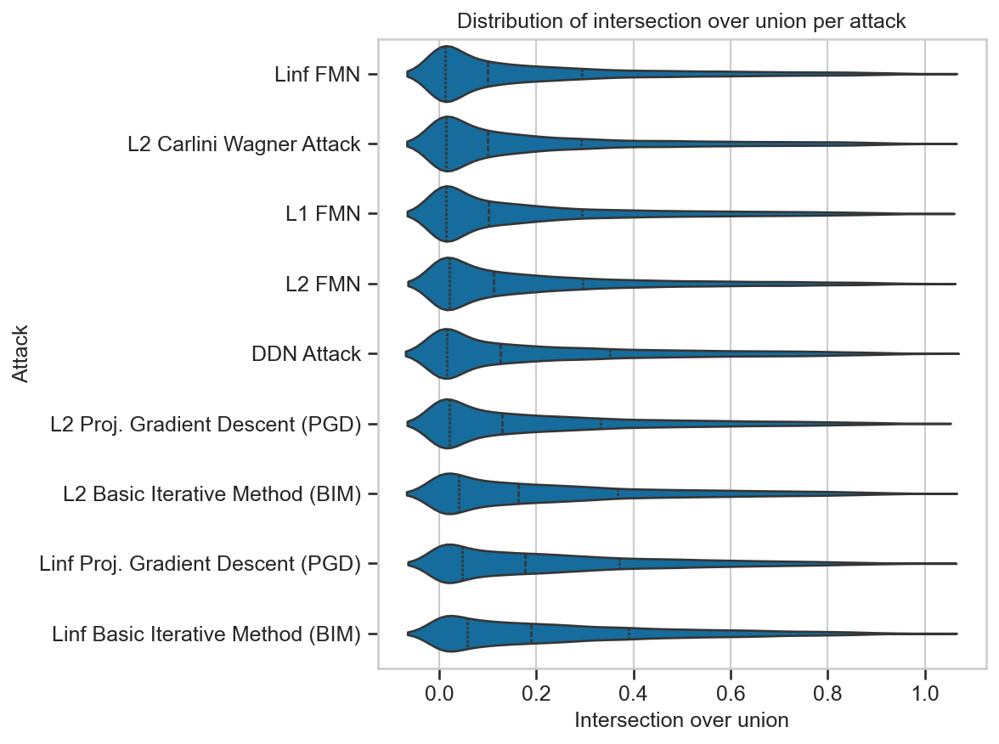

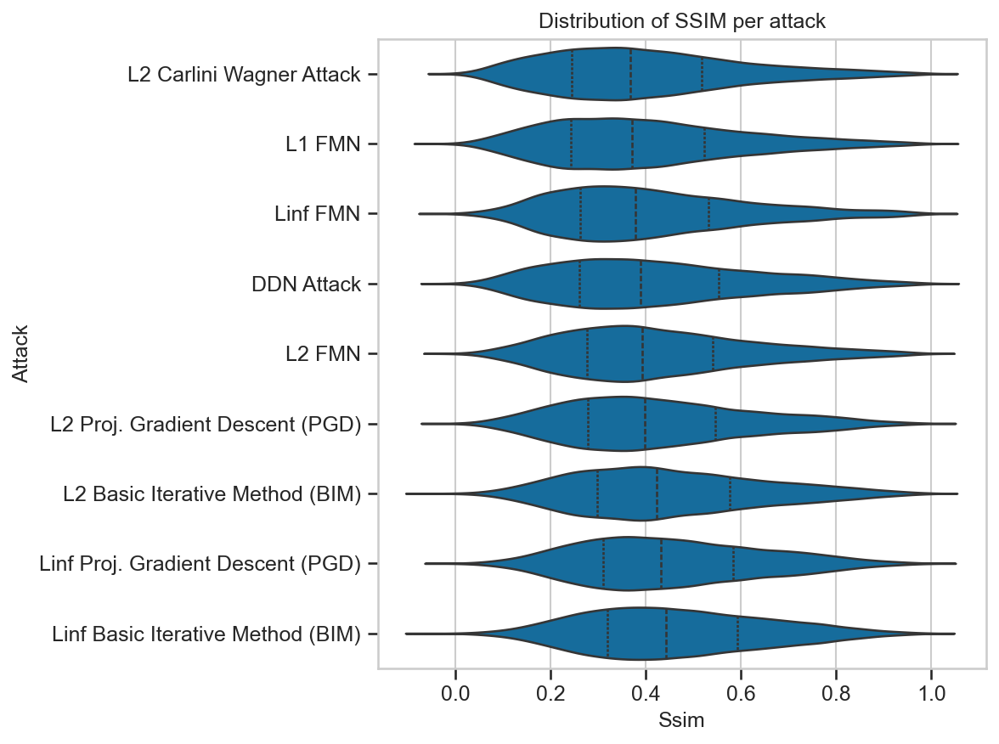

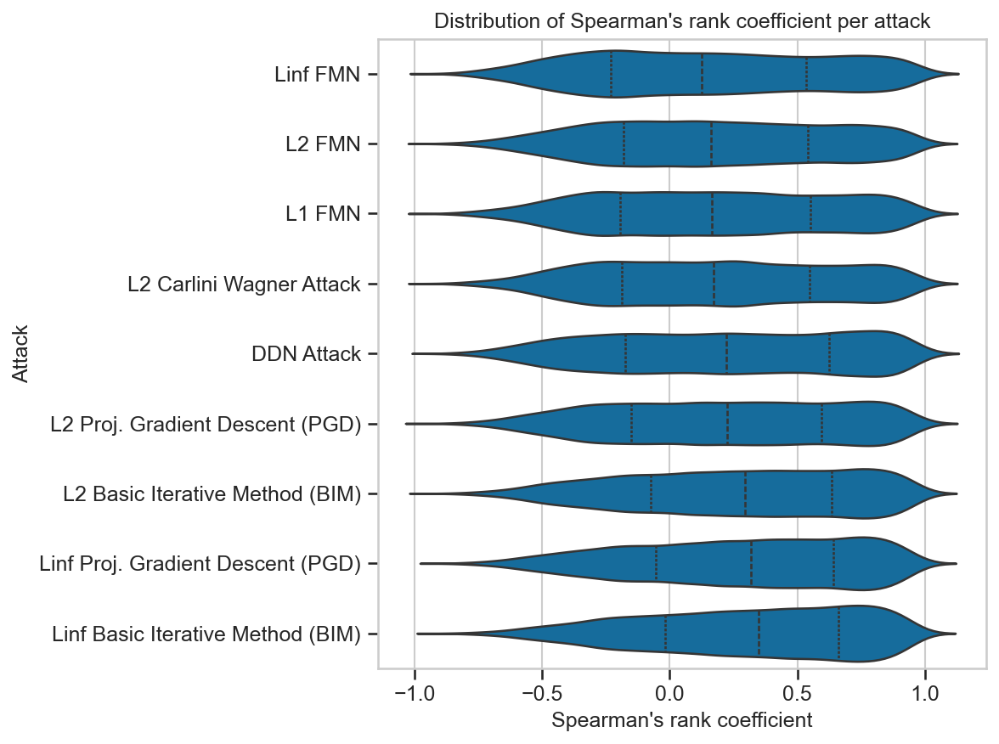

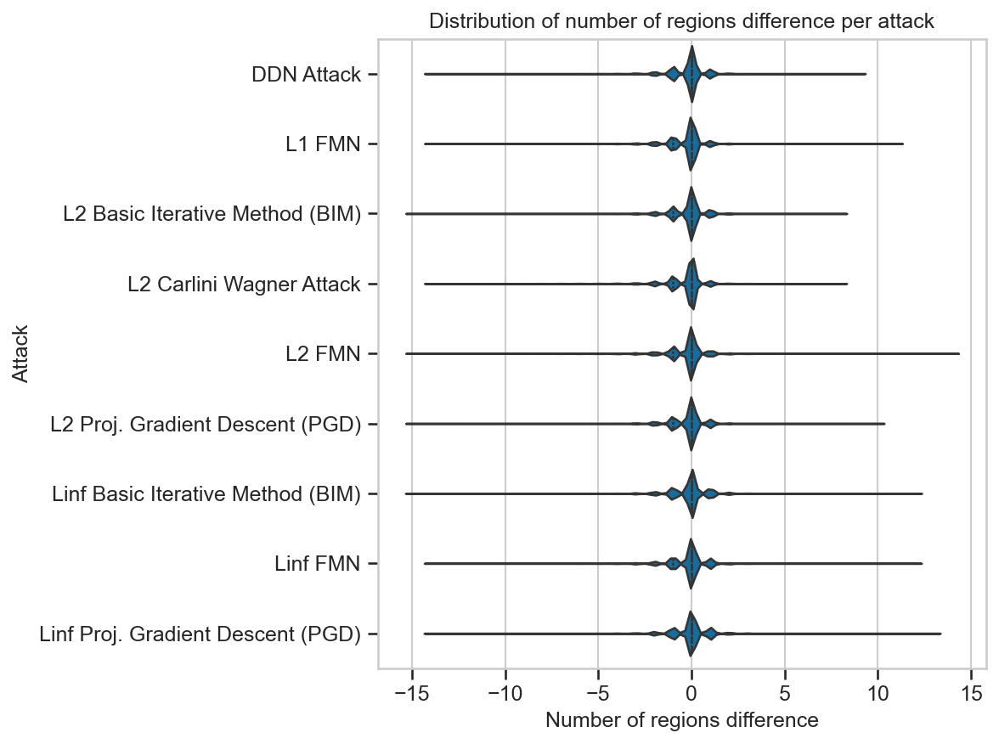

In [19]:
for metric in metric_columns:
    plot_metric_distribution_per_attack(attack_df, metric, violinplot=True)

In [40]:
results_df.groupby("attack")["SSIM"].describe().sort_values(by="attack")

,count,mean,std,min,25%,50%,75%,max
attack,,,,,,,,
DDN Attack,21906.0,0.405881,0.201377,-0.014837,0.251865,0.377865,0.536272,0.999679
L1 FMN,19386.0,0.387960,0.196033,-0.030493,0.237468,0.361220,0.508944,0.999742
L2 Basic Iterative Method (BIM),20412.0,0.442958,0.191635,-0.049406,0.297824,0.419292,0.569956,0.999143
L2 Carlini Wagner Attack,21933.0,0.383099,0.195304,-0.001248,0.235061,0.358225,0.502872,0.998754
L2 FMN,21816.0,0.411357,0.190118,-0.012105,0.268563,0.385851,0.528766,0.993594
L2 Proj. Gradient Descent (PGD),18666.0,0.421795,0.192525,-0.017438,0.276002,0.396059,0.545398,0.996226
Linf Basic Iterative Method (BIM),21735.0,0.452866,0.184825,-0.051831,0.313181,0.434081,0.581221,0.995200
Linf FMN,21789.0,0.396662,0.191070,-0.021344,0.253355,0.365159,0.512695,0.998575
Linf Proj. Gradient Descent (PGD),20745.0,0.444498,0.185821,-0.011749,0.303661,0.423878,0.572254,0.997795


In [41]:
results_df.groupby("attack")["important activation ratio"].describe().sort_values(by="attack")

,count,mean,std,min,25%,50%,75%,max
attack,,,,,,,,
DDN Attack,21906.0,1.867412,5.767466,0.026567,0.458265,0.832500,1.472277,123.663793
L1 FMN,19386.0,1.970181,6.760165,0.034685,0.424229,0.761048,1.366540,125.974138
L2 Basic Iterative Method (BIM),20412.0,1.568371,4.438553,0.025673,0.463081,0.827347,1.452924,123.824713
L2 Carlini Wagner Attack,21933.0,1.894065,6.686232,0.020982,0.400354,0.726225,1.311258,125.924791
L2 FMN,21816.0,1.513939,5.090410,0.018780,0.380197,0.710285,1.255791,136.410920
L2 Proj. Gradient Descent (PGD),18666.0,1.802055,5.580855,0.041218,0.466708,0.849604,1.521128,123.695402
Linf Basic Iterative Method (BIM),21735.0,1.542610,3.582520,0.038133,0.493875,0.901439,1.594512,104.304598
Linf FMN,21789.0,1.810063,5.595726,0.020126,0.449384,0.825117,1.463390,128.974138
Linf Proj. Gradient Descent (PGD),20745.0,1.655550,4.111311,0.035684,0.512915,0.939637,1.656006,105.977273


In [42]:
results_df.sort_values(by="important activation ratio", ascending=False).head(20)

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
39058,2794,EigenGradCAM,L2 FMN,bagel,ice cream,0.000133,0.732429,0.003251,0.815256,97.100207,1,1,0.619715,1.304054,0.192533,136.410920,0.117299,0.122112,0.032121,0
100969,2794,EigenGradCAM,Linf FMN,bagel,ice cream,0.000091,0.732429,0.003012,0.749473,93.225845,1,1,0.628862,1.304054,0.185208,128.974138,0.142873,0.157212,0.298118,0
58683,2794,EigenGradCAM,L1 FMN,bagel,ice cream,0.000121,0.732429,0.026845,0.772006,91.583626,1,1,0.633555,1.250000,0.180095,125.974138,0.510770,0.172432,0.605731,0
143737,2672,EigenGradCAM,L2 Carlini Wagner Attack,volleyball,barrow,0.000027,0.311523,0.083810,0.858018,94.463489,1,1,0.461244,1.752294,0.291605,125.924791,0.241170,0.082232,0.369472,0
36847,2494,EigenGradCAM,L2 FMN,studio couch,lumbermill,0.000149,0.210631,0.007568,0.796015,90.722656,1,1,0.377928,2.597222,0.400968,124.111765,0.266646,0.081565,0.555010,0
187063,2794,EigenGradCAM,L2 Basic Iterative Method (BIM),bagel,ice cream,0.000162,0.732429,0.070457,0.736919,89.865673,1,1,0.630519,1.263514,0.181543,123.824713,0.249393,0.174350,0.483282,0
17502,2794,EigenGradCAM,L2 Proj. Gradient Descent (PGD),bagel,ice cream,0.000386,0.732429,0.184845,0.756306,89.508929,1,1,0.630668,1.222973,0.180345,123.695402,0.331697,0.195981,0.464829,0
166534,2794,EigenGradCAM,DDN Attack,bagel,ice cream,0.000043,0.732429,0.181072,0.755014,89.546795,1,1,0.631438,1.222973,0.180071,123.663793,0.414775,0.196729,0.555308,0
148665,336,EigenGradCAM,DDN Attack,conch,bagel,0.000002,0.114855,0.145728,0.681940,87.254863,1,1,0.650549,1.393939,0.192422,123.638710,0.508229,0.186255,0.714705,0
141957,2431,EigenGradCAM,L2 Carlini Wagner Attack,space bar,loudspeaker,0.000051,0.418183,0.014814,0.849478,97.187899,1,1,0.578877,1.484615,0.223143,123.261658,0.504612,0.132343,0.695398,0


## Method-Attack Metric "distribution"

In [36]:
def plot_metric_heatmap_with_std_dots_fixed(df, metric, untargeted_df, cmap="coolwarm"):

    method_order = [
        "GradCAM", "AblationCAM", "ScoreCAM", "GradCAM++", "LayerCAM", 
        "EigenGradCAM", "FullGrad", "EigenCAM", "KPCA-CAM"]
    
    # Convert columns to ordered categoricals
    df["method"] = pd.Categorical(df["method"], categories=method_order, ordered=True)

    # Pivot mean and std
    pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
    pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")

    # Sort pivot_mean and get the sorted index
    pivot_mean = pivot_mean.loc[pivot_mean.mean(axis=1).sort_values(ascending=False).index]

    # Apply same sorting to pivot_std
    pivot_std = pivot_std.loc[pivot_mean.index]
    vmin = untargeted_df[metric].min().min()
    vmax = untargeted_df[metric].max().max()

    fig, ax = plt.subplots(figsize=(9, 10))

    # Heatmap of means with annotations
    hm = sns.heatmap(
        pivot_mean,
        cmap=cmap,
        annot=pivot_mean.round(2),  # show mean values
        fmt="",
        cbar_kws={'label': f'{metric} (mean)'},
        ax=ax, vmin=vmin, vmax=vmax
    )

    # Normalize std for dot size (font size)
    max_std = pivot_std.max().max()
    min_std = pivot_std.min().min()
    min_font, max_font = 8, 20  # Reduced range to prevent overlap

    for i, attack in enumerate(pivot_mean.index):
        for j, method in enumerate(pivot_mean.columns):
            std_val = pivot_std.loc[attack, method]
            if pd.notnull(std_val) and std_val > 0:
                # Normalize std_val between 0 and 1
                if max_std > min_std:
                    normalized_std = (std_val - min_std) / (max_std - min_std)
                else:
                    normalized_std = 0.5
                
                fontsize = min_font + normalized_std * (max_font - min_font)
                
                # Position dot 
                ax.text(
                    j + 0.09, i + 0.52, "•", 
                    ha="center", va="center",
                    fontsize=fontsize, color="black", alpha=0.8,
                    weight='bold'
                )

    # Build legend handles (example std values)
    if max_std > 0:
        example_stds = np.linspace(min_std, max_std, 3)
        legend_dots = []
        legend_labels = []
        for val in example_stds:
            if max_std > min_std:
                normalized_std = (val - min_std) / (max_std - min_std)
            else:
                normalized_std = 0.5
            fontsize = min_font + normalized_std * (max_font - min_font)
            legend_dots.append(plt.Line2D([0], [0], marker="o", color="black", 
                                        markersize=fontsize/3, linestyle="", alpha=0.8))
            legend_labels.append(f"{val:.2f}")

        # Create a separate legend axis to avoid overlap with colorbar
        # Position it below the main plot with more space
        legend_ax = fig.add_axes([0.28, 0.03, 0.6, 0.08])  # [left, bottom, width, height]
        legend_ax.axis('off')
        
        legend = legend_ax.legend(
            legend_dots, legend_labels,
            title="Std. dev. (dots)",
            loc="right",
            ncol=1,
            frameon=True,
            fancybox=True,
            shadow=True
        )
        legend.get_title().set_fontweight('bold')

    plt.sca(ax)  # Set the main ax as current
    plt.title(f"Mean and std. dev. per attack/method combination for the {metric}", pad=20)
    plt.ylabel("Attack")
    plt.xlabel("Method")
    plt.xticks(rotation=45, ha='right')
    
    # Adjust layout to make room for the legend
    plt.subplots_adjust(bottom=0.15)
    plt.savefig(f"results/big_dataset/targeted/{metric.replace(' ', '_')}_heatmap_mean_std_dots_targeted.svg", format="svg", bbox_inches='tight')
    plt.show()

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


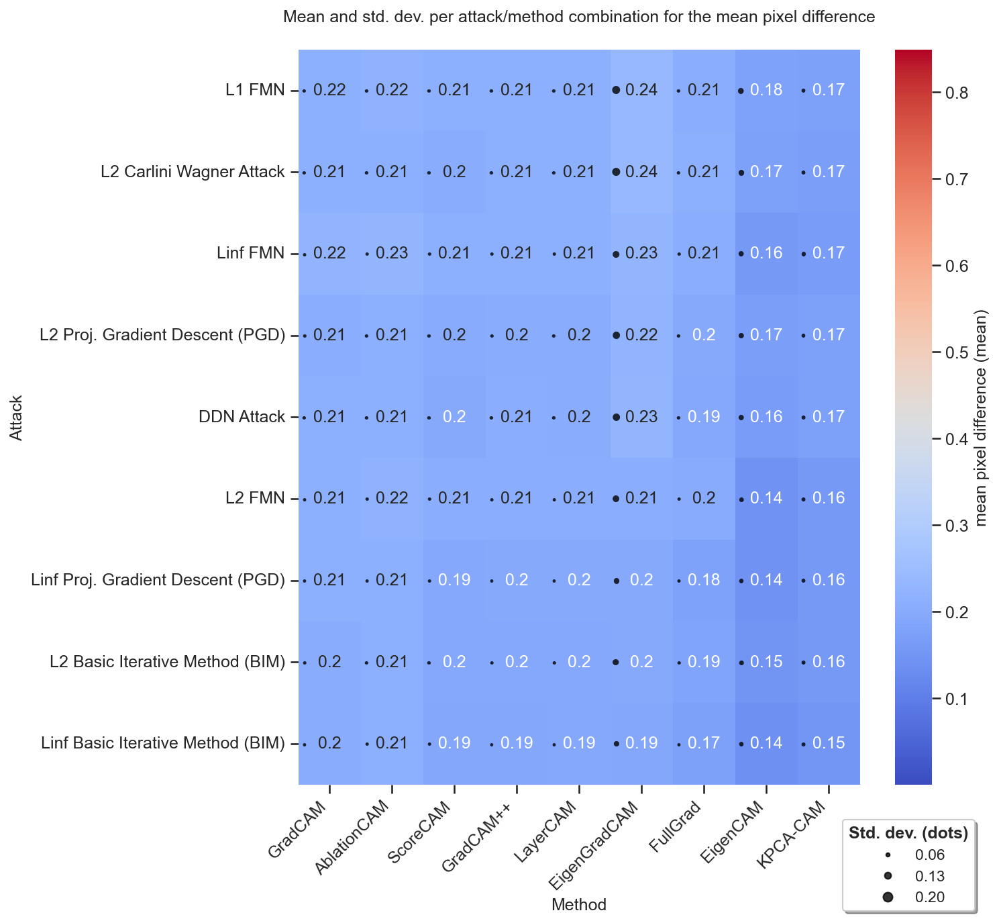

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


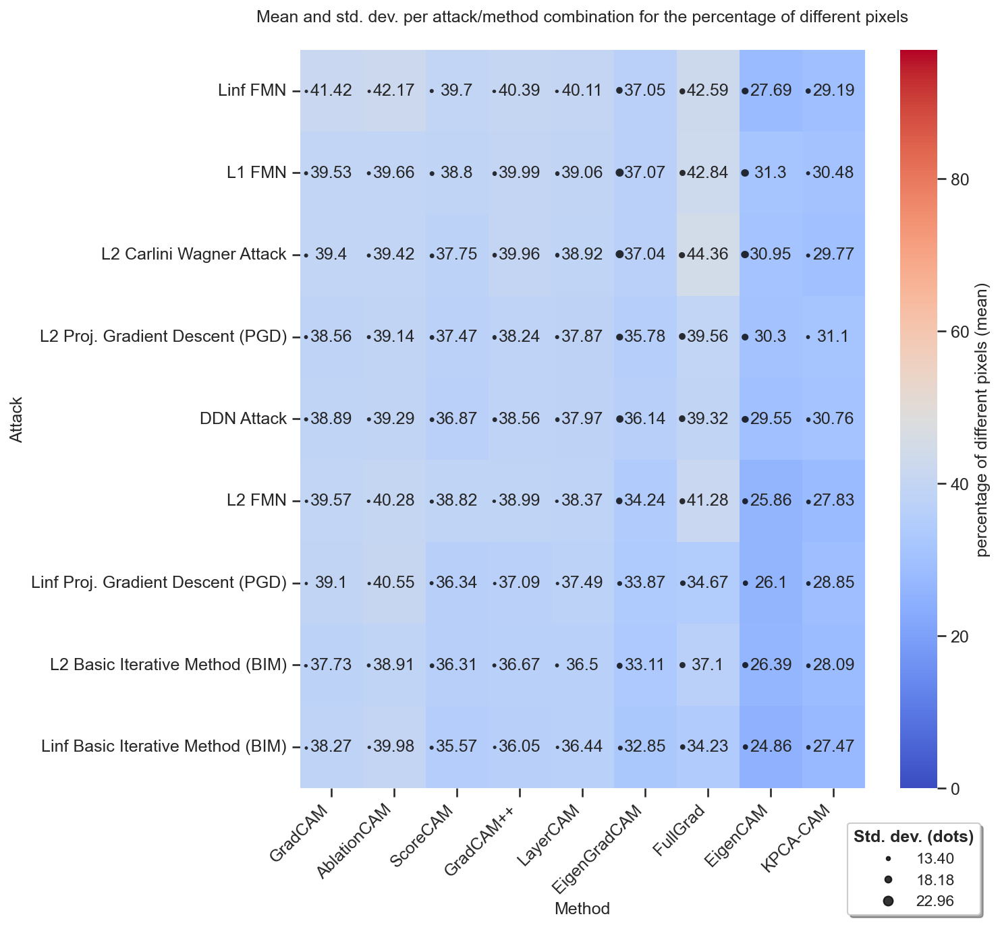

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


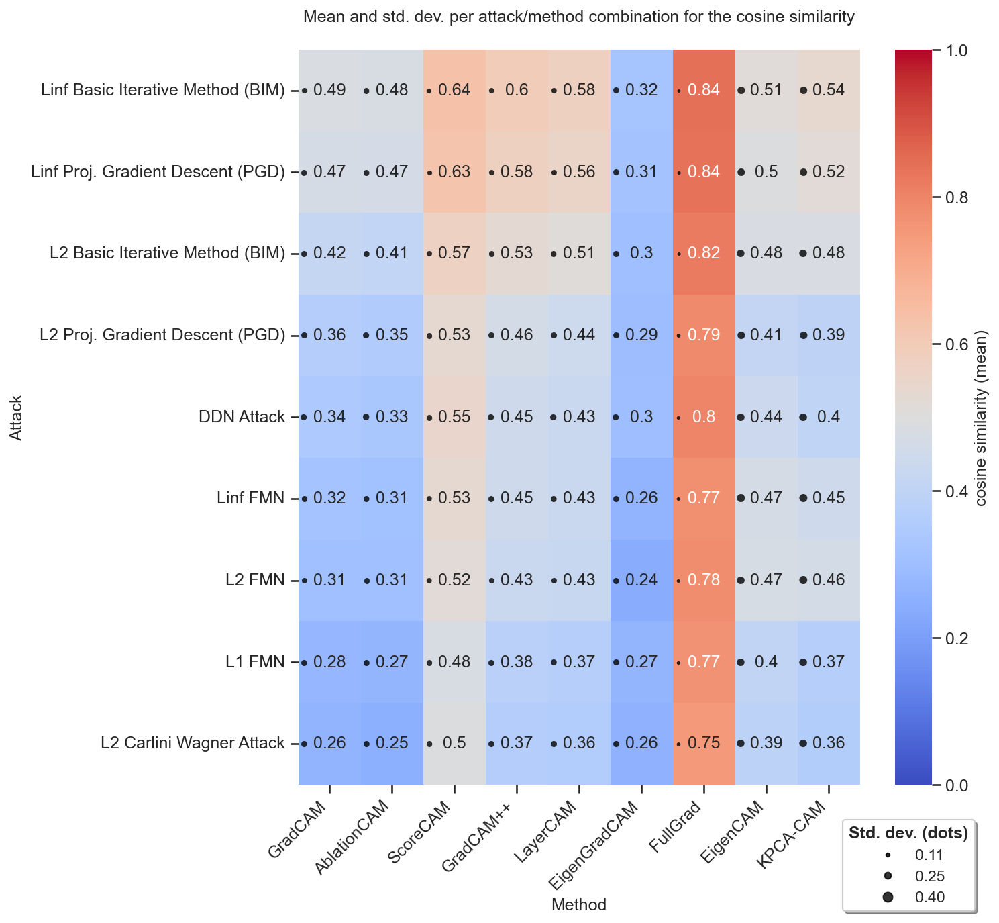

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


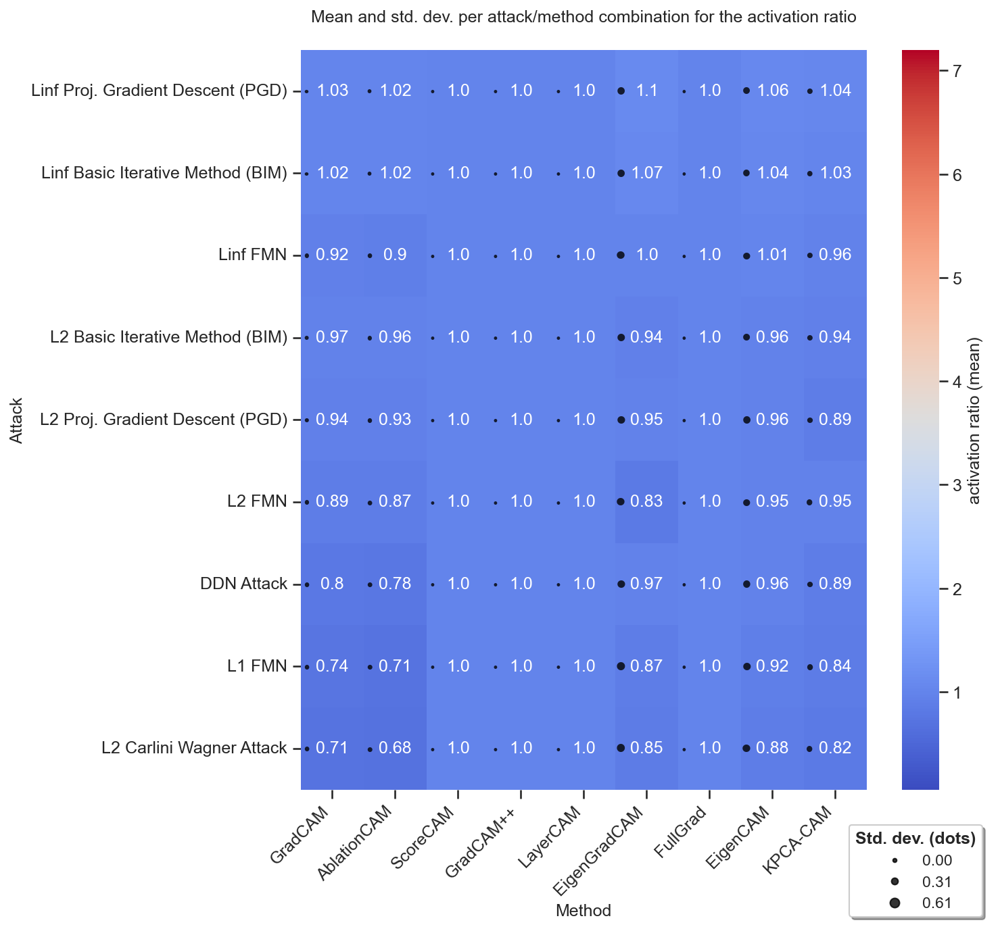

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


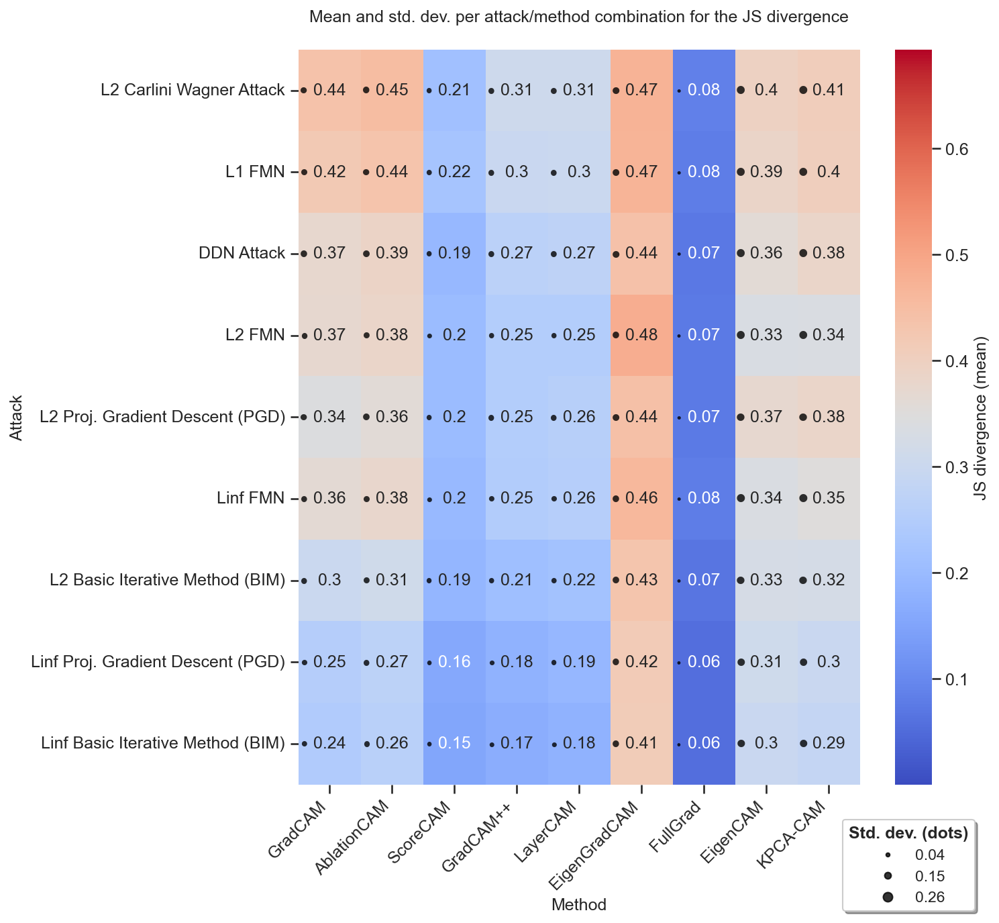

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


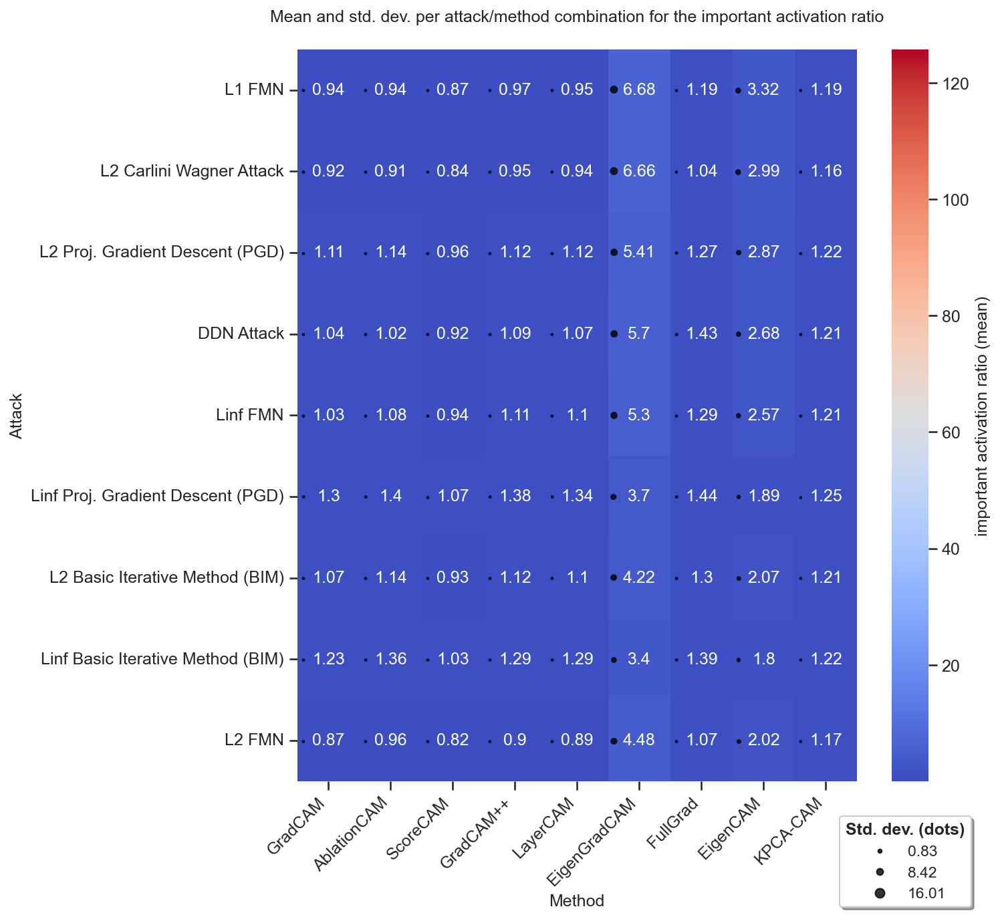

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


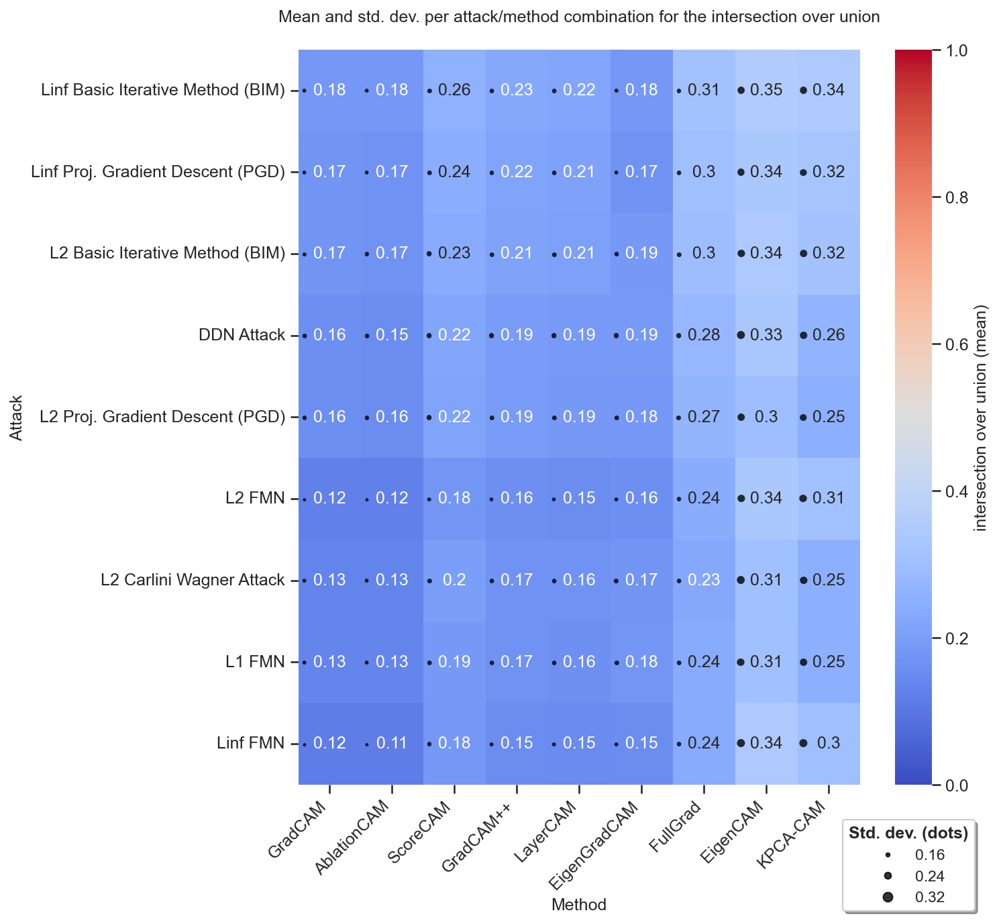

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


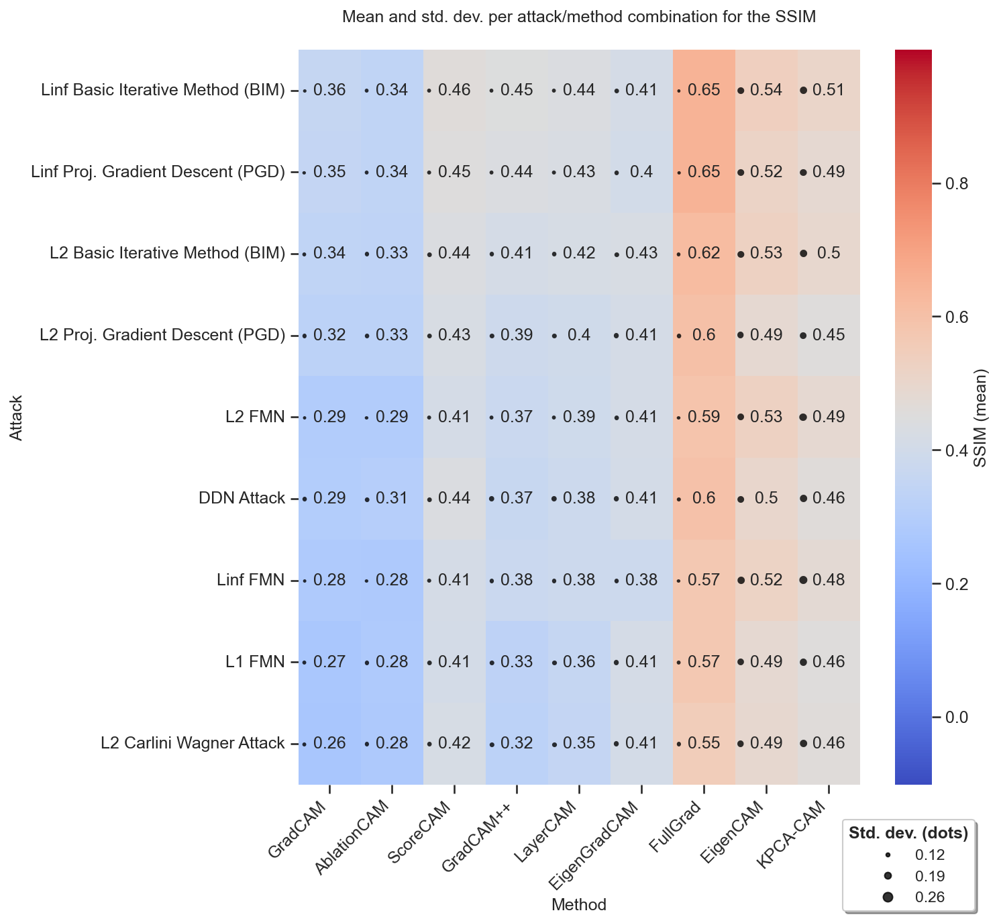

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


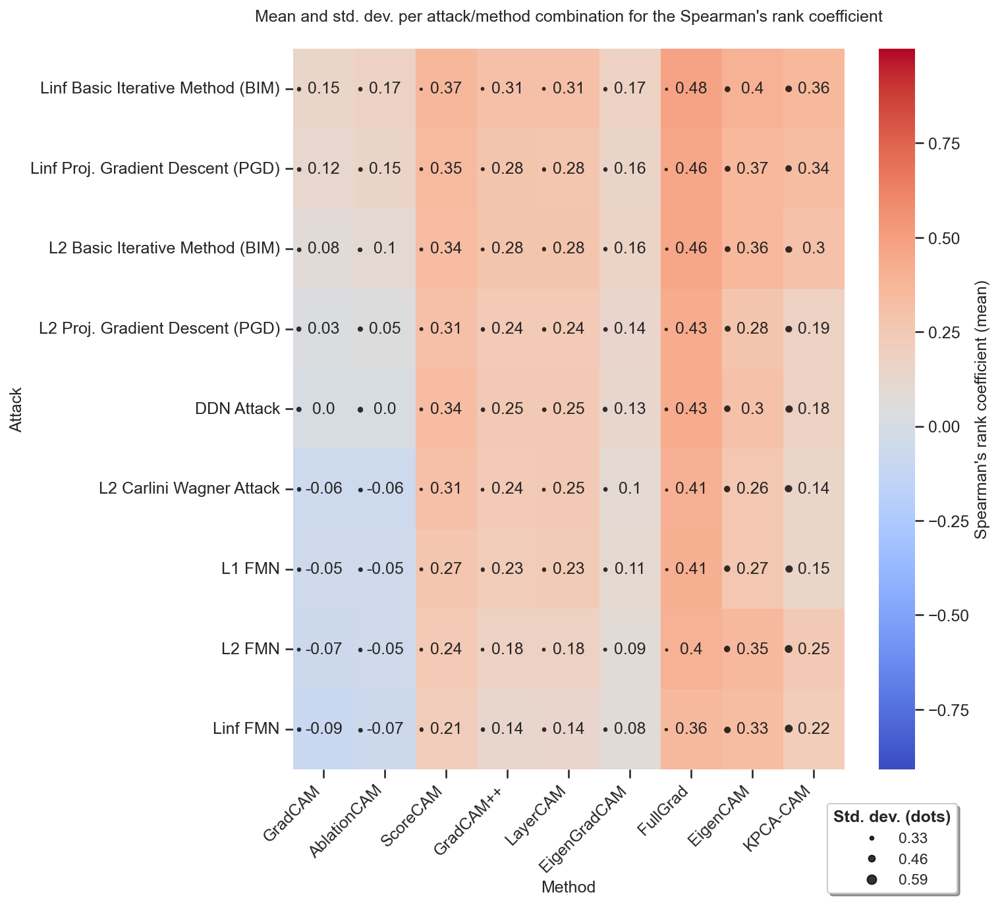

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1564062352.py:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")


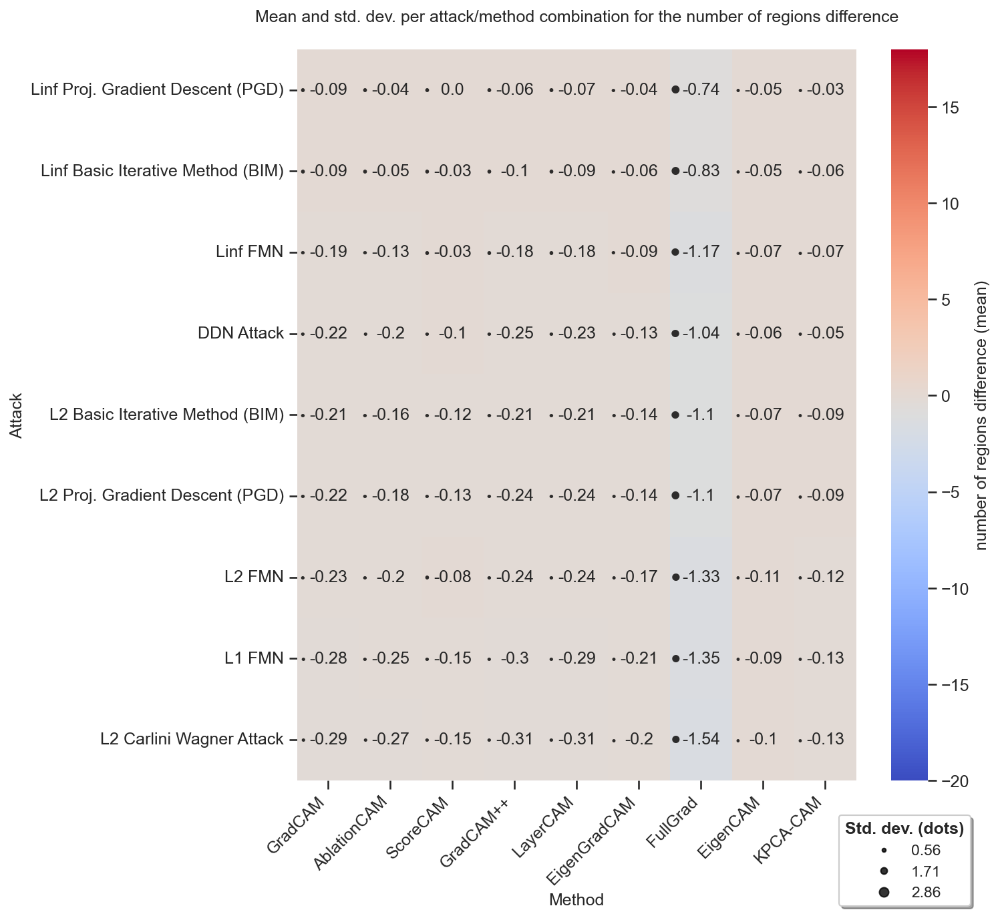

In [37]:
for metric in metric_columns:
    plot_metric_heatmap_with_std_dots_fixed(attack_df, metric, untargeted_df)

# compare distributions of attacks for targeted and untargeted attacks

In [42]:
def plot_metric_heatmap_comparison_vertical(df, metric, untargeted_df, cmap="coolwarm"):

    method_order = [
        "GradCAM", "AblationCAM", "ScoreCAM", "GradCAM++", "LayerCAM", 
        "EigenGradCAM", "FullGrad", "EigenCAM", "KPCA-CAM"]
    
    # Convert columns to ordered categoricals for both dataframes
    df["method"] = pd.Categorical(df["method"], categories=method_order, ordered=True)
    untargeted_df["method"] = pd.Categorical(untargeted_df["method"], categories=method_order, ordered=True)

    # Filter untargeted_df to only include the same attacks as in df
    targeted_attacks = df["attack"].unique()
    untargeted_filtered = untargeted_df[untargeted_df["attack"].isin(targeted_attacks)]

    # Pivot for both targeted and untargeted
    pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
    pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
    
    pivot_mean_untargeted = untargeted_filtered.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
    pivot_std_untargeted = untargeted_filtered.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")

    # Sort both by targeted attack performance
    sort_order = pivot_mean_targeted.mean(axis=1).sort_values(ascending=False).index
    pivot_mean_targeted = pivot_mean_targeted.loc[sort_order]
    pivot_std_targeted = pivot_std_targeted.loc[sort_order]
    pivot_mean_untargeted = pivot_mean_untargeted.reindex(sort_order)
    pivot_std_untargeted = pivot_std_untargeted.reindex(sort_order)

    # Global min/max for consistent color scale
    vmin = min(pivot_mean_targeted.min().min(), pivot_mean_untargeted.min().min())
    vmax = max(pivot_mean_targeted.max().max(), pivot_mean_untargeted.max().max())

    # Create vertical subplots (2 rows, 1 column)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

    # Plot targeted attacks (top)
    sns.heatmap(pivot_mean_targeted, cmap=cmap, annot=pivot_mean_targeted.round(2), 
                fmt="", cbar=False, ax=ax1, vmin=vmin, vmax=vmax)
    
    # Plot untargeted attacks (bottom)
    sns.heatmap(pivot_mean_untargeted, cmap=cmap, annot=pivot_mean_untargeted.round(2),
                fmt="", cbar=False, ax=ax2, vmin=vmin, vmax=vmax)
    
    # Add shared vertical colorbar at the right
    fig.colorbar(ax1.collections[0], ax=[ax1, ax2], label=f'{metric} (mean)', 
                orientation='vertical', pad=-0.45, shrink=0.75)
    
    # Hide x-tick labels for top plot, show attack names for both
    ax1.set_xticklabels([])  # Hide x-tick labels for the top plot
    ax1.set_xlabel("")       # Remove x-label from top plot
    
    # Add dots for both plots
    for ax, pivot_std, title_suffix in [(ax1, pivot_std_targeted, "Targeted"), 
                                        (ax2, pivot_std_untargeted, "Untargeted")]:
        max_std = pivot_std.max().max()
        min_std = pivot_std.min().min()
        
        for i, attack in enumerate(pivot_std.index):
            for j, method in enumerate(pivot_std.columns):
                std_val = pivot_std.loc[attack, method]
                if pd.notnull(std_val) and std_val > 0:
                    normalized_std = (std_val - min_std) / (max_std - min_std) if max_std > min_std else 0.5
                    fontsize = 8 + normalized_std * 12
                    ax.text(j + 0.5, i + 0.21, "•", ha="center", va="center",
                           fontsize=fontsize, color="black", alpha=0.8, weight='bold')
        
        ax.set_title(f"{title_suffix} - {metric}")
        ax.set_ylabel("Attack")
        if ax == ax2:  # Only bottom plot gets x-axis labels
            ax.set_xlabel("Method")
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
                    
    min_font = 6
    max_font = 18
    
    # Build legend handles (example std values)
    if max_std > 0:
        example_stds = np.linspace(min_std, max_std, 3)
        legend_dots = []
        legend_labels = []
        for val in example_stds:
            if max_std > min_std:
                normalized_std = (val - min_std) / (max_std - min_std)
            else:
                normalized_std = 0.5
            fontsize = min_font + normalized_std * (max_font - min_font)
            legend_dots.append(plt.Line2D([0], [0], marker="o", color="black", 
                                        markersize=fontsize/3, linestyle="", alpha=0.8))
            legend_labels.append(f"{val:.2f}")

        # Position legend on the right side
        legend_ax = fig.add_axes([0.79, 0.0, 0.08, 0.2])  # [left, bottom, width, height]
        legend_ax.axis('off')
        
        legend = legend_ax.legend(
            legend_dots, legend_labels,
            title="Std. dev. (dots)",
            loc="center",
            ncol=1,  
            frameon=True,
            fancybox=True,
            shadow=True
        )
        legend.get_title().set_fontweight('bold')

    plt.tight_layout()
    plt.savefig(f"results/big_dataset/targeted_vs_untargeted_{metric.replace(' ', '_')}_heatmap_vertical.svg", 
                format="svg", bbox_inches='tight')
    plt.show()

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

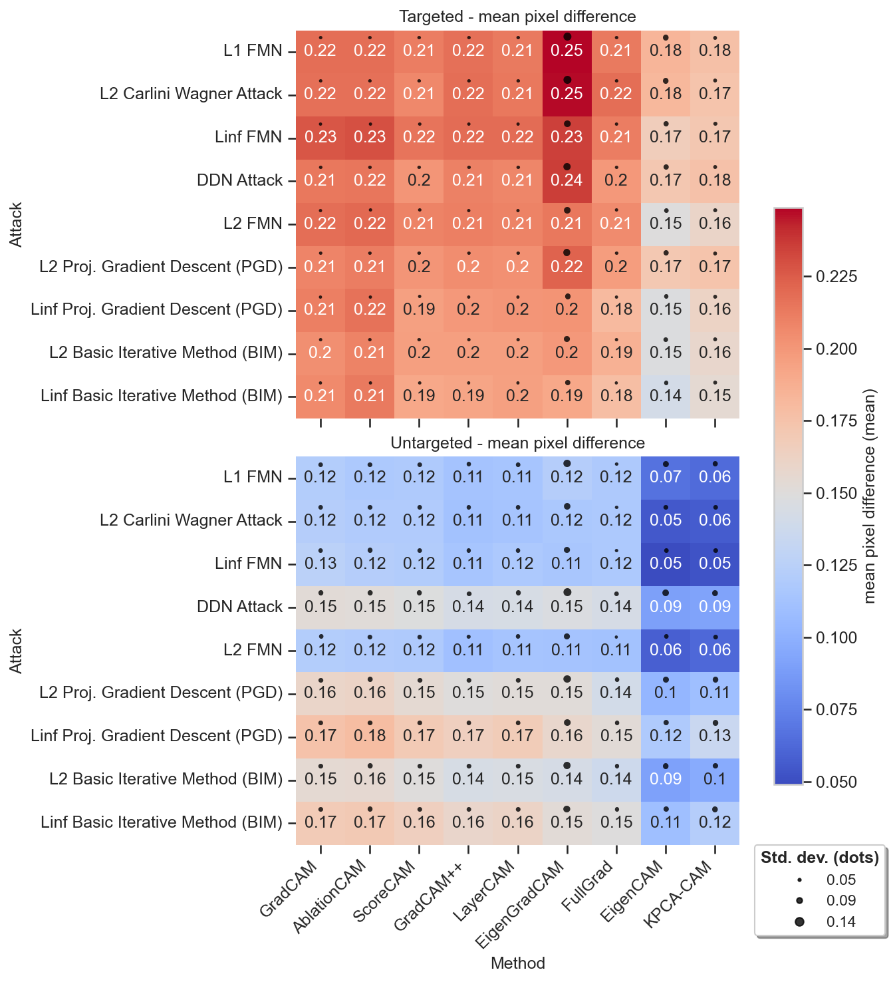

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

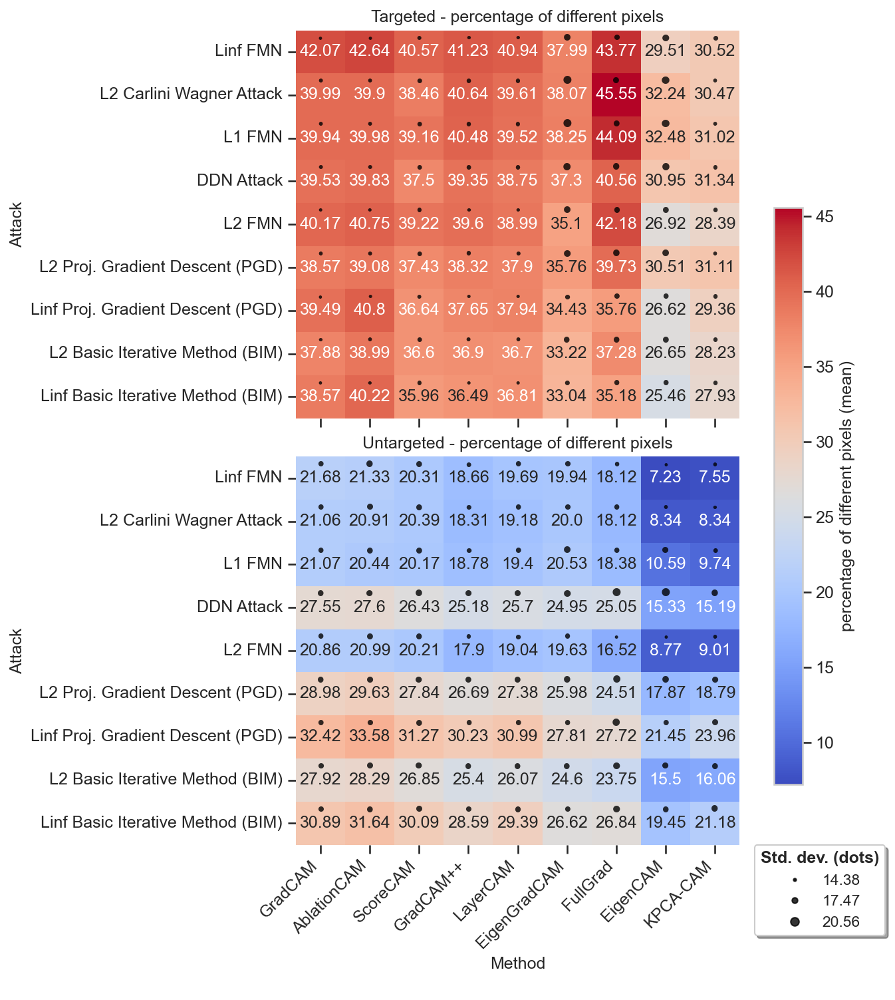

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

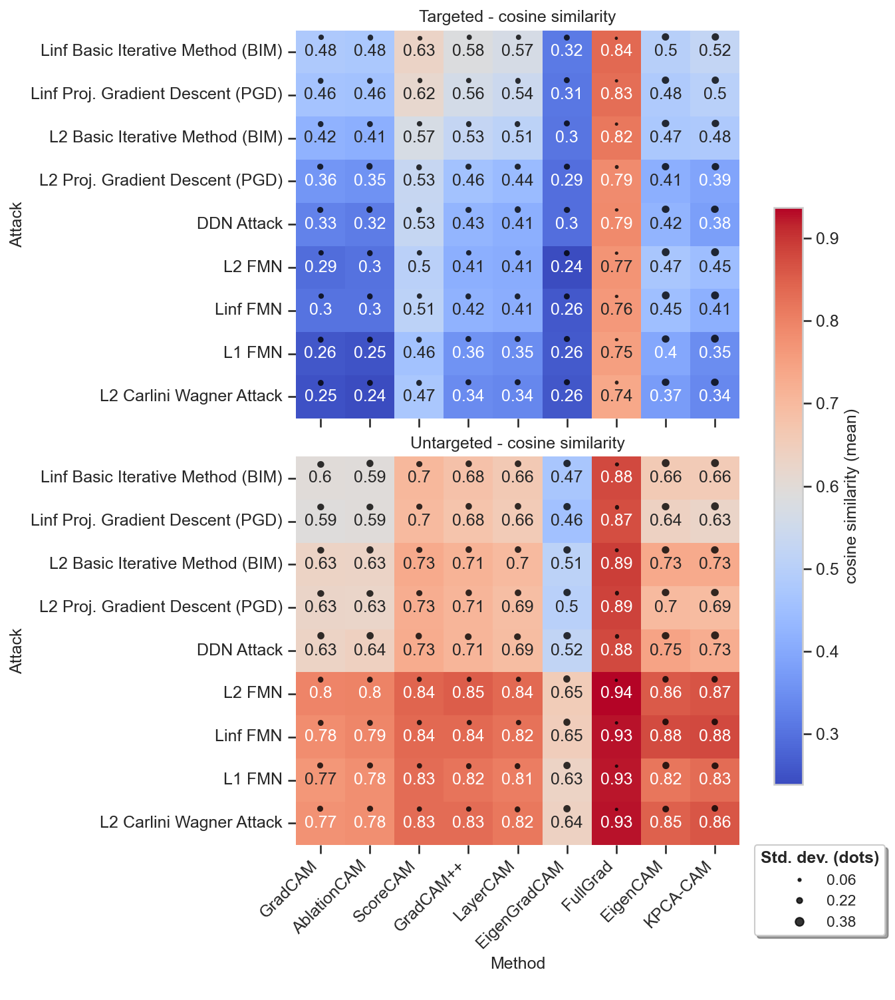

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

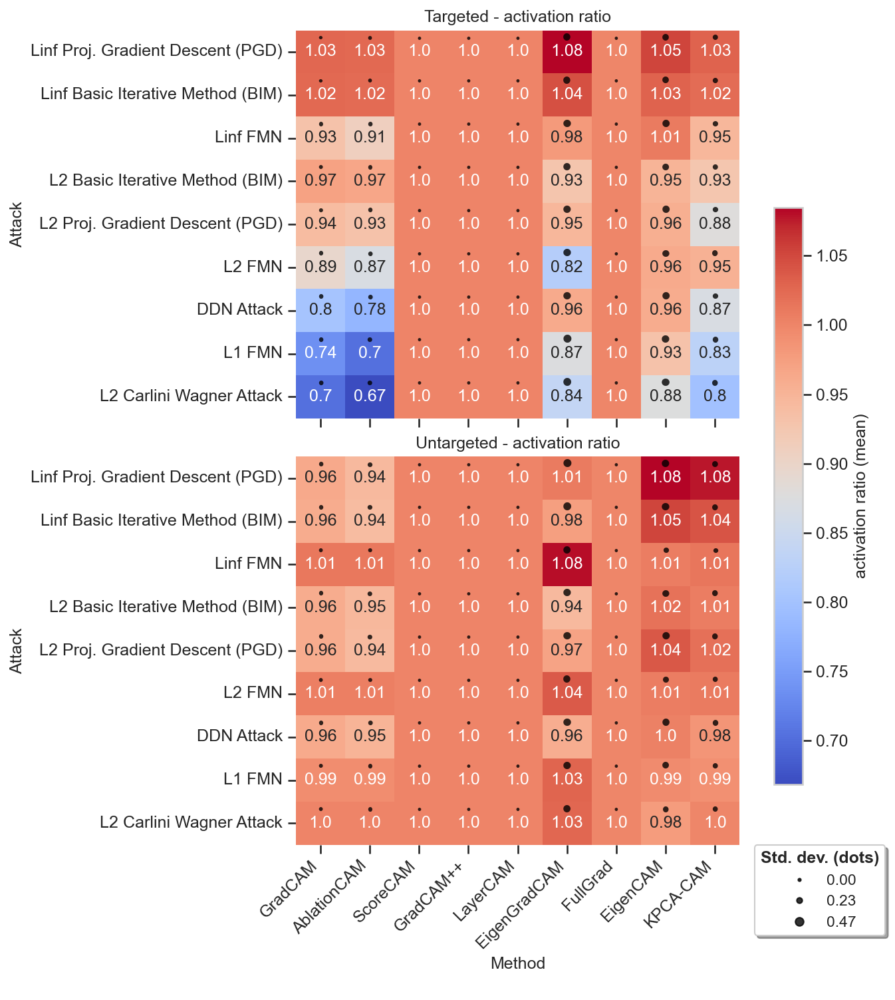

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

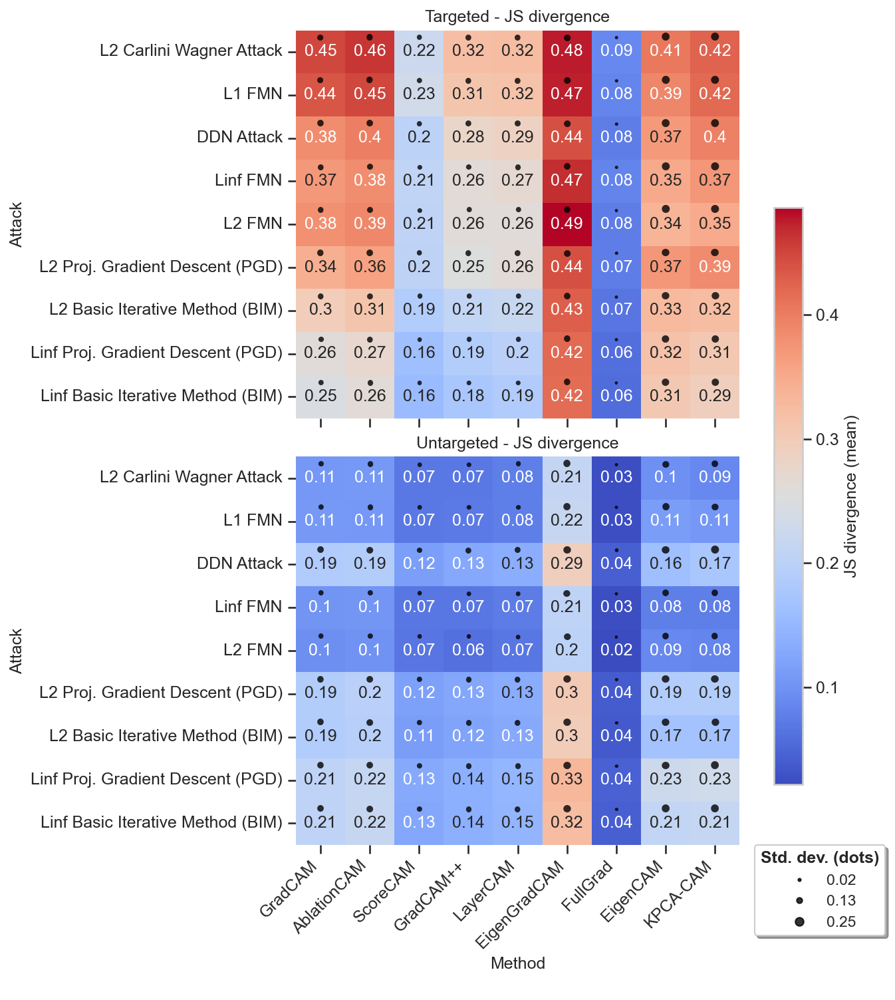

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

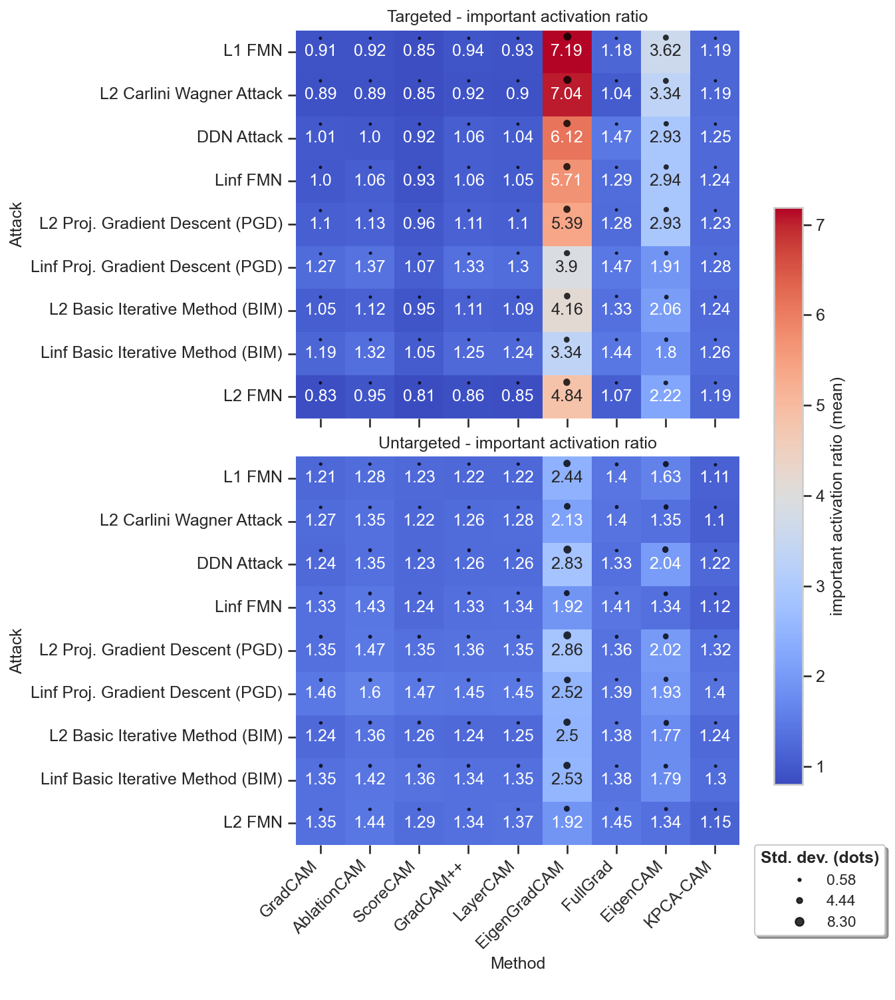

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

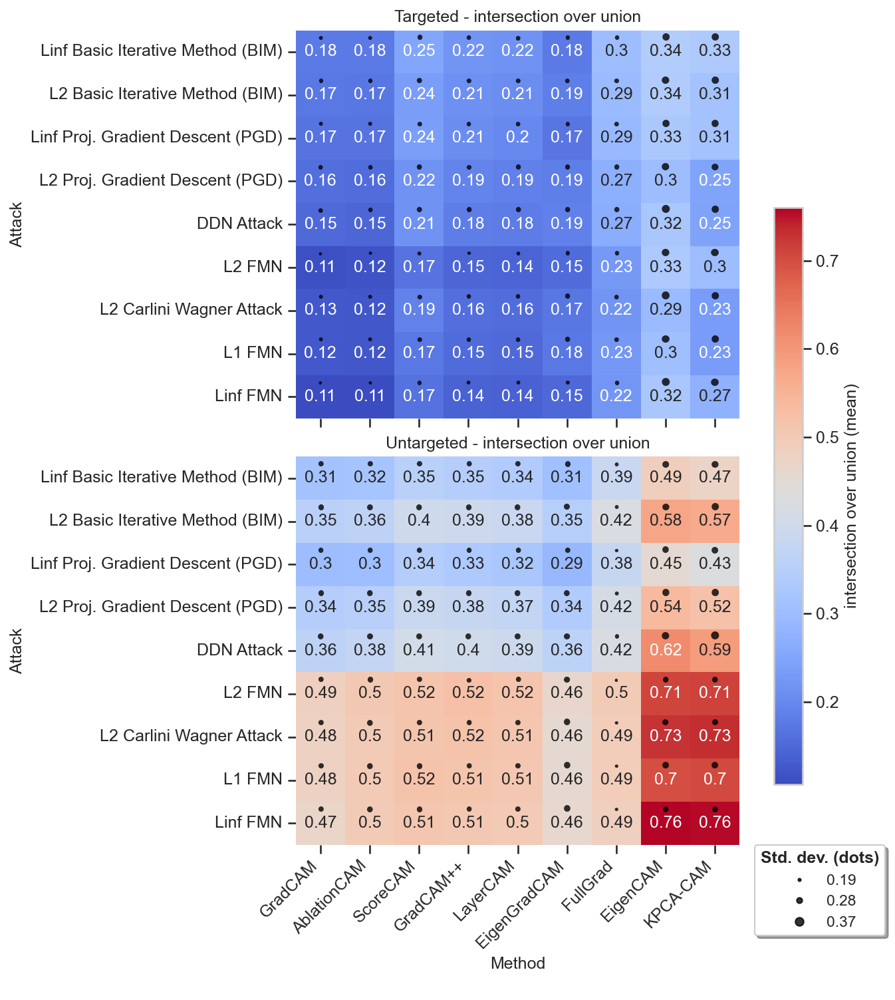

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

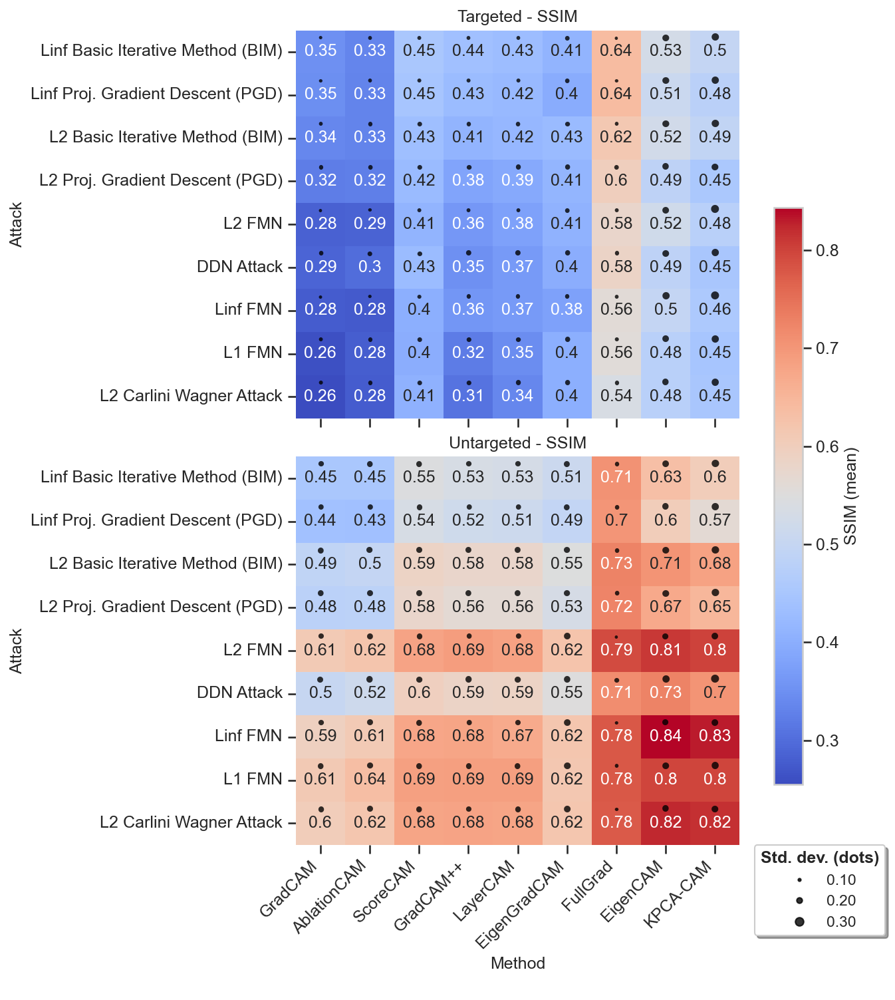

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

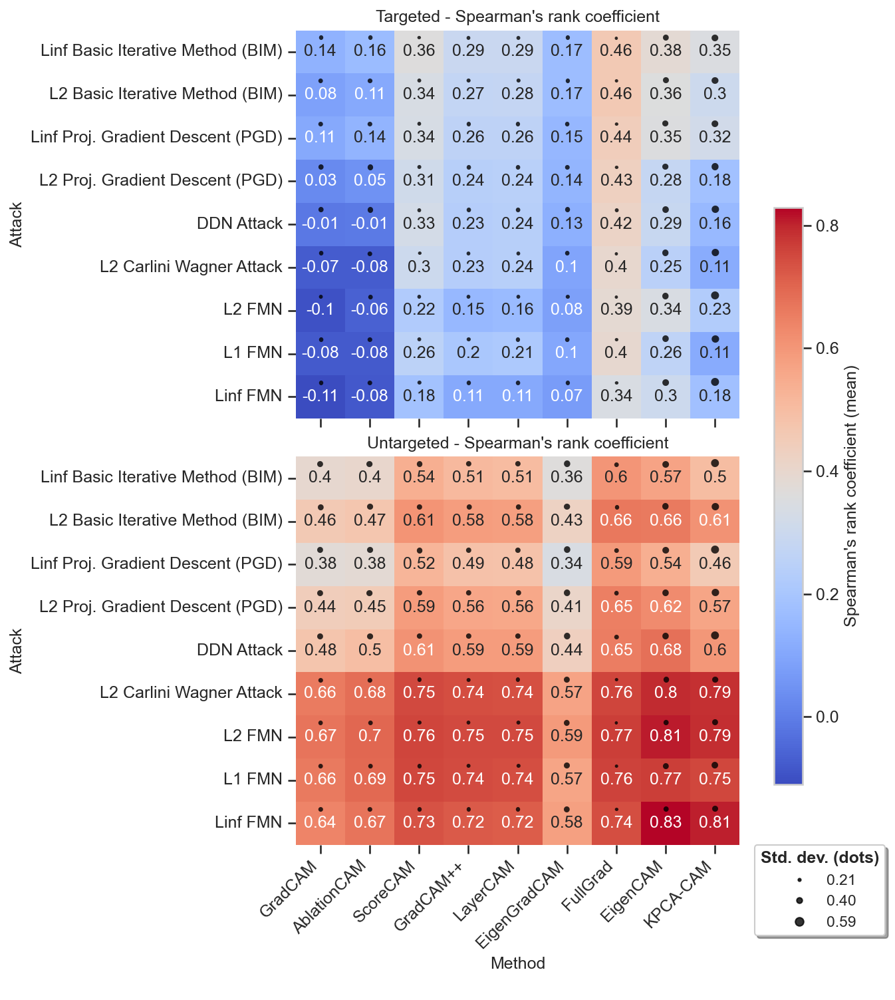

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:16: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_mean_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="mean")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:17: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_std_targeted = df.pivot_table(values=metric, index="attack", columns="method", aggfunc="std")
/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/3055848871.py:19: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. 

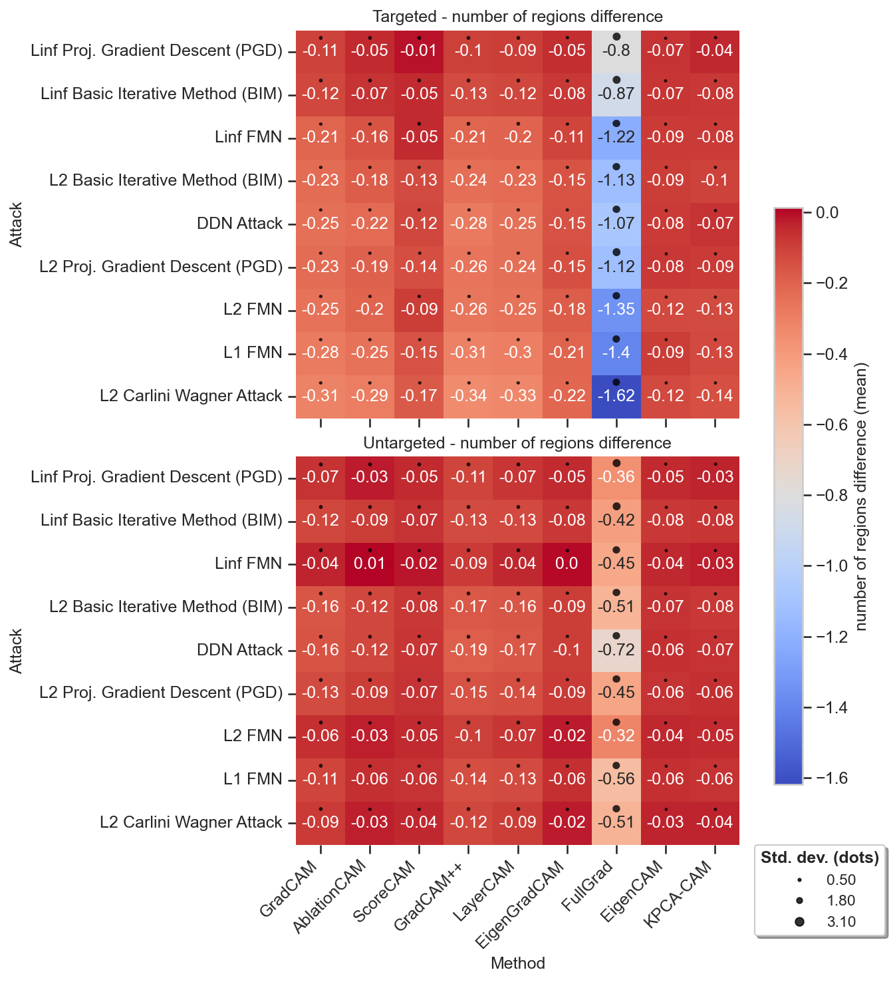

In [43]:
for metric in metric_columns:
    plot_metric_heatmap_comparison_vertical(results_df, metric, untargeted_df)


find images that represent the "average case" for untargeted/targeted attacks

In [47]:
# method: GradCAM, attack: L2 Carlini Wagner Attack 

selected_targeted_df = results_df[(results_df["method"] == "GradCAM") & (results_df["attack"] == "L2 Carlini Wagner Attack")]
selected_targeted_df

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
124137,0,GradCAM,L2 Carlini Wagner Attack,tench,solar dish,0.000074,0.539809,0.153919,0.208972,38.905054,2,1,0.032590,0.702564,0.600928,0.777247,0.032407,0.150138,-0.194711,-1
124138,1,GradCAM,L2 Carlini Wagner Attack,tench,affenpinscher,0.000205,0.450724,0.015827,0.158421,28.340242,1,1,0.380826,0.715026,0.302488,2.883033,0.180172,0.385558,0.466527,0
124139,2,GradCAM,L2 Carlini Wagner Attack,tench,sombrero,0.000020,0.565741,0.080741,0.262156,46.310985,1,1,0.095820,0.876923,0.494727,0.346040,0.069943,0.182901,-0.014718,0
124140,3,GradCAM,L2 Carlini Wagner Attack,goldfish,American chameleon,0.000021,0.279218,0.046086,0.208551,32.202647,1,1,0.287899,0.847479,0.395626,0.145897,0.146530,0.199197,-0.011318,0
124141,4,GradCAM,L2 Carlini Wagner Attack,goldfish,grasshopper,0.000019,0.342394,0.016350,0.274175,49.900351,1,1,0.242110,0.865285,0.471101,0.253051,0.119955,0.120541,0.100195,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145921,2992,GradCAM,L2 Carlini Wagner Attack,bolete,mask,0.000027,0.446443,0.081377,0.262163,44.678731,1,1,0.032406,0.653270,0.624197,0.255109,0.099606,0.128184,-0.216403,0
145922,2994,GradCAM,L2 Carlini Wagner Attack,ear,pomegranate,0.000008,0.425354,0.242536,0.217187,37.587691,2,2,0.022823,0.851852,0.629529,0.483266,0.018523,0.324687,-0.439349,0
145923,2995,GradCAM,L2 Carlini Wagner Attack,ear,crayfish,0.000026,0.277503,0.110275,0.212335,36.184630,2,1,0.036924,0.824742,0.571919,0.485834,0.000000,0.192592,-0.489644,-1
145924,2997,GradCAM,L2 Carlini Wagner Attack,toilet tissue,cellular telephone,0.000026,0.311977,0.012915,0.232248,39.931441,1,1,0.232883,0.590426,0.444197,1.250000,0.055816,0.164415,0.064464,0


In [48]:
selected_untargeted_df = untargeted_df[(untargeted_df["method"] == "GradCAM") & (untargeted_df["attack"] == "L2 Carlini Wagner Attack")]
selected_untargeted_df

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
565546,0,GradCAM,L2 Carlini Wagner Attack,tench,reel,4.661010e-05,0.539809,0.312238,0.199456,42.171556,2,1,0.354259,0.989744,0.262050,1.066922,0.112774,0.374298,0.136817,-1
565547,1,GradCAM,L2 Carlini Wagner Attack,tench,platypus,1.064602e-05,0.450724,0.122280,0.085841,16.232860,1,1,0.747080,0.979275,0.097000,1.533419,0.490531,0.607667,0.765281,0
565548,2,GradCAM,L2 Carlini Wagner Attack,tench,barracouta,8.139097e-05,0.565741,0.239994,0.050957,5.891263,1,1,0.973938,0.969231,0.016195,1.352887,0.818429,0.853445,0.950286,0
565549,3,GradCAM,L2 Carlini Wagner Attack,goldfish,ladybug,1.641778e-08,0.279218,0.221501,0.124969,21.998565,1,1,0.806429,0.959796,0.086821,0.301726,0.486887,0.553295,0.683498,0
565550,4,GradCAM,L2 Carlini Wagner Attack,goldfish,puffer,4.610438e-06,0.342394,0.061560,0.218007,40.722656,1,1,0.598624,0.849741,0.205228,0.333198,0.236677,0.317864,0.539889,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
587339,2992,GradCAM,L2 Carlini Wagner Attack,bolete,mushroom,1.449032e-05,0.446443,0.200698,0.041543,0.284997,1,1,0.984955,1.000000,0.007291,0.955394,0.842806,0.897767,0.973105,0
587340,2994,GradCAM,L2 Carlini Wagner Attack,ear,corn,3.243743e-06,0.425354,0.279660,0.031265,0.338807,2,2,0.986920,0.910053,0.012384,1.093039,0.855070,0.835058,0.866672,0
587341,2995,GradCAM,L2 Carlini Wagner Attack,ear,corn,7.664551e-06,0.277503,0.192794,0.030928,0.000000,2,1,0.993013,1.005155,0.010408,0.562471,0.943073,0.860412,0.904485,-1
587342,2997,GradCAM,L2 Carlini Wagner Attack,toilet tissue,paper towel,3.294682e-06,0.311977,0.178916,0.076898,13.229432,1,1,0.928052,0.989362,0.029157,3.317819,0.675572,0.769957,0.923080,0


In [49]:
# find image IDs with cosine similarity being close to the mean cosine similarity
targeted_mean_cosine_sim = selected_targeted_df["cosine similarity"].mean()
targeted_mean_activation_ratio = selected_targeted_df["activation ratio"].mean()
targeted_mean_important_activation_ratio = selected_targeted_df["important activation ratio"].mean()


selected_targeted_image_ids = selected_targeted_df[(selected_targeted_df["cosine similarity"] > targeted_mean_cosine_sim - 0.1) & 
                     (selected_targeted_df["cosine similarity"] < targeted_mean_cosine_sim + 0.1) &
                     (selected_targeted_df["activation ratio"] > targeted_mean_activation_ratio - 0.1) & 
                     (selected_targeted_df["activation ratio"] < targeted_mean_activation_ratio + 0.1) 
                    ]["image ID"]


In [50]:
untargeted_mean_cosine_sim = selected_untargeted_df["cosine similarity"].mean()
untargeted_mean_activation_ratio = selected_untargeted_df["activation ratio"].mean()
untargeted_mean_important_activation_ratio = selected_untargeted_df["important activation ratio"].mean()


selected_untargeted_image_ids = selected_untargeted_df[(selected_untargeted_df["cosine similarity"] > untargeted_mean_cosine_sim - 0.1) & 
                     (selected_untargeted_df["cosine similarity"] < untargeted_mean_cosine_sim + 0.1) &
                     (selected_untargeted_df["activation ratio"] > untargeted_mean_activation_ratio - 0.1) & 
                     (selected_untargeted_df["activation ratio"] < untargeted_mean_activation_ratio + 0.1)
                    ]["image ID"]

In [51]:
# print common image ids
common_image_ids = selected_targeted_image_ids[selected_targeted_image_ids.isin(selected_untargeted_image_ids)]
common_image_ids

125634     196
125645     210
126412     306
126653     327
127440     444
128680     597
129648     707
130860     883
131624     977
131632     985
132445    1066
133448    1198
133706    1231
134340    1331
134561    1356
134573    1372
134794    1378
135463    1494
135651    1529
135822    1549
136265    1607
137199    1732
137413    1761
137871    1824
137888    1844
138129    1873
138136    1880
138422    1922
138433    1937
138647    1955
138843    1998
139263    2055
139272    2065
140020    2161
140290    2205
140531    2224
141442    2358
141677    2392
141680    2396
142328    2490
142719    2535
142725    2543
142963    2581
142966    2587
143164    2594
143652    2671
143663    2683
143904    2705
144321    2758
144322    2759
144555    2802
144556    2803
144801    2837
145025    2858
145031    2864
145289    2901
145913    2981
Name: image ID, dtype: int64

In [52]:
selected_targeted_df[selected_targeted_df["image ID"].isin(common_image_ids)]

,image ID,method,attack,true class,predicted class,images mean difference,original score,adversarial score,mean pixel difference,percentage of different pixels,number of regions original,number of regions adversarial,cosine similarity,activation ratio,JS divergence,important activation ratio,intersection over union,SSIM,Spearman's rank coefficient,number of regions difference
125634,196,GradCAM,L2 Carlini Wagner Attack,sea snake,great white shark,0.000014,0.307765,0.041870,0.232094,39.006696,1,1,0.152432,0.723404,0.481509,0.505288,0.021426,0.121926,-0.048783,0
125645,210,GradCAM,L2 Carlini Wagner Attack,harvestman,slug,0.000033,0.494227,0.019315,0.173494,27.674585,1,1,0.189563,0.630208,0.463620,0.510270,0.187715,0.242639,-0.205871,0
126412,306,GradCAM,L2 Carlini Wagner Attack,echidna,koala,0.000194,0.701016,0.022328,0.201039,36.220504,1,1,0.167927,0.780628,0.497895,1.699001,0.102263,0.123934,-0.178467,0
126653,327,GradCAM,L2 Carlini Wagner Attack,brain coral,sea slug,0.000052,0.521938,0.119796,0.334091,70.691167,2,1,0.294218,0.615385,0.408719,3.364813,0.019817,0.122600,-0.296428,-1
127440,444,GradCAM,L2 Carlini Wagner Attack,killer whale,umbrella,0.000055,0.398516,0.069346,0.226295,35.865753,1,1,0.349869,0.610256,0.381013,3.272204,0.153647,0.087803,0.056672,0
128680,597,GradCAM,L2 Carlini Wagner Attack,Scotch terrier,Brabancon griffon,0.000020,0.290200,0.035354,0.243947,45.629385,1,1,0.282476,0.762887,0.384841,0.469183,0.119291,0.176154,0.156216,0
129648,707,GradCAM,L2 Carlini Wagner Attack,German shepherd,toy terrier,0.000035,0.439609,0.089929,0.177515,34.791534,1,1,0.171898,0.788660,0.452537,0.899676,0.020551,0.310022,0.162119,0
130860,883,GradCAM,L2 Carlini Wagner Attack,brown bear,kit fox,0.000078,0.238669,0.009762,0.270547,50.930724,2,1,0.196672,0.677596,0.492337,0.715068,0.026861,0.132154,-0.449898,-1
131624,977,GradCAM,L2 Carlini Wagner Attack,sulphur butterfly,daisy,0.000101,0.583497,0.026293,0.265833,48.610890,3,2,0.236766,0.785714,0.442612,0.301947,0.102202,0.200757,-0.018937,-1
131632,985,GradCAM,L2 Carlini Wagner Attack,sea urchin,hognose snake,0.000032,0.405099,0.106290,0.302165,58.185188,2,1,0.189373,0.702564,0.435583,0.297912,0.115806,0.139873,-0.075192,-1


## Investigate class similarites (Wu-Palmer) before and after attack

In [2]:
import nltk
from nltk.corpus import wordnet as wn

# Download WordNet if needed
nltk.download("wordnet")
nltk.download("omw-1.4")  # for expanded multilingual WordNet

# Helper: map ImageNet wnid to NLTK synset
def wnid_to_synset(wnid: str):
    """
    Convert ImageNet wnid to NLTK WordNet synset.
    E.g., 'n02123159' -> wn.synset('n02123159')
    Note: only works for nouns (ImageNet classes are usually nouns).
    """
    # ImageNet wnids start with 'n' followed by 8 digits
    try:
        return wn.synset_from_pos_and_offset('n', int(wnid[1:]))
    except Exception as e:
        print(f"Could not convert {wnid} to synset: {e}")
        return None

# Examples: two wnids
wnid1 = "n02123159"  # tiger cat
wnid2 = "n02123045"  # tabby cat

syn1 = wnid_to_synset(wnid1)
syn2 = wnid_to_synset(wnid2)

# Check available similarity metrics
if syn1 and syn2:
    print("Path similarity:", syn1.path_similarity(syn2))  # 0-1, higher = more similar
    print("Wu-Palmer similarity:", syn1.wup_similarity(syn2))  # 0-1, higher = more similar
    # Resnik similarity requires Information Content (IC)
    # You can use nltk.corpus.wordnet_ic
    from nltk.corpus import wordnet_ic
    nltk.download("wordnet_ic")
    brown_ic = wordnet_ic.ic('ic-brown.dat')
    print("Resnik similarity:", syn1.res_similarity(syn2, brown_ic))

# Compute distance 
def synset_distance(syn1, syn2, metric="wup"):
    if metric == "wup":
        sim = syn1.wup_similarity(syn2)
    elif metric == "path":
        sim = syn1.path_similarity(syn2)
    elif metric == "jcn":
        sim = syn1.jcn_similarity(syn2, brown_ic)
    else:
        raise ValueError("metric must be 'wup' or 'path'")
    if sim is None:
        return 0.0  # treat None as maximally distant
    return sim

print("Distance (1 - Wu-Palmer):", synset_distance(syn1, syn2))

[nltk_data] Downloading package wordnet to /Users/jakob/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/jakob/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Path similarity: 0.3333333333333333
Wu-Palmer similarity: 0.875
Resnik similarity: 9.509772855461128
Distance (1 - Wu-Palmer): 0.875


[nltk_data] Downloading package wordnet_ic to
[nltk_data]     /Users/jakob/nltk_data...
[nltk_data]   Package wordnet_ic is already up-to-date!


In [47]:
print(syn1)

Synset('tiger_cat.n.02')


In [3]:
import json
import urllib.request
from pathlib import Path

def load_imagenet_class_index(local_path: str = None, save_copy: str = "imagenet_class_index.json"):
    """
    Load JSON mapping from ImageNet class index: index → [wnid, human-readable label].
    Try local first, then download and save.
    """
    if local_path:
        lp = Path(local_path)
        if lp.exists():
            data = json.loads(lp.read_text(encoding="utf-8"))
            return data
    sc = Path(save_copy)
    if sc.exists():
        return json.loads(sc.read_text(encoding="utf-8"))
    
    # Try downloading from known source
    url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
    try:
        with urllib.request.urlopen(url) as resp:
            data = json.load(resp)
        # Save a local copy
        sc.write_text(json.dumps(data), encoding="utf-8")
        return data
    except Exception as e:
        raise RuntimeError("Could not load imagenet_class_index.json: " + str(e))


# Build mapping
class_index = load_imagenet_class_index()
# Build name → wnid mapping with aliases
name_to_wnid = {}
wnid_to_name = {}
for key, (wnid, label) in class_index.items():
    wnid_to_name[wnid] = label
    # Canonical lowercase
    norm_label = label.lower()
    
    # Add canonical
    name_to_wnid[norm_label] = wnid
    
    # Add underscores version
    name_to_wnid[norm_label.replace(" ", "_")] = wnid
    
    # Add spaces version
    name_to_wnid[norm_label.replace("_", " ")] = wnid

# Now both should resolve:
print("tiger_cat ->", name_to_wnid.get("tiger_cat"))
print("tiger cat ->", name_to_wnid.get("tiger cat"))

tiger_cat -> n02123159
tiger cat -> n02123159


In [4]:
wnid1 = name_to_wnid.get("tiger_cat")

wnid2 = name_to_wnid.get("tabby")
wnid2

'n02123045'

In [5]:

syn1 = wnid_to_synset(wnid1)
syn2 = wnid_to_synset(wnid2)
print("Distance (1 - Wu-Palmer):", synset_distance(syn1, syn2))

Distance (1 - Wu-Palmer): 0.875


In [6]:
# for class in results df check conversion to wnid

results_df["wnid_true_class"] = results_df["true class"].apply(lambda x: name_to_wnid.get(x.lower()))

results_df["wnid_pred_class"] = results_df["predicted class"].apply(lambda x: name_to_wnid.get(x.lower()))


untargeted_df["wnid_true_class"] = untargeted_df["true class"].apply(lambda x: name_to_wnid.get(x.lower()))
untargeted_df["wnid_pred_class"] = untargeted_df["predicted class"].apply(lambda x: name_to_wnid.get(x.lower()))

print(results_df["wnid_true_class"].isnull().sum())
print(results_df["wnid_pred_class"].isnull().sum())
print(untargeted_df["wnid_true_class"].isnull().sum())
print(untargeted_df["wnid_pred_class"].isnull().sum())

162
81
477
1737


In [7]:
results_df["attack"].unique()

array(['L2 Proj. Gradient Descent (PGD)', 'L2 FMN', 'L1 FMN',
       'Linf Proj. Gradient Descent (PGD)', 'Linf FMN',
       'Linf Basic Iterative Method (BIM)', 'L2 Carlini Wagner Attack',
       'DDN Attack', 'L2 Basic Iterative Method (BIM)'], dtype=object)

In [8]:

# Cache synsets to speed up repeated lookups
unique_wnids = pd.unique(results_df[['wnid_true_class', 'wnid_pred_class']].values.ravel())
class_to_syn = {cls: wnid_to_synset(cls) for cls in unique_wnids if cls is not None}


# Calculate distance for each row, avoid None wnids
targeted_wnid_df = results_df[results_df['wnid_true_class'].notnull() & results_df['wnid_pred_class'].notnull()]

targeted_wnid_df['class_distance'] = targeted_wnid_df.apply(
    lambda row: synset_distance(class_to_syn[row['wnid_true_class']], class_to_syn[row['wnid_pred_class']]),
    axis=1
)


/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_6019/1385640765.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  targeted_wnid_df['class_distance'] = targeted_wnid_df.apply(


In [59]:
for method in targeted_wnid_df["method"].unique():
    for attack in targeted_wnid_df["attack"].unique():
        filtered_df = targeted_wnid_df[(targeted_wnid_df["attack"] == attack) & (targeted_wnid_df["method"] == method)]
        
        # check correlation between class distance and metrics
        for metric in metric_columns + ["images mean difference"]:
            if metric != "class_distance":
                corr = filtered_df["class_distance"].corr(filtered_df[metric])
                print(f"Method: {method}, Attack: {attack}, Correlation between class distance and {metric}: {corr:.2f}")



Method: GradCAM, Attack: L2 Proj. Gradient Descent (PGD), Correlation between class distance and mean pixel difference: -0.25
Method: GradCAM, Attack: L2 Proj. Gradient Descent (PGD), Correlation between class distance and percentage of different pixels: -0.25
Method: GradCAM, Attack: L2 Proj. Gradient Descent (PGD), Correlation between class distance and cosine similarity: 0.26
Method: GradCAM, Attack: L2 Proj. Gradient Descent (PGD), Correlation between class distance and activation ratio: 0.15
Method: GradCAM, Attack: L2 Proj. Gradient Descent (PGD), Correlation between class distance and JS divergence: -0.25
Method: GradCAM, Attack: L2 Proj. Gradient Descent (PGD), Correlation between class distance and important activation ratio: -0.00
Method: GradCAM, Attack: L2 Proj. Gradient Descent (PGD), Correlation between class distance and intersection over union: 0.28
Method: GradCAM, Attack: L2 Proj. Gradient Descent (PGD), Correlation between class distance and SSIM: 0.30
Method: GradCA

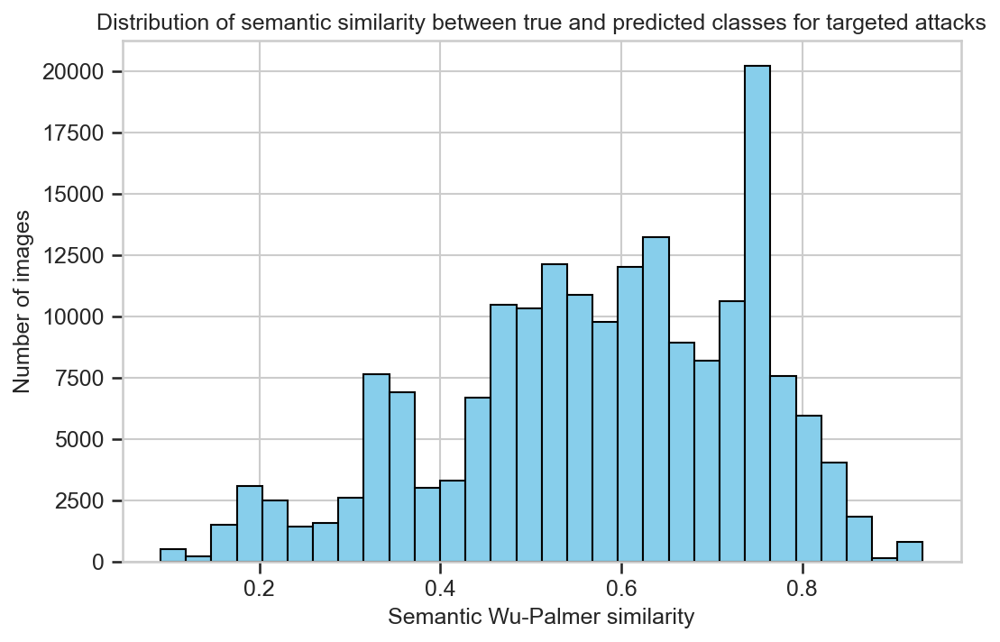

In [9]:

# Plot histogram
plt.figure(figsize=(8,5))
plt.hist(targeted_wnid_df['class_distance'].dropna(), bins=30, color='skyblue', edgecolor='black')
plt.xlabel("Semantic Wu-Palmer similarity")
plt.ylabel("Number of images")
plt.title("Distribution of semantic similarity between true and predicted classes for targeted attacks")
plt.show()


/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_6019/3617337351.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  untargeted_wnid_df['class_distance'] = untargeted_wnid_df.apply(


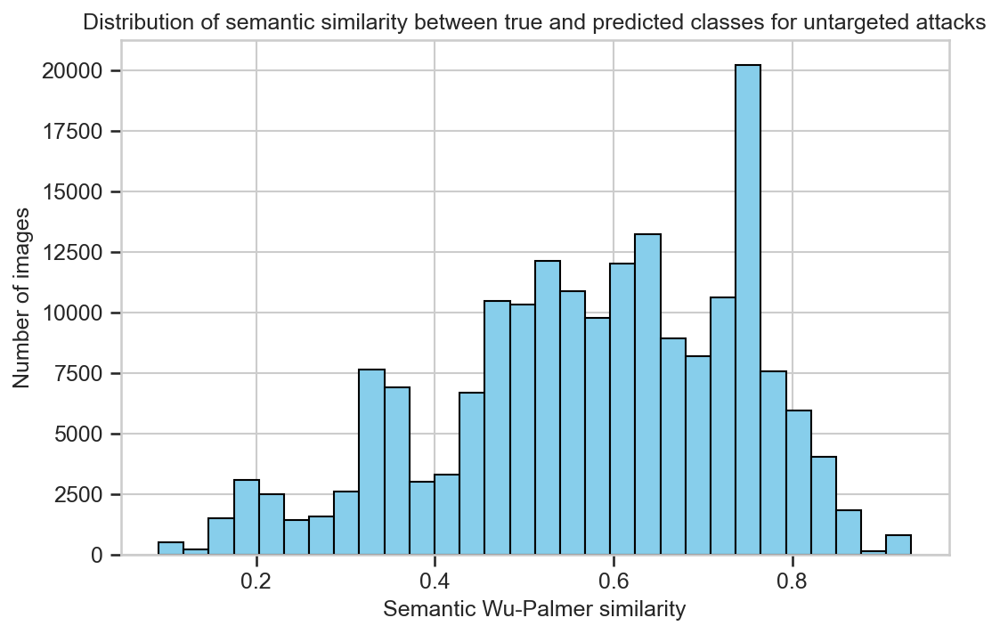

In [10]:

# Cache synsets to speed up repeated lookups
unique_wnids = pd.unique(untargeted_df[['wnid_true_class', 'wnid_pred_class']].values.ravel())
class_to_syn = {cls: wnid_to_synset(cls) for cls in unique_wnids if cls is not None}


# Calculate distance for each row, avoid None wnids
untargeted_wnid_df = untargeted_df[untargeted_df['wnid_true_class'].notnull() & untargeted_df['wnid_pred_class'].notnull() & (untargeted_df["attack"].isin(results_df["attack"].unique())) & (untargeted_df["method"] == "FullGrad")]

untargeted_wnid_df['class_distance'] = untargeted_wnid_df.apply(
    lambda row: synset_distance(class_to_syn[row['wnid_true_class']], class_to_syn[row['wnid_pred_class']]),
    axis=1
)

# Plot histogram
plt.figure(figsize=(8,5))
plt.hist(targeted_wnid_df['class_distance'].dropna(), bins=30, color='skyblue', edgecolor='black')
plt.xlabel("Semantic Wu-Palmer similarity")
plt.ylabel("Number of images")
plt.title("Distribution of semantic similarity between true and predicted classes for untargeted attacks")
plt.show()

In [296]:
untargeted_wnid_df['class_distance'].describe()

count    21559.000000
mean         0.633317
std          0.207571
min          0.083333
25%          0.500000
50%          0.666667
75%          0.800000
max          1.000000
Name: class_distance, dtype: float64

In [297]:
targeted_wnid_df["class_distance"].describe()

count    20905.000000
mean         0.576460
std          0.167514
min          0.090909
25%          0.476190
50%          0.588235
75%          0.722222
max          0.933333
Name: class_distance, dtype: float64

In [11]:
from scipy.stats import gaussian_kde

def plot_class_distance_distribution(targeted_df, untargeted_df):    
    plt.figure(figsize=(8, 6))
    
    # Get clean data
    targeted_data = targeted_df["class_distance"].dropna()
    untargeted_data = untargeted_df["class_distance"].dropna()
    
    # Plot with seaborn
    sns.kdeplot(targeted_data, label="Targeted", fill=True, alpha=0.5, color="orange")
    sns.kdeplot(untargeted_data, label="Untargeted", fill=True, alpha=0.5, color="purple")
    
    # Calculate means
    target_mean = targeted_data.mean()
    untargeted_mean = untargeted_data.mean()
    
    # Create KDE objects to get exact heights
    target_kde = gaussian_kde(targeted_data)
    untargeted_kde = gaussian_kde(untargeted_data)
    
    # Get heights at means
    target_height = target_kde(target_mean)[0]
    untargeted_height = untargeted_kde(untargeted_mean)[0]
    
    # Draw vertical lines
    plt.vlines(target_mean, 0, target_height, color="orange", linestyle=":", 
              label=f"Targeted mean = {target_mean:.2f}")
    plt.vlines(untargeted_mean, 0, untargeted_height, color="purple", linestyle=":", 
              label=f"Untargeted mean = {untargeted_mean:.2f}")

    plt.xlabel("Wu-Palmer class similarity")
    plt.ylabel("Density")
    plt.title("Class similarity distribution of targeted vs untargeted attacks")
    plt.legend(loc="upper left")
    plt.savefig("results/big_dataset/targeted_vs_untargeted_class_distance_distribution.svg", format="svg", bbox_inches='tight')
    plt.show()

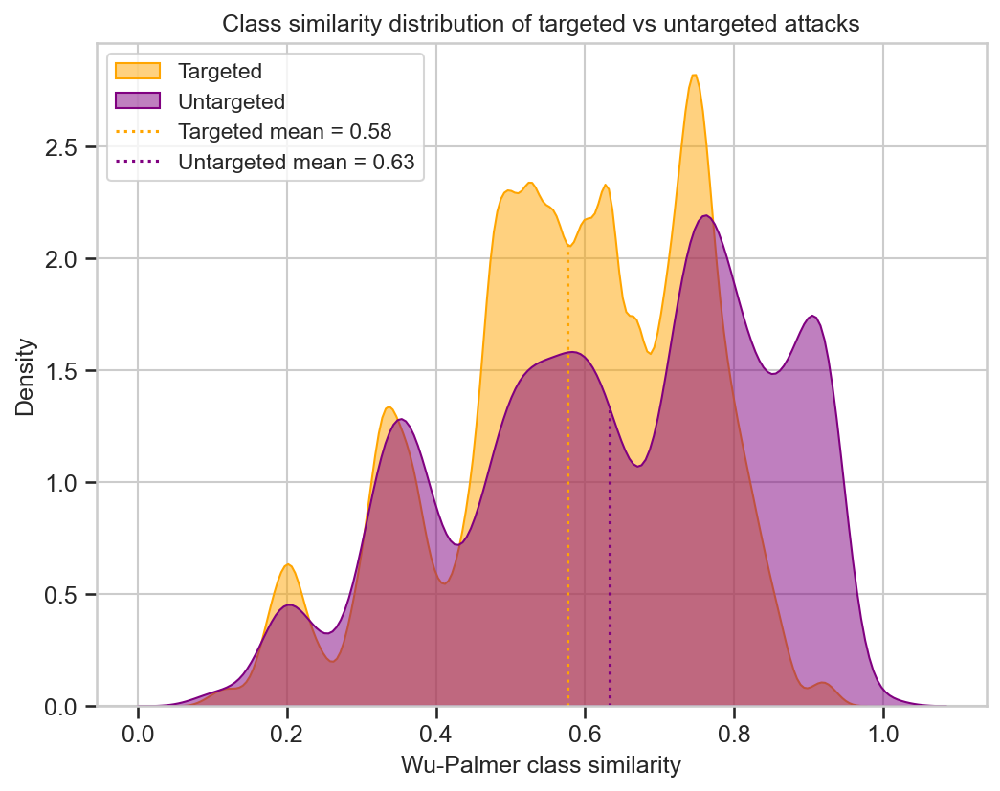

In [12]:
plot_class_distance_distribution(targeted_wnid_df, untargeted_wnid_df)  

/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_53185/1438491536.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method_df['class_distance'] = method_df.apply(


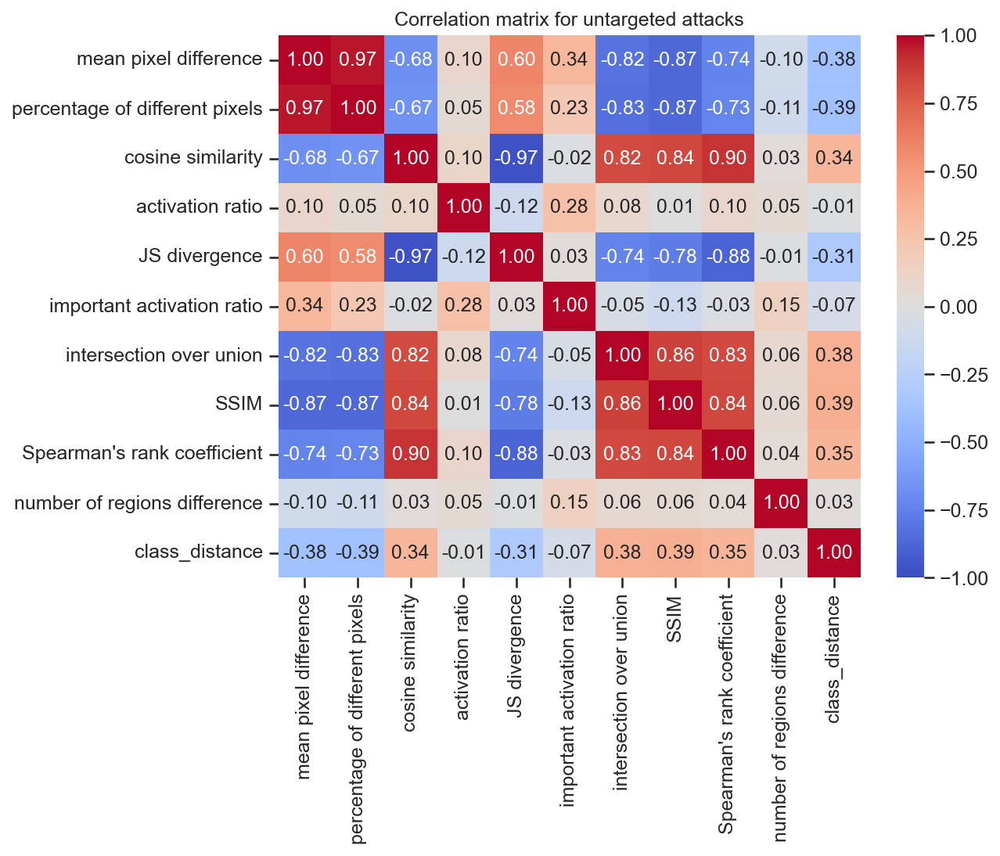

In [65]:
# check correlation between class distance and metrics for targeted attacks per explanation method

import scipy.stats as stats 

method_df = untargeted_df[untargeted_df['wnid_true_class'].notnull() & untargeted_df['wnid_pred_class'].notnull() & (untargeted_df["attack"].isin(results_df["attack"].unique()))]
method_df['class_distance'] = method_df.apply(
    lambda row: synset_distance(class_to_syn[row['wnid_true_class']], class_to_syn[row['wnid_pred_class']]),
    axis=1
)
# plot correlation matrix
plt.figure(figsize=(8, 6))
corr = method_df[metric_columns + ["class_distance"]].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title(f"Correlation matrix for untargeted attacks")
plt.show()


/var/folders/1w/ytjjn1392fd518g9vmt57xl80000gn/T/ipykernel_75227/3373989321.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method_df['class_distance'] = method_df.apply(


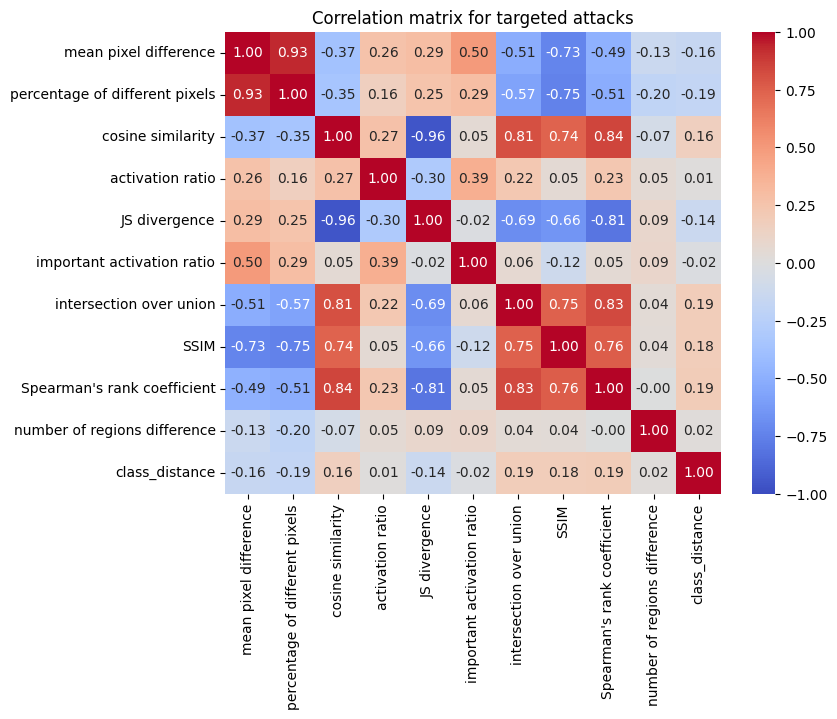

In [307]:
method_df = results_df[results_df['wnid_true_class'].notnull() & results_df['wnid_pred_class'].notnull() & (results_df["attack"].isin(results_df["attack"].unique()))]
method_df['class_distance'] = method_df.apply(
    lambda row: synset_distance(class_to_syn[row['wnid_true_class']], class_to_syn[row['wnid_pred_class']]),
    axis=1
)
# plot correlation matrix
plt.figure(figsize=(8, 6))
corr = method_df[metric_columns + ["class_distance"]].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title(f"Correlation matrix for targeted attacks")
plt.show()

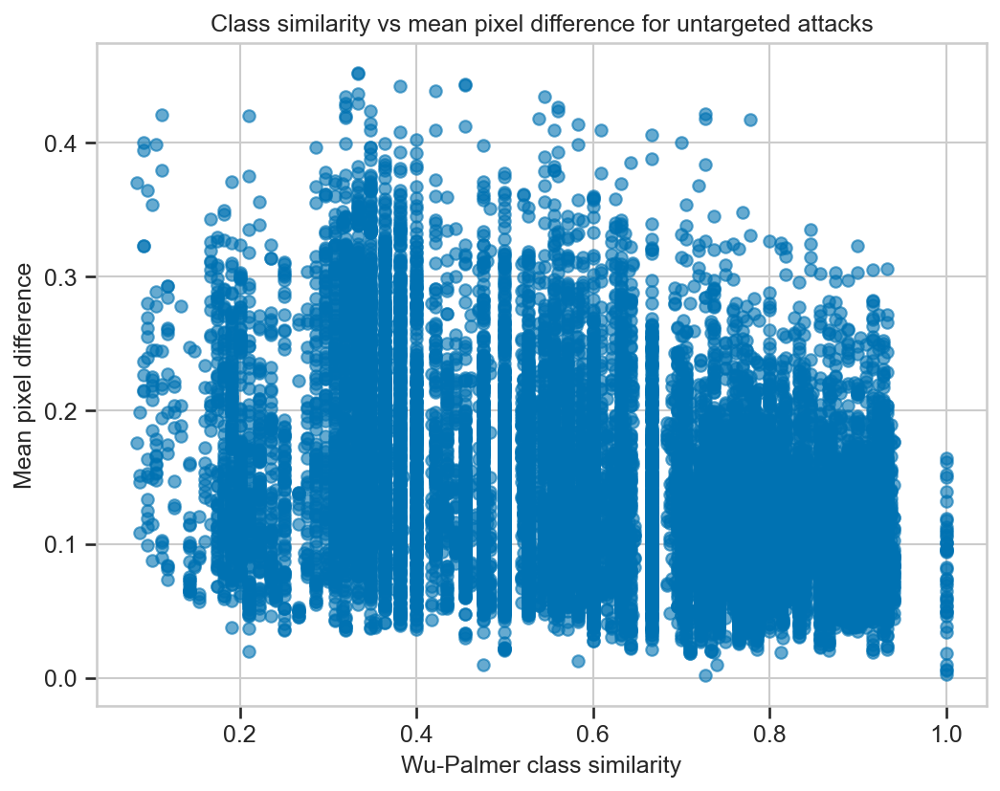

In [66]:
# plot class distance against mean pixel difference for untargeted attacks and add regression line
plt.figure(figsize=(8,6))
plt.scatter(untargeted_wnid_df["class_distance"], untargeted_wnid_df["mean pixel difference"], alpha=0.6)
plt.xlabel("Wu-Palmer class similarity")
plt.ylabel("Mean pixel difference")
plt.title("Class similarity vs mean pixel difference for untargeted attacks")

# Add regression line
plt.grid(True)
#plt.savefig("results/big_dataset/untargeted_class_distance_vs_mean_pixel_difference.svg", format="svg", bbox_inches='tight')
plt.show()

In [265]:
syn1 = wnid_to_synset(name_to_wnid.get("street sign"))

syn1

Synset('street_sign.n.01')

In [266]:
syn2 = wnid_to_synset(name_to_wnid.get("traffic light"))

syn2

Synset('traffic_light.n.01')

In [309]:
syn3 = wnid_to_synset(name_to_wnid.get("electric locomotive"))

syn1.wup_similarity(syn3)

0.125

In [288]:
# check how often prediction for targeted is the same as for untargeted attack


# match dataframes on image ID and attack
comparison_df = untargeted_wnid_df.merge(targeted_wnid_df, on=["image ID", "attack"], suffixes=("_untargeted", "_targeted"), how="inner")

comparison_df

,image ID,method_untargeted,attack,true class_untargeted,predicted class_untargeted,images mean difference_untargeted,original score_untargeted,adversarial score_untargeted,mean pixel difference_untargeted,percentage of different pixels_untargeted,...,JS divergence_targeted,important activation ratio_targeted,intersection over union_targeted,SSIM_targeted,Spearman's rank coefficient_targeted,number of regions difference_targeted,class_distance_targeted,wnid,wnid_true_class_targeted,wnid_pred_class_targeted
0,0,GradCAM,Linf Proj. Gradient Descent (PGD),tench,reel,0.000263,0.539809,0.018266,0.237050,47.959184,...,0.538301,1.754302,0.000000,0.236471,-0.615579,0,0.307692,n01440764,n01440764,n04258138
1,2,GradCAM,Linf Proj. Gradient Descent (PGD),tench,barracouta,0.000588,0.565741,0.006538,0.110086,21.920839,...,0.096634,0.950924,0.471623,0.497213,0.647270,0,0.296296,n01440764,n01440764,n04259630
2,3,GradCAM,Linf Proj. Gradient Descent (PGD),goldfish,ladybug,0.000069,0.279218,0.995847,0.144021,28.569436,...,0.164204,0.462521,0.188770,0.401267,0.289894,1,0.562500,n01443537,n01443537,n01682714
3,4,GradCAM,Linf Proj. Gradient Descent (PGD),goldfish,puffer,0.000060,0.342394,0.007363,0.264112,49.549585,...,0.171527,0.495728,0.182043,0.322347,0.193484,0,0.482759,n01443537,n01443537,n02226429
4,5,GradCAM,Linf Proj. Gradient Descent (PGD),goldfish,custard apple,0.000067,0.414258,0.011019,0.208694,40.716677,...,0.334211,1.050287,0.085334,0.281683,-0.380898,0,0.482759,n01443537,n01443537,n01773549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20673,2992,GradCAM,L2 Carlini Wagner Attack,bolete,mushroom,0.000014,0.446443,0.200698,0.041543,0.284997,...,0.624197,0.255109,0.099606,0.128184,-0.216403,0,0.533333,n13054560,n13054560,n03724870
20674,2994,GradCAM,L2 Carlini Wagner Attack,ear,corn,0.000003,0.425354,0.279660,0.031265,0.338807,...,0.629529,0.483266,0.018523,0.324687,-0.439349,0,0.857143,n13133613,n13133613,n07768694
20675,2995,GradCAM,L2 Carlini Wagner Attack,ear,corn,0.000008,0.277503,0.192794,0.030928,0.000000,...,0.571919,0.485834,0.000000,0.192592,-0.489644,-1,0.363636,n13133613,n13133613,n01985128
20676,2997,GradCAM,L2 Carlini Wagner Attack,toilet tissue,paper towel,0.000003,0.311977,0.178916,0.076898,13.229432,...,0.444197,1.250000,0.055816,0.164415,0.064464,0,0.210526,n15075141,n15075141,n02992529


In [289]:
# for each row check if predicted class is the same
comparison_df["same_prediction"] = comparison_df["predicted class_untargeted"] == comparison_df["predicted class_targeted"]
comparison_df["same_prediction"].value_counts()

same_prediction
False    20672
True         6
Name: count, dtype: int64